# Final Project - A Meeting Transcription System

We have been using Zoom/Google Meet/Chime for remote lecturing, group discussion, exam proctoring... and you might already be familiar with many of its functionalities. In this final project, you will implement a simplified **meeting transcription system** that allows you to perform the **speech diarization** task with a meeting-like long recording.

Remember that we mentioned in the previous homework that the task of speech diarization is to solve **who speaks what at when**. After the four coding homework, we now know that the system needs at least three modules: a **vocal activity detector** to find out the periods that there are people speaking (*when*), a **speaker identification module** to determine the active speakers (*who*), and a **speech recognition module** to transcribe the spoken words (*what*). Given that we may have overlapping speech in a meeting, a **speech separation module** can also be necessary to deal with those segments. Fortunately you have all gained experience on the four sub-systems, and now it's time to combine all of them to build a full pipeline for this meeting transcription system.

Here you will be asked to ***overfit*** your system on a 2-minute recording containing 4 active speakers. Let's first take a look at the data.

In [1]:
import numpy as np
import librosa
import os
import time
import soundfile as sf

import matplotlib.pyplot as plt
from IPython.display import Audio

In [2]:
# load the audio and the label
sr = 16000
audio, _ = librosa.load('audio.wav', sr=16000)
label = np.load('label.npy', allow_pickle=True).item()

In [3]:
# listen to the audio
Audio(audio, rate=sr)

In [4]:
# take a look at the label
label

{'Speaker 1': {'Segment 1': {'Start': 22.723978357231125,
   'End': 26.819978357231125,
   'Text': 'ONE WHO WRITES OF SUCH AN ERA LABOURS UNDER A TROUBLESOME DISADVANTAGE'},
  'Segment 2': {'Start': 60.43879936299203,
   'End': 63.76679936299203,
   'Text': 'THE VERY EMPERORS HAD ARRAYED THEMSELVES ON HER SIDE'},
  'Segment 3': {'Start': 81.56636802097503,
   'End': 85.43836802097503,
   'Text': 'BUT IF THE EMPERORS HAD BECOME CHRISTIAN THE EMPIRE HAD NOT'},
  'Segment 4': {'Start': 86.05732416302824,
   'End': 89.73732416302825,
   'Text': 'THE MENS SANA MUST HAVE A CORPUS SANUM TO INHABIT'},
  'Segment 5': {'Start': 92.7392943983688,
   'End': 96.6432943983688,
   'Text': 'AND THE NEW BLOOD AT THE ERA OF THIS STORY WAS AT HAND'},
  'Audio': array([0., 0., 0., ..., 0., 0., 0.])},
 'Speaker 2': {'Segment 1': {'Start': 8.508374731142482,
   'End': 11.61237473114248,
   'Text': 'SHASTA RAMBLES AND MODOC MEMORIES'},
  'Segment 2': {'Start': 29.54221387427849,
   'End': 34.05421387427849,


The organization of the provided label is as follows. The *label* is a dictionary containing each of the 4 speaker's active period (with *Start* and *End* denoting the starting and ending times in second) and the transcription for each segment. The *Audio* contains a 2-minute audio containing only that speaker's sound.

In [5]:
# label organization
print(label['Speaker 1']['Segment 2']['Start'])
print(label['Speaker 1']['Segment 2']['End'])
print(label['Speaker 1']['Segment 2']['Text'])

60.43879936299203
63.76679936299203
THE VERY EMPERORS HAD ARRAYED THEMSELVES ON HER SIDE


In [6]:
# listen to the speaker's 2-minute audio
Audio(label['Speaker 1']['Audio'], rate=sr)

With the help of the [pyannote-metrics](http://pyannote.github.io/pyannote-metrics/index.html) package, we can have a better visualization on the speakers' activations. Install this package by your own, and check its [tutorial page](http://pyannote.github.io/pyannote-metrics/tutorial.html) for the proper usage.

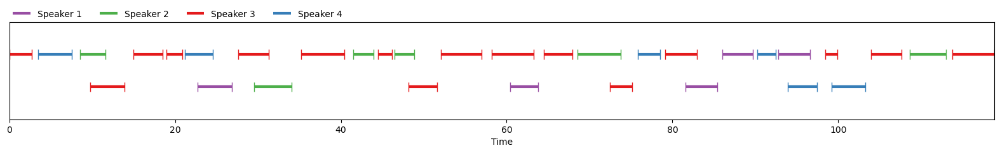

In [7]:
# better visualization
import pickle
from pyannote.core import Segment, Timeline, Annotation
from pyannote.metrics.diarization import DiarizationErrorRate

# I've already saved the label, here we simply load it
reference_pyannote = pickle.load(open("diarization_label.pkl", "rb"))

# visualization
reference_pyannote

In [8]:
# or get the information
print(reference_pyannote)

[ 00:00:00.000 -->  00:00:02.688] _ Speaker 3
[ 00:00:03.436 -->  00:00:07.532] _ Speaker 4
[ 00:00:08.508 -->  00:00:11.612] _ Speaker 2
[ 00:00:09.766 -->  00:00:13.862] _ Speaker 3
[ 00:00:14.968 -->  00:00:18.520] _ Speaker 3
[ 00:00:18.958 -->  00:00:20.878] _ Speaker 3
[ 00:00:21.168 -->  00:00:24.528] _ Speaker 4
[ 00:00:22.723 -->  00:00:26.819] _ Speaker 1
[ 00:00:27.632 -->  00:00:31.280] _ Speaker 3
[ 00:00:29.542 -->  00:00:34.054] _ Speaker 2
[ 00:00:35.201 -->  00:00:40.417] _ Speaker 3
[ 00:00:41.471 -->  00:00:43.935] _ Speaker 2
[ 00:00:44.491 -->  00:00:46.187] _ Speaker 3
[ 00:00:46.490 -->  00:00:48.826] _ Speaker 2
[ 00:00:48.132 -->  00:00:51.588] _ Speaker 3
[ 00:00:52.042 -->  00:00:56.938] _ Speaker 3
[ 00:00:58.190 -->  00:01:03.246] _ Speaker 3
[ 00:01:00.438 -->  00:01:03.766] _ Speaker 1
[ 00:01:04.512 -->  00:01:07.968] _ Speaker 3
[ 00:01:08.576 -->  00:01:13.760] _ Speaker 2
[ 00:01:12.462 -->  00:01:15.118] _ Speaker 3
[ 00:01:15.857 -->  00:01:18.481] 

Your meeting transcription system should do the following two things:
- Generate a speaker activity timeline as the one visualized above.
- Transcribe each speaker's active segments into texts.

Here is an example about the design of the pipeline:
1. Train a **VAD** to detect speech/nonspeech regions in the audio. You can easily extract the oracle nonspeech regions by examine the start/end times of all the segments, and you can use either a SVM or a neural network for your VAD. The VAD can segment the 2-minute audio into multiple shorter blocks whose boundaries are the nonspeech periods.
2. For each of the segments split by the VAD, detect whether there are speaker overlap. Again, the target label for overlap/nonoverlap can be easily calculated by the start/end times. If a segment contains overlap, train a **speech separator** to separate the two audio clips. There are two ways you can do it:
 - Train an **acoustic-event-detection module** to perform segment-level binary classification to see if each segment contains overlap. Only apply the separator to the ones with overlap.
 - Ask the speech separation network to always perform separation. For the segments who only has 1 active speaker, set the other separation target to an all-zero audio. For the all-zero separation outputs, discard them and don't use them in the upcoming steps.
   
  After this step, each segment should contain 1 or 2 single-speaker utterances. In the cases where the utterances are not fully overlapped in the segment, recalculate the start/end times of all the utterances.
3. For each single-speaker utterance in each segment, train a **speaker identification module** to determine the speaker information.
4. For each single-speaker utterance in each segment, train an **ASR module** to transcribe it into text.

You can also use any other pipelines that you come up with, only to make sure that your system's output should be both the speaker activity annotation like the one above, and the transcribed texts for each of the speakers. You can use any of the released sample solultions for the 4 coding homework in this project. Again, remember that you only need to ***overfit*** your model on this 2-minute sample.

We will not have a strict performance requirement for this final project and the grading will be based on your overall implementation. Try your best to achieve a good enough accuracy!

In [9]:
# TODO: build your meeting transcription system

# Data Visualization

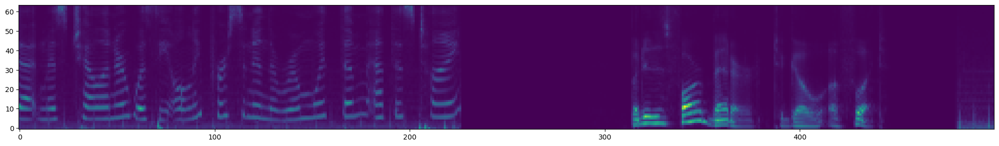

In [10]:
# visualize the audio mel spec
import warnings
warnings.filterwarnings('ignore')

mel_spec = librosa.feature.melspectrogram(audio, sr, n_fft=512, hop_length=256, win_length=512, n_mels=64) # [64, 7501]
plt.figure(figsize=(20, 5))
plt.imshow(mel_spec[:,2300:2800]**0.33, origin='lower')
plt.tight_layout()

In [11]:
# label the ground truth of VAD label
label_vad = np.zeros(mel_spec.shape[1]) # [7501,]
for speaker in label.keys():
    for segment in label[speaker].keys():
        if segment == 'Audio':
            break
        # collect start time and end time for each segment
        start_time = label[speaker][segment]['Start']
        end_time = label[speaker][segment]['End']
        
        # frame start time and end time
        start_frame = round(start_time * sr / 256 + 1)
        end_frame = round(end_time * sr / 256 + 1)
        
        # label the ground truth
        label_vad[start_frame:end_frame+1] = 1

### visualize part of the frame

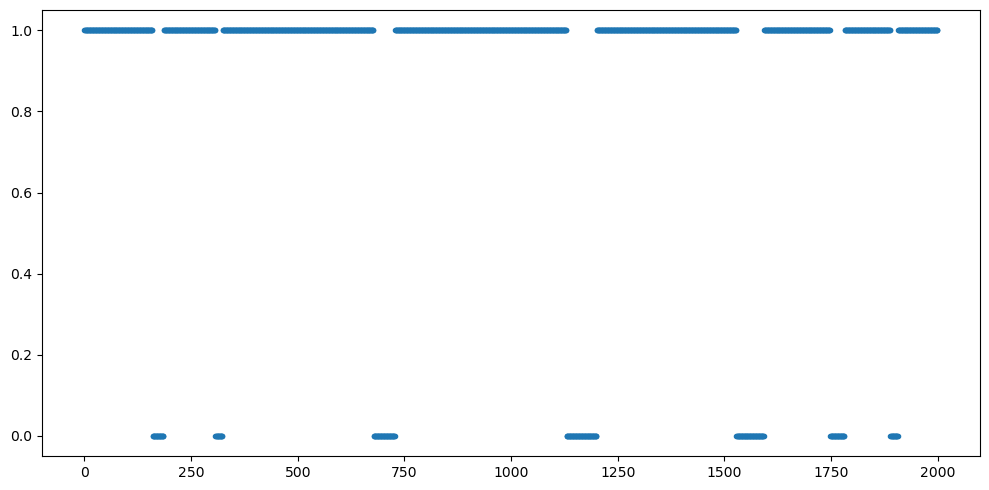

In [12]:
plt.figure(figsize=(10, 5))
plt.plot(label_vad[1000:3000], '.')
plt.tight_layout()

### visualize all of the frame

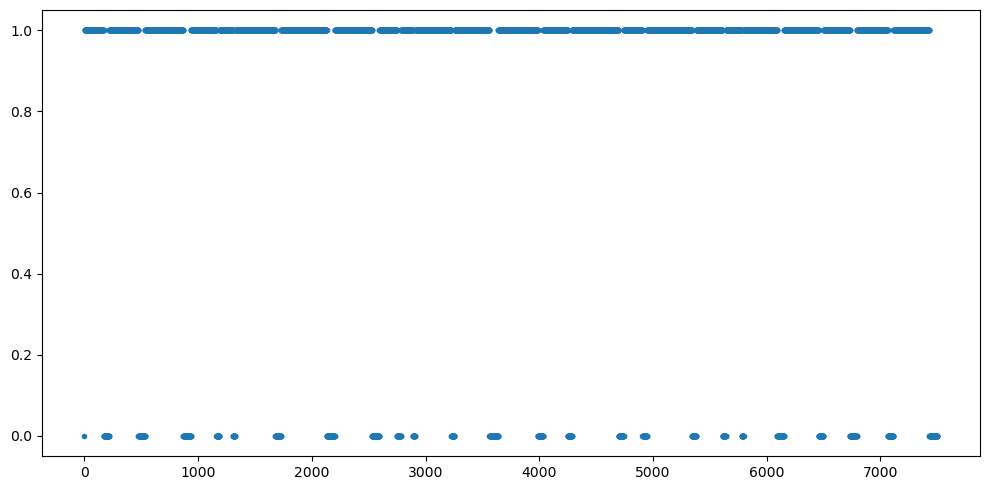

In [13]:
plt.figure(figsize=(10, 5))
plt.plot(label_vad, '.')
plt.tight_layout()

# VAD

##### reuse the model pipeline written by myself

In [14]:
# preprocess the audio MVN
train_mean = np.mean(mel_spec, 1)
train_var = np.var(mel_spec, 1)
mvn_mel_spec = (mel_spec - train_mean[:,np.newaxis]) / train_var[:,np.newaxis]

In [15]:
# implement accuracy calculation
def Accuracy(predicts, labels):
    ground_truth = (predicts==labels)
    ground_truth = ground_truth*1
    ground_truth = ground_truth
    return ground_truth.sum()/len(ground_truth)

In [16]:
import torch
import torch.nn as nn
import torch.nn.functional as F
import torch.optim as optim

class MLP(nn.Module):
    def __init__(self, feature_dim):
        super(MLP, self).__init__()
        self.feature_dim = feature_dim
        
        self.layer1 = nn.Sequential(nn.Linear(self.feature_dim, 128))
        self.layer2 = nn.Sequential(nn.Linear(128, 256))
        self.layer3 = nn.Sequential(nn.Linear(256, 128))
        self.layer4 = nn.Sequential(nn.Linear(128, 64))
        self.layer5 = nn.Sequential(nn.Linear(64, 32))
        self.layer6 = nn.Sequential(nn.Linear(32, 1),
                                    nn.Sigmoid()
                                   )

    def forward(self, input):
        output = self.layer1(input)
        output = self.layer2(output)
        output = self.layer3(output) 
        output = self.layer4(output)
        output = self.layer5(output)
        output = self.layer6(output)
        
        return output

In [17]:
def BCE(probs, labels, eps=1e-9):

    return -torch.mean(labels*torch.log(probs+eps) + (1-labels)*torch.log(1-probs+eps))

In [18]:
from torch.utils.data import Dataset, TensorDataset, DataLoader

train_data = mvn_mel_spec[:,:5000]
train_label = label_vad[:5000]
val_data = mvn_mel_spec[:,5000:]
val_label = label_vad[5000:]

batch_size = 32 # Pass it to DataLoader. Feel free to change it.
train_dataset = TensorDataset(torch.tensor(train_data.T), torch.tensor(train_label))
val_dataset = TensorDataset(torch.tensor(val_data.T), torch.tensor(val_label))
test_dataset = TensorDataset(torch.tensor(mvn_mel_spec.T), torch.tensor(label_vad))
train_loader = DataLoader(train_dataset, batch_size=batch_size, shuffle=True)
val_loader = DataLoader(val_dataset, batch_size=batch_size, shuffle=False)
test_loader = DataLoader(test_dataset, batch_size=batch_size, shuffle=False)

In [19]:
def train(model, loader, opt, loss_fn):
    model.train()
    train_loss_batch = []
    acc = []
    
    for data, labels in loader:
        opt.zero_grad()
        pred = model(data)
        pred = pred.squeeze()      
        loss = loss_fn(pred.float(), labels.float())
        loss.backward()
        opt.step()     
        # record loss
        train_loss_batch.append(loss.item())
        
    train_loss_epoch = sum(train_loss_batch) / len(train_loss_batch)
       
    return float(train_loss_epoch)


def validate(model, loader, criterion, return_results=False):
    model.eval()
    # probs is probability between 0 and 1;
    # predicts is prediced label of 0 or 1.
    all_labels, all_probs, all_predicts \
        = torch.zeros(0), torch.zeros(0), torch.zeros(0)
    
    with torch.no_grad():
        for data, labels in loader:
            pred = model(data)
            predicts = pred.round()
            
            probs = pred.squeeze()
            predicts = predicts.squeeze()
            
            all_labels = torch.cat([all_labels, labels])
            all_probs = torch.cat([all_probs, probs])
            all_predicts = torch.cat([all_predicts, predicts])    
    
    all_predicts = all_predicts.squeeze()
    val_acc_epoch = criterion(all_predicts, all_labels)
    
    
    if return_results:
        return float(val_acc_epoch), (all_probs, all_predicts, all_labels)
    else:
        return float(val_acc_epoch)

In [20]:
# model implementation
mlp = MLP(feature_dim=64)
opt = optim.Adam(mlp.parameters(), lr=1e-3)

# hyperparameters
total_epoch = 200  # train the model for ? epochs
model_save = 'best_MLP_VAD.pt'  # path to save the best validation model

# main function
train_loss = []
val_acc = []

for epoch in range(1, total_epoch + 1):
    # train with val_loader and torch built-in bce function
    train_loss_epoch = train(mlp, train_loader, opt, BCE) 

    # val with val_loader and torch built-in acc function
    val_acc_epoch = validate(mlp, val_loader, Accuracy) 
  
    train_loss.append(train_loss_epoch)
    val_acc.append(val_acc_epoch)
    
    print(f'Epoch No.{epoch}:')
    print(f'      Training loss: {str(round(train_loss_epoch, 3))}')
    print(f'      Validation accuracy: {str(round(val_acc_epoch*100, 3))}%')
    
    if train_loss[-1] == np.min(train_loss):
        print('      Best training model found.')
    if val_acc[-1] == np.max(val_acc):
        # save current best model on validation set
        with open(model_save, 'wb') as f:
            torch.save(mlp.state_dict(), f)
            print('      Best validation model found and saved.')
    
    print('-' * 79)
    

Epoch No.1:
      Training loss: 0.646
      Validation accuracy: 84.446%
      Best training model found.
      Best validation model found and saved.
-------------------------------------------------------------------------------
Epoch No.2:
      Training loss: 0.472
      Validation accuracy: 83.846%
      Best training model found.
-------------------------------------------------------------------------------
Epoch No.3:
      Training loss: 0.395
      Validation accuracy: 83.567%
      Best training model found.
-------------------------------------------------------------------------------
Epoch No.4:
      Training loss: 0.355
      Validation accuracy: 83.766%
      Best training model found.
-------------------------------------------------------------------------------
Epoch No.5:
      Training loss: 0.355
      Validation accuracy: 81.687%
      Best training model found.
-------------------------------------------------------------------------------
Epoch No.6:
      Tr

Epoch No.50:
      Training loss: 0.247
      Validation accuracy: 87.685%
-------------------------------------------------------------------------------
Epoch No.51:
      Training loss: 0.233
      Validation accuracy: 90.924%
      Best training model found.
-------------------------------------------------------------------------------
Epoch No.52:
      Training loss: 0.231
      Validation accuracy: 85.286%
      Best training model found.
-------------------------------------------------------------------------------
Epoch No.53:
      Training loss: 0.241
      Validation accuracy: 85.286%
-------------------------------------------------------------------------------
Epoch No.54:
      Training loss: 0.234
      Validation accuracy: 98.681%
      Best validation model found and saved.
-------------------------------------------------------------------------------
Epoch No.55:
      Training loss: 0.252
      Validation accuracy: 85.286%
---------------------------------------

Epoch No.102:
      Training loss: 0.234
      Validation accuracy: 85.246%
-------------------------------------------------------------------------------
Epoch No.103:
      Training loss: 0.229
      Validation accuracy: 85.246%
-------------------------------------------------------------------------------
Epoch No.104:
      Training loss: 0.228
      Validation accuracy: 85.246%
-------------------------------------------------------------------------------
Epoch No.105:
      Training loss: 0.226
      Validation accuracy: 85.246%
-------------------------------------------------------------------------------
Epoch No.106:
      Training loss: 0.216
      Validation accuracy: 85.246%
      Best training model found.
-------------------------------------------------------------------------------
Epoch No.107:
      Training loss: 0.228
      Validation accuracy: 87.125%
-------------------------------------------------------------------------------
Epoch No.108:
      Training lo

Epoch No.154:
      Training loss: 0.238
      Validation accuracy: 88.804%
-------------------------------------------------------------------------------
Epoch No.155:
      Training loss: 0.24
      Validation accuracy: 85.286%
-------------------------------------------------------------------------------
Epoch No.156:
      Training loss: 0.227
      Validation accuracy: 93.323%
-------------------------------------------------------------------------------
Epoch No.157:
      Training loss: 0.226
      Validation accuracy: 85.246%
-------------------------------------------------------------------------------
Epoch No.158:
      Training loss: 0.223
      Validation accuracy: 82.567%
-------------------------------------------------------------------------------
Epoch No.159:
      Training loss: 0.237
      Validation accuracy: 90.044%
-------------------------------------------------------------------------------
Epoch No.160:
      Training loss: 0.224
      Validation accurac

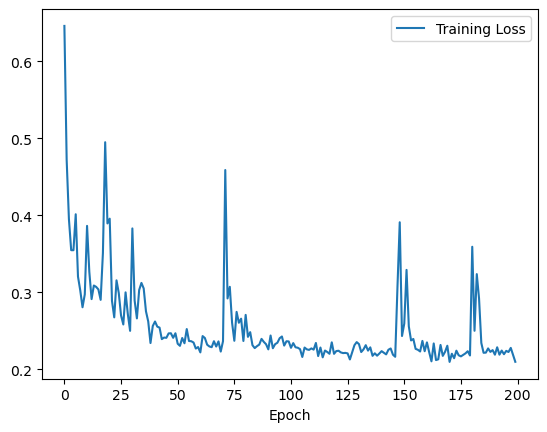

In [21]:
plt.plot(train_loss, label='Training Loss')
plt.xlabel('Epoch')
plt.legend()

### label smoothing

In [22]:
def smooth_predictions(predictions, window_size):
    # Pad the predictions with zeros at the start and end to handle edge cases
    padded_predictions = np.pad(predictions, (window_size // 2, window_size // 2), mode='edge')
    # Apply the moving average filter
    weights = np.ones(window_size) / window_size
    smoothed_predictions = np.convolve(padded_predictions, weights, mode='valid')
    return smoothed_predictions

In [23]:
best_model = MLP(feature_dim=64)
best_model.load_state_dict(torch.load(model_save))
train_acc, train_prob = validate(best_model, test_loader, Accuracy, return_results=True)
print(f'Training accuracy: {train_acc}')

Training accuracy: 0.9750699996948242


In [24]:
dummy_pred_label = train_prob[1]
smoo_pred = smooth_predictions(dummy_pred_label, 31).round()
smoo_acc = Accuracy(smoo_pred, label_vad)
print(f'Smoothed accuracy: {smoo_acc}')
# if smoothed_acc > train_acc, replace with smoothed prediction
if smoo_acc > train_acc:
    pred_label = smoo_pred
    print('Predicted output is smoothed.')
else:
    pred_label = dummy_pred_label

Smoothed accuracy: 0.9773363551526463
Predicted output is smoothed.


### visualize part of the frame

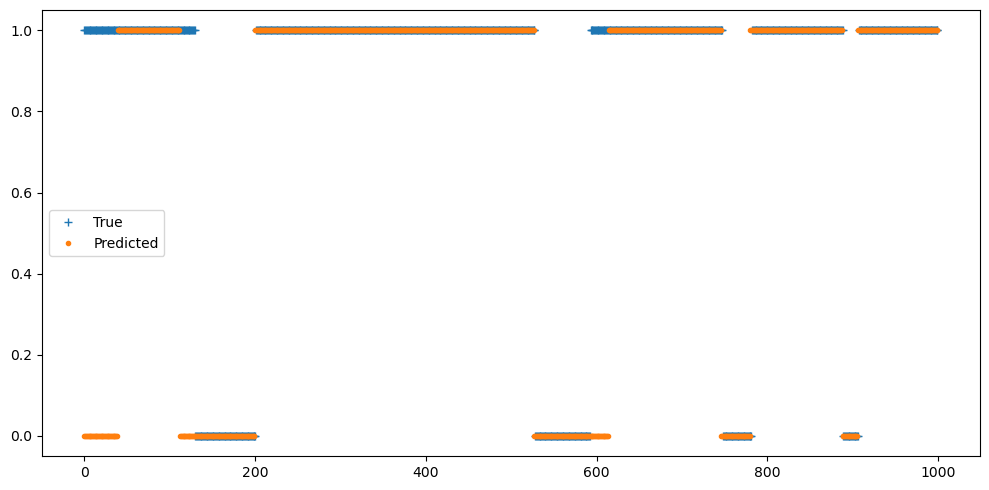

In [25]:
plt.figure(figsize=(10, 5))
plt.plot(label_vad[2000:3000], '+', label='True')
plt.plot(pred_label[2000:3000], '.', label='Predicted')
plt.legend()
plt.tight_layout()

### visualize all of the frame

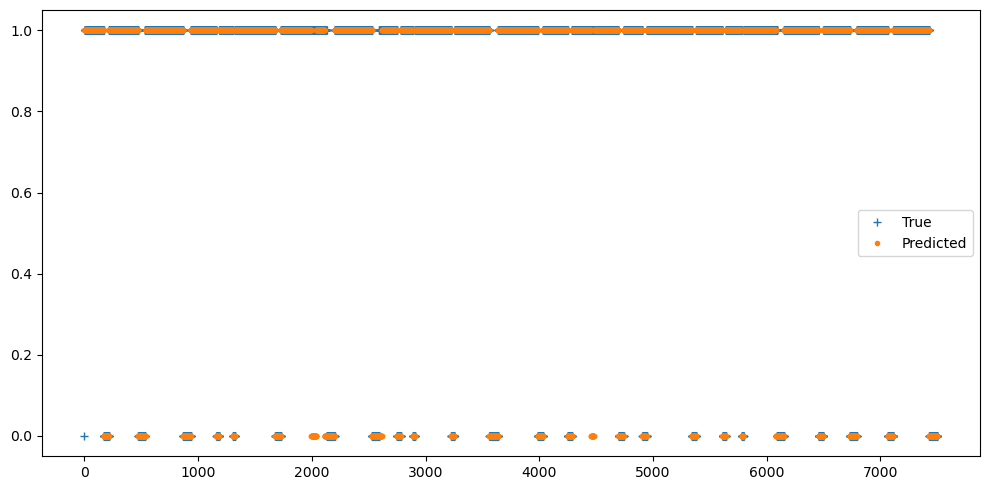

In [26]:
plt.figure(figsize=(10, 5))
plt.plot(label_vad, '+', label='True')
plt.plot(pred_label, '.', label='Predicted')
plt.legend()
plt.tight_layout()

In [27]:
def extract_boundary(labels, threshold=30):
    labels = np.asarray(labels)
    
    temp_start_end = []
    pair_start_end = []
    len_list = []

    for i in range(len(labels)):
        if temp_start_end: # ->11111(0) to find zero
            if labels[i] == 0:
                temp_start_end.append(i) # note if i == 0
                if temp_start_end[1] - temp_start_end[0] > threshold:
                    pair_start_end.append(temp_start_end.copy())
                    len_list.append(temp_start_end[1]-temp_start_end[0])
                temp_start_end = []
        else: # ->00000(1) to find one
            if labels[i] == 1:
                temp_start_end.append(i)
                
    return pair_start_end, len_list

### extract the boundary (start_index, end_index)

In [28]:
audio_spec = mvn_mel_spec.T
pred_boundary, pred_len_list = extract_boundary(pred_label)
true_boundary, true_len_list = extract_boundary(label_vad)

print(f'True segmentation length: \n{true_len_list}')
print(f'\nPredicted segmentation length: \n{pred_len_list}')

True segmentation length: 
[169, 257, 335, 223, 121, 354, 402, 327, 155, 107, 319, 307, 349, 217, 410, 165, 396, 231, 141, 294, 304, 233, 273, 315]

Predicted segmentation length: 
[169, 257, 330, 224, 121, 354, 268, 73, 327, 132, 108, 320, 308, 349, 217, 168, 217, 165, 397, 231, 140, 285, 304, 234, 273, 315]


In [29]:
def extract_audio(audio, boundary):
    audio_list = []
    for pair_start_end in boundary:
        start_index = pair_start_end[0] * 256
        end_index = pair_start_end[1] * 256
        audio_list.append(audio[start_index:end_index+1])
    return np.asarray(audio_list)

In [30]:
# extract the audio segments
pred_audio_blocks = extract_audio(audio, pred_boundary)
true_audio_blocks = extract_audio(audio, true_boundary)

### misclassified samples

#### true_audio[6] (402 frames) = predicted_audio[6] (268 frames) + predicted_audio[6] (73 frames)

In [31]:
Audio(true_audio_blocks[6], rate=sr) # 402

In [32]:
Audio(pred_audio_blocks[6], rate=sr) # 268

In [33]:
Audio(pred_audio_blocks[7], rate=sr) # 73

# Speech separation

### data preprocessing

In [34]:
# extract segments from 'label' for each speaker, with audio
# [start_frame, end_frame, audio] for each spk_index
def extract_start_end4single(label):
    # store the [start, end] for each speaker
    speaker_total_start_end = []
    for speaker in label.keys():
        # collect total_[start_time, end_time]
        total_start_end = []
        for segments in label[speaker].keys():
            if segments == 'Audio':
                continue       
            # extract indivudual [start_time, end_time] 
            start_end = []
            for details in label[speaker][segments].keys():
                if details == 'Text':
                    break
                start_end.append(label[speaker][segments][details]*sr)
            start_end.append((label[speaker]['Audio']))
            total_start_end.append(start_end.copy())
        speaker_total_start_end.append(total_start_end)
            
    return speaker_total_start_end
speaker_total_start_end4single = extract_start_end4single(label)
# check spk1
speaker_total_start_end4single[0]

[[363583.653715698, 429119.653715698, array([0., 0., 0., ..., 0., 0., 0.])],
 [967020.7898078725, 1020268.7898078725, array([0., 0., 0., ..., 0., 0., 0.])],
 [1305061.8883356005,
  1367013.8883356005,
  array([0., 0., 0., ..., 0., 0., 0.])],
 [1376917.186608452, 1435797.186608452, array([0., 0., 0., ..., 0., 0., 0.])],
 [1483828.7103739008,
  1546292.7103739008,
  array([0., 0., 0., ..., 0., 0., 0.])]]

In [35]:
# extract segments from 'label' for each speaker, without audio
# [start_frame, end_frame] for each spk_index
def extract_start_end(label):
    # store the [start, end] for each speaker
    speaker_total_start_end = []
    for speaker in label.keys():
        # collect total_[start_time, end_time]
        total_start_end = []
        for segments in label[speaker].keys():
            if segments == 'Audio':
                continue       
            # extract indivudual [start_time, end_time] 
            start_end = []
            for details in label[speaker][segments].keys():
                if details == 'Text':
                    break
                start_end.append(label[speaker][segments][details]*sr)
            total_start_end.append(start_end.copy())
        speaker_total_start_end.append(total_start_end)
            
    return speaker_total_start_end
speaker_total_start_end = extract_start_end(label)
# check spk1
speaker_total_start_end[0]

[[363583.653715698, 429119.653715698],
 [967020.7898078725, 1020268.7898078725],
 [1305061.8883356005, 1367013.8883356005],
 [1376917.186608452, 1435797.186608452],
 [1483828.7103739008, 1546292.7103739008]]

In [36]:
# make into dictionary
# key: spk_idx, val: [start_frame, end_frame]
speaker_dic = {}
for index, speaker in enumerate(speaker_total_start_end):
    speaker_dic[index] = speaker

speaker_dic

{0: [[363583.653715698, 429119.653715698],
  [967020.7898078725, 1020268.7898078725],
  [1305061.8883356005, 1367013.8883356005],
  [1376917.186608452, 1435797.186608452],
  [1483828.7103739008, 1546292.7103739008]],
 1: [[136133.9956982797, 185797.9956982797],
  [472675.42198845587, 544867.4219884558],
  [663549.8674709628, 702973.8674709628],
  [743851.3745849115, 781227.3745849114],
  [1097226.87311851, 1180170.87311851],
  [1738491.9752693593, 1808123.9752693593]],
 2: [[0, 43008.0],
  [156259.29474697195, 221795.29474697195],
  [239494.30918703077, 296326.3091870308],
  [303335.8968580453, 334055.89685804537],
  [442126.99047813384, 500494.99047813384],
  [563225.0554741321, 646681.0554741321],
  [711858.8814566686, 738994.8814566686],
  [770127.5537759833, 825423.5537759834],
  [832682.7210693397, 911018.7210693397],
  [931052.1802045809, 1011948.1802045808],
  [1032200.9275279436, 1087496.9275279436],
  [1159393.55365099, 1201889.55365099],
  [1265800.1542553995, 1327240.1542553

### true overlap segment

In [37]:
# extract true overlap segment from 'label'
# return [mix_time, spk1_time, spk2_time, audio1, audio2, spk1, spk2]
def extract_true_overlap_segment(speaker_dic, audio):
    overlaps = []
    number_speaker = len(speaker_dic.keys()) # 4
    for i in range(number_speaker): # check every speaker
        for start_end in speaker_dic[i]: # check ^ [start, end]
            for j in range(i+1, number_speaker): # check every other speaker
                for other_start_end in speaker_dic[j]: # check ^ [start, end]
                    # compare main_[start, end] to other_[start, end]
                    # start_end v.s. other_start_end
                    if other_start_end[0] < start_end[1] < other_start_end[1]:
                        # [mix_time, spk1_time, spk2_time, audio1, audio2, spk1, spk2]
                        overlaps.append([[int(other_start_end[0]), int(start_end[1])], [int(start_end[0]), int(start_end[1])], [int(other_start_end[0]), int(other_start_end[1])],
                                        label[f'Speaker {i+1}']['Audio'], label[f'Speaker {j+1}']['Audio'], [f'Speaker {i+1}'], [f'Speaker {j+1}']])
                    elif start_end[0] < other_start_end[1] < start_end[1]:
                        # [other_start_end[0], start_end[1]]
                        overlaps.append([[int(start_end[0]), int(other_start_end[1])], [int(start_end[0]), int(start_end[1])], [int(other_start_end[0]), int(other_start_end[1])],
                                        label[f'Speaker {i+1}']['Audio'], label[f'Speaker {j+1}']['Audio'], [f'Speaker {i+1}'], [f'Speaker {j+1}']])
                    
    return overlaps
true_overlap_seg = extract_true_overlap_segment(speaker_dic, audio)
true_overlap_seg[0]

[[363583, 392453],
 [363583, 429119],
 [338693, 392453],
 array([0., 0., 0., ..., 0., 0., 0.]),
 array([0., 0., 0., ..., 0., 0., 0.]),
 ['Speaker 1'],
 ['Speaker 4']]

### extract single-speaker segment

In [38]:
# extract true single-speaker segment from 'label'
# return [start_frame, end_frame, audio]
def filter_true_single_segment(speaker_total_start_end):
    speaker_single_start_end = {'Speaker 1': [],
                                'Speaker 2': [],
                                'Speaker 3': [],
                                'Speaker 4': []}
    speaker_dic = {}
    for index, speaker in enumerate(speaker_total_start_end):
        speaker_dic[index] = speaker
    for i in range(len(speaker_dic.keys())):
        for seg in speaker_dic[i]:
            find_overlap = False
            for j in range(i+1, len(speaker_dic.keys())):
                for other_seg in speaker_dic[j]:              
                    if abs(other_seg[0]-seg[0])/16000 < 0.5 and abs(other_seg[1]-seg[1])/16000 < 0.5:     
                        speaker_dic[j].remove([other_seg[0], other_seg[1], other_seg[2]])
                        find_overlap = True
            if find_overlap is False:
                speaker_single_start_end[f'Speaker {i+1}'].append([seg[0], seg[1], seg[2]])
                    
    return speaker_single_start_end
    
speaker_single_start_end = filter_true_single_segment(speaker_total_start_end4single)
speaker_single_start_end['Speaker 1']

[[363583.653715698, 429119.653715698, array([0., 0., 0., ..., 0., 0., 0.])],
 [967020.7898078725, 1020268.7898078725, array([0., 0., 0., ..., 0., 0., 0.])],
 [1305061.8883356005,
  1367013.8883356005,
  array([0., 0., 0., ..., 0., 0., 0.])],
 [1376917.186608452, 1435797.186608452, array([0., 0., 0., ..., 0., 0., 0.])],
 [1483828.7103739008,
  1546292.7103739008,
  array([0., 0., 0., ..., 0., 0., 0.])]]

In [39]:
# find the overlap for segment which only has one spk. set non-spk segment to spk-> None, audio -> 0
# return [mix, spk1, audio1, spk2, audio2, start_end]
def extract_true_pred_single_segment(speaker_single_start_end, pred_segments, audio):
    collect = []
    for spk in speaker_single_start_end.keys():
        for start_end_audio in speaker_single_start_end[spk]:
            true_start_frame = int(start_end_audio[0])
            true_end_frame = int(start_end_audio[1])
            audio = start_end_audio[2]
            for pred_start_end in pred_segments:
                pred_start_frame = pred_start_end[0] * 256
                pred_end_frame = pred_start_end[1] * 256
                if abs(true_start_frame/16000-pred_start_frame/16000) < 0.5 and abs(true_end_frame/16000-pred_end_frame/16000) < 0.5:
                    total = []
                    total.append(audio[pred_start_frame:pred_end_frame])
                    total.append(spk)
                    total.append(audio[pred_start_frame:pred_end_frame])
                    total.append('None')
                    total.append(np.zeros(pred_end_frame-pred_start_frame))
                    total.append([pred_start_frame,pred_end_frame])
                    collect.append(total)
  
    return collect
pred_true_single_seg = extract_true_pred_single_segment(speaker_single_start_end, pred_boundary, audio)
# check
pred_true_single_seg[0]

[array([-1.89567236e-05, -9.79431061e-05, -5.37107480e-05, ...,
         0.00000000e+00,  0.00000000e+00,  0.00000000e+00]),
 'Speaker 1',
 array([-1.89567236e-05, -9.79431061e-05, -5.37107480e-05, ...,
         0.00000000e+00,  0.00000000e+00,  0.00000000e+00]),
 'None',
 array([0., 0., 0., ..., 0., 0., 0.]),
 [1377024, 1436160]]

### extract two-speaker segment

In [40]:
# extract the overlap segment between true_label and pred_label
# return [mix, spk1, audio1, spk2, audio2, start_end]
def extract_true_pred_overlap_segment(true_overlap_segment, pred_segments, audio):
    pred_and_true_overlap_segment = []
    for start_end in pred_segments:
        start_frame = start_end[0] * 256
        end_frame = start_end[1] * 256
        for mix_time, spk1_time, spk2_time, audio1, audio2, spk1, spk2 in true_overlap_segment:
            if start_frame < mix_time[0] and end_frame > mix_time[1]:
                pred_and_true_overlap_segment.append(
                    [audio[mix_time[0]:mix_time[1]],
                    spk1, audio1[mix_time[0]:mix_time[1]],
                    spk2, audio2[mix_time[0]:mix_time[1]],
                    [mix_time[0], mix_time[1]]])
                
                pred_and_true_overlap_segment.append(
                    [audio[start_frame:mix_time[0]],
                    spk1 if abs(sum(audio1[start_frame:mix_time[0]])) > 0.0005 else 'None', audio1[start_frame:mix_time[0]],
                    spk2 if abs(sum(audio2[start_frame:mix_time[0]])) > 0.0005 else 'None', audio2[start_frame:mix_time[0]],
                    [start_frame, mix_time[0]]])
                if pred_and_true_overlap_segment[-1][1] == 'None' and pred_and_true_overlap_segment[-1][3] == 'None':
                    pred_and_true_overlap_segment.pop()
                
                pred_and_true_overlap_segment.append(
                    [audio[mix_time[1]:end_frame],
                    spk1 if abs(sum(audio1[mix_time[1]:end_frame])) > 0.0005 else 'None', audio1[mix_time[1]:end_frame],
                    spk2 if abs(sum(audio2[mix_time[1]:end_frame])) > 0.0005 else 'None', audio2[mix_time[1]:end_frame],
                    [mix_time[1], end_frame]])
                if pred_and_true_overlap_segment[-1][1] == 'None' and pred_and_true_overlap_segment[-1][3] == 'None':
                    pred_and_true_overlap_segment.pop()
    
    return pred_and_true_overlap_segment
pred_true_ol_seg = extract_true_pred_overlap_segment(true_overlap_seg, pred_boundary, audio)
# check 
pred_true_ol_seg[0]

[array([-0.02697754,  0.02746582,  0.01037598, ..., -0.10821533,
        -0.12405396, -0.14007568], dtype=float32),
 ['Speaker 2'],
 array([-2.12077796e-03,  1.44073600e-03,  3.88595479e-04, ...,
        -1.46639813e-05, -7.33198885e-06, -1.28309839e-05]),
 ['Speaker 3'],
 array([ 0.00035884,  0.00035392,  0.00029002, ..., -0.00705381,
        -0.00809591, -0.00913801]),
 [156259, 185797]]

### speech separation pipeline (reuse the pipeline from posted solution)

In [41]:
# TODO: implement batch-level MSE objective with PIT in Pytorch
from itertools import permutations

def PIT_MSE(estimation, target):
    """
    args:
        estimation: Pytorch tensor, shape (batch_size, num_target, freq, time)
        target: Pytorch tensor, shape (batch_size, num_target, freq, time)
    output:
        mse: single scalar, average MSE across all dimensions
    """
    B, S, _, _ = target.shape
    MSEs = []
    for i, perm in enumerate(set(permutations(range(S)))):
        perm_est = estimation[:, perm, :, :]
        perm_mse = ((perm_est-target)**2).mean(dim=(1, 2, 3))
        MSEs.append(perm_mse)
    return torch.stack(MSEs, dim=1).min(1)[0].mean()

In [42]:
# Dataset and DataLoader
from torch.utils.data import Dataset, DataLoader

batch_size = 4
class dataset_pipeline(Dataset):
    def __init__(self, data_collection1, data_collection2, sequence_length=16000, fixed_seq_length=104000, zero_padding=False):
        super(dataset_pipeline, self).__init__()
        self.total_mix_audio = np.array([])
        self.total_spk1_audio = np.array([])
        self.total_spk1_label = np.array([])
        self.total_spk2_audio = np.array([])
        self.total_spk2_label = np.array([])
        self.total_start_end = np.empty((2,))
        data_collection = data_collection1 + data_collection2
    
        # if not using zero_padding, combining all spec together and them split into pieces with the same sequence length
        # in this project, using zero_padding, this method does not generate a good result and can be ignored
        if not zero_padding:
            for mix, spk1, audio1, spk2, audio2, start_end in data_collection:
                size_spec = mix.shape[0]
                self.total_start_end = np.vstack((self.total_start_end, start_end))
                self.total_mix_audio = np.concatenate((self.total_mix_audio, mix))
                self.total_spk1_audio = np.concatenate((self.total_spk1_audio, audio1))
                self.total_spk2_audio = np.concatenate((self.total_spk2_audio, audio2))
            
                repeat_spk1_label = np.full((size_spec,), spk1)
                repeat_spk2_label = np.full((size_spec,), spk2)
                self.total_spk1_label = np.concatenate((self.total_spk1_label, repeat_spk1_label))
                self.total_spk2_label = np.concatenate((self.total_spk2_label, repeat_spk2_label))         
        
            # truncate the frames
            num_split = int(self.total_mix_audio.shape[0] / sequence_length)
            truncate_index = self.total_mix_audio.shape[0] % num_split
        
            self.total_mix_audio = np.asarray(np.array_split(self.total_mix_audio[:-truncate_index], num_split))
            self.total_spk1_audio = np.asarray(np.array_split(self.total_spk1_audio[:-truncate_index], num_split))
            self.total_spk1_label = np.asarray(np.array_split(self.total_spk1_label[:-truncate_index], num_split))
            self.total_spk2_audio = np.asarray(np.array_split(self.total_spk2_audio[:-truncate_index], num_split))
            self.total_spk2_label = np.asarray(np.array_split(self.total_spk2_label[:-truncate_index], num_split))
            self.total_start_end = self.total_start_end[1:]
            
            self._len = num_split
        
        # zero_padding method
        # padding the spec to fixed_seq_length which is set to 104000 as default
        else:
            for mix, spk1, audio1, spk2, audio2, start_end in data_collection:
                self.total_start_end = np.vstack((self.total_start_end, start_end))
                diff = fixed_seq_length - mix.shape[0]
                # padding
                mix = np.pad(mix, (0, diff), mode='constant', constant_values=0)
                audio1 = np.pad(audio1, (0, diff), mode='constant', constant_values=0)
                audio2 = np.pad(audio2, (0, diff), mode='constant', constant_values=0)
                self.total_mix_audio = np.concatenate((self.total_mix_audio, mix))
                self.total_spk1_audio = np.concatenate((self.total_spk1_audio, audio1))
                self.total_spk2_audio = np.concatenate((self.total_spk2_audio, audio2))
                
                # repeating the spk to len of fixed_seq_length, so can track which spec belongs to which spk
                repeat_spk1_label = np.full((fixed_seq_length,), spk1)
                repeat_spk2_label = np.full((fixed_seq_length,), spk2)
                self.total_spk1_label = np.concatenate((self.total_spk1_label, repeat_spk1_label))
                self.total_spk2_label = np.concatenate((self.total_spk2_label, repeat_spk2_label))
                
            num_split = int(self.total_mix_audio.shape[0] / fixed_seq_length)
            self.total_mix_audio = np.asarray(np.array_split(self.total_mix_audio, num_split))
            self.total_spk1_audio = np.asarray(np.array_split(self.total_spk1_audio, num_split))
            self.total_spk1_label = np.asarray(np.array_split(self.total_spk1_label, num_split))
            self.total_spk2_audio = np.asarray(np.array_split(self.total_spk2_audio, num_split))
            self.total_spk2_label = np.asarray(np.array_split(self.total_spk2_label, num_split))
            self.total_start_end = self.total_start_end[1:]
            
            self._len = num_split
    
    def __getitem__(self, index):
        mixture = self.total_mix_audio[index]
        spk1 = self.total_spk1_label[index][0]
        spk1_audio = self.total_spk1_audio[index]
        spk2 = self.total_spk2_label[index][0]
        spk2_audio = self.total_spk2_audio[index]
        start_end = self.total_start_end[index]
        
        # stft
        mixture_with_phase = librosa.stft(mixture.astype(np.float32), n_fft=512, hop_length=128)
        spk1_spec = librosa.stft(spk1_audio.astype(np.float32), n_fft=512, hop_length=128)
        spk2_spec = librosa.stft(spk2_audio.astype(np.float32), n_fft=512, hop_length=128)
        
        # spec
        speech1_spec = torch.from_numpy(np.abs(spk1_spec)) # # only use the magnitude spectrogram
        speech2_spec = torch.from_numpy(np.abs(spk2_spec))
        
        return mixture_with_phase, spk1, speech1_spec, spk2, speech2_spec, start_end
    
    def __len__(self):
        return self._len
    
    def extract_start_end(self, label):
        # store the [start, end] for each speaker
        speaker_total_start_end = []
        for speaker in label.keys():
            # collect total_[start_time, end_time]
            total_start_end = []
            for segments in label[speaker].keys():
                if segments == 'Audio':
                    continue       
                # extract indivudual [start_time, end_time] 
                start_end = []
                for details in label[speaker][segments].keys():
                    if details == 'Text':
                        break
                    start_end.append(label[speaker][segments][details]*sr)
                total_start_end.append(start_end.copy())
            speaker_total_start_end.append(total_start_end)
            
        return speaker_total_start_end
    
    def extract_audio(self, audio, label, speaker_dic, _len, block_size):
        total_overlap_spk = []
        for cut_point in range(_len):
            overlap_spk = []
            for spk in speaker_dic.keys():    
                for start_end in speaker_dic[spk]:
                    # window [cut_point*block_size, (cut_point+1)*block_size]
                    if start_end[0] < cut_point*block_size < start_end[1] or start_end[0] < (cut_point+1)*block_size < start_end[1] and spk not in overlap_spk:
                        if not overlap_spk:
                            overlap_spk.append(audio[cut_point*block_size:(cut_point+1)*block_size])
                        overlap_spk.append(spk)
                        overlap_spk.append(label[spk]['Audio'][cut_point*block_size:(cut_point+1)*block_size])
                
            if len(overlap_spk) == 3:
                overlap_spk.append('None')
                overlap_spk.append(np.zeros((12000,)))

            if len(overlap_spk) != 0:
                if overlap_spk[1] != 'None' and overlap_spk[3] != 'None': 
                    total_overlap_spk.append(overlap_spk.copy())
        
        # [mix, spk1, audio1, spk2, audio2]
        return total_overlap_spk

    
# define data loaders
# original 2 min speech
train_loader = DataLoader(dataset_pipeline(pred_true_ol_seg, pred_true_single_seg, zero_padding=True), 
                          batch_size=batch_size, 
                          shuffle=True,
                         )
# original 2 min speech
validation_loader = DataLoader(dataset_pipeline(pred_true_ol_seg, pred_true_single_seg, zero_padding=True), 
                               batch_size=1, 
                               shuffle=False,
                              )


dataset_len = len(train_loader)
log_step = dataset_len // 4

In [43]:
class LSTM(nn.Module):
    def __init__(self, in_channels, n_src=2):
        super(LSTM, self).__init__()
        self.in_channels = in_channels
        self.hidden_unit = 128
        self.lstm = nn.LSTM(
            self.in_channels, 
            self.hidden_unit, 
            num_layers=2, 
            batch_first=True
        )
        self.n_src = n_src
        self.fc = nn.Linear(self.hidden_unit, self.in_channels*self.n_src)
    
    def forward(self, x):
        B, C, T = x.shape    
        mean = x.mean(dim=-1, keepdim=True)  # (B, C, 1)
        std = (x.var(dim=-1, keepdim=True) + 1e-9).sqrt()  # (B, C, 1)
        x = (x - mean) / std       
        x = x.permute(0, 2, 1).contiguous()
        h, _ = self.lstm(x)
        s = self.fc(h.contiguous().view(B*T, self.hidden_unit))\
                    .view(B, T, self.n_src*self.in_channels)\
                    .view(B, T, self.n_src, self.in_channels)\
                    .permute(0, 2, 3, 1).contiguous()
        
        return F.softmax(s, dim=1)    
    
model = LSTM(in_channels=257)

In [44]:
def train(model, epoch, versatile=True):
    start_time = time.time()
    model = model.train()  # set the model to training mode. Always do this before you start training!
    train_loss = 0.
    
    # load batch data
    for batch_idx, data in enumerate(train_loader):
        mixture_with_phase, _, spk1_spec, _, spk2_spec, _ = data
        mixture_spec = torch.abs(mixture_with_phase)
        # clean up the gradients in the optimizer
        # this should be called for each batch
        optimizer.zero_grad()
        
        mask = model(mixture_spec)
        
        # calculate oracle WFM
        WFM1 = spk1_spec.pow(2) / (spk1_spec.pow(2) + spk2_spec.pow(2) + 1e-6)
        WFM2 = spk2_spec.pow(2) / (spk1_spec.pow(2) + spk2_spec.pow(2) + 1e-6)
        
        WFM = torch.cat([WFM1.unsqueeze(1), WFM2.unsqueeze(1)], 1)  # batch_size, 2, freq, time
        
        # MSE as objective
        loss = PIT_MSE(mask * mixture_spec.unsqueeze(1), WFM * mixture_spec.unsqueeze(1))
        
        # automatically calculate the backward pass
        loss.backward()
        # perform the actual backpropagation
        optimizer.step()
        
        train_loss += loss.data.item()
        
        # OPTIONAL: you can print the training progress 
        if versatile:
            if (batch_idx+1) % log_step == 0:
                elapsed = time.time() - start_time
                print('| epoch {:3d} | {:5d}/{:5d} batches | ms/batch {:5.2f} | MSE {:5.4f} |'.format(
                    epoch, batch_idx+1, len(train_loader),
                    elapsed * 1000 / (batch_idx+1), 
                    train_loss / (batch_idx+1)
                    ))
    
    train_loss /= (batch_idx+1)
    print('-' * 79)
    print('    | end of training epoch {:3d} | time: {:5.2f}s | MSE {:5.4f} |'.format(
            epoch, (time.time() - start_time), train_loss))
    
    return train_loss
        
def validate(model, epoch):
    start_time = time.time()
    model = model.eval()  # set the model to evaluation mode. Always do this during validation or test phase!
    validation_loss = 0.
    
    hist_mix_with_phase = torch.zeros(0)
    hist_spk1_spec = torch.zeros(0)
    hist_spk2_spec = torch.zeros(0)
    hist_spk1_label = []
    hist_spk2_label = []
    total_start_end = torch.zeros(0)
    
    # load batch data
    for batch_idx, data in enumerate(validation_loader):
        mixture_with_phase, spk1, spk1_spec, spk2, spk2_spec, start_end = data
        mixture_spec = torch.abs(mixture_with_phase)
        with torch.no_grad():
            total_start_end = torch.cat((total_start_end, start_end))
            # calculate oracle WFM
            WFM1 = spk1_spec.pow(2) / (spk1_spec.pow(2) + spk2_spec.pow(2) + 1e-6)
            WFM2 = spk2_spec.pow(2) / (spk1_spec.pow(2) + spk2_spec.pow(2) + 1e-6)
            WFM = torch.cat([WFM1.unsqueeze(1), WFM2.unsqueeze(1)], 1)  # batch_size, 2, freq, time
            mask = model(mixture_spec) # # batch_size, 2, freq, time

            # MSE as objective
            # mixture_spec [batch_size, freq, time]
            loss = PIT_MSE(mask * mixture_spec.unsqueeze(1), WFM * mixture_spec.unsqueeze(1))
            validation_loss += loss.data.item()
            
            # match spk_spec to spk?
            flat_len = mixture_spec.shape[1] * mixture_spec.shape[2]
            spk1_spec_pred = mask[:,0,:,:] * mixture_spec
            spk2_spec_pred = mask[:,1,:,:] * mixture_spec

            spk1_spec_pred_flat = spk1_spec_pred.reshape((flat_len)) 
            spk2_spec_pred_flat = spk2_spec_pred.reshape((flat_len)) 
            spk1_spec_true_flat = spk1_spec.reshape((flat_len))
            spk2_spec_true_flat = spk2_spec.reshape((flat_len))
            
            # compare to spk1_true_spec
            similarity_1 = int(np.dot(spk1_spec_pred_flat, spk1_spec_true_flat.T))
            similarity_2 = int(np.dot(spk2_spec_pred_flat, spk1_spec_true_flat.T))
            
            # compare to spk2_true_spec
            similarity_1_ = int(np.dot(spk1_spec_pred_flat, spk2_spec_true_flat.T))
            similarity_2_ = int(np.dot(spk2_spec_pred_flat, spk2_spec_true_flat.T))
            
            # compare the similarity to identify which spec belongs to which spk
            if similarity_1 != 0 and similarity_1 != 0: # if spk1_spec is none zero spec
                if similarity_1 > similarity_2:
                    spk1_pred = spk1[0]
                    spk2_pred = spk2[0]
                else:
                    spk1_pred = spk2[0]
                    spk2_pred = spk1[0]
            else:
                if similarity_1_ > similarity_2_: # if spk1_spec happens to be 0, excute this
                    spk1_pred = spk2[0]
                    spk2_pred = spk1[0]
                else:
                    spk1_pred = spk1[0]
                    spk2_pred = spk2[0]
            
            # store to history
            hist_mix_with_phase = torch.cat([hist_mix_with_phase, mixture_with_phase], dim=0)
            hist_spk1_spec = torch.cat([hist_spk1_spec, spk1_spec_pred], dim=0)
            hist_spk2_spec = torch.cat([hist_spk2_spec, spk2_spec_pred], dim=0)
            hist_spk1_label.append(spk1_pred)
            hist_spk2_label.append(spk2_pred)
            
    validation_loss /= (batch_idx+1)
    hist_spk1_label = np.asarray(hist_spk1_label)
    hist_spk2_label = np.asarray(hist_spk2_label)
    
    print('    | end of validation epoch {:3d} | time: {:5.2f}s | MSE {:5.4f} |'.format(
            epoch, (time.time() - start_time), validation_loss))
    print('-' * 79)

    return validation_loss, hist_mix_with_phase, hist_spk1_label, hist_spk1_spec, hist_spk2_label, hist_spk2_spec, total_start_end

In [45]:
total_epoch = 150  # train the model for 100 epochs
model_save = 'model_save_best.pt'  # path to save the best validation model
model_save1 = 'model_save_last.pt'
optimizer = optim.Adam(model.parameters(), lr=1e-3)
# main function

training_loss = []
validation_loss = []

for epoch in range(1, total_epoch + 1):
    training_loss.append(train(model, epoch))
    validation_loss.append(validate(model, epoch)[0])
    
    if training_loss[-1] == np.min(training_loss):
        print('      Best training model found.')
    if validation_loss[-1] == np.min(validation_loss):
        # save current best model on validation set
        with open(model_save, 'wb') as f:
            torch.save(model.state_dict(), f)
            print('      Best validation model found and saved.')
            
    if epoch == total_epoch:
        with open(model_save1, 'wb') as f:
            torch.save(model.state_dict(), f)
        print('      Final model saved.')
        
    
    print('-' * 79)

| epoch   1 |     2/   11 batches | ms/batch 567.42 | MSE 0.0435 |
| epoch   1 |     4/   11 batches | ms/batch 561.60 | MSE 0.0350 |
| epoch   1 |     6/   11 batches | ms/batch 564.45 | MSE 0.0417 |
| epoch   1 |     8/   11 batches | ms/batch 576.41 | MSE 0.0462 |
| epoch   1 |    10/   11 batches | ms/batch 577.39 | MSE 0.0413 |
-------------------------------------------------------------------------------
    | end of training epoch   1 | time:  6.27s | MSE 0.0375 |
    | end of validation epoch   1 | time:  4.27s | MSE 0.0326 |
-------------------------------------------------------------------------------
      Best training model found.
      Best validation model found and saved.
-------------------------------------------------------------------------------
| epoch   2 |     2/   11 batches | ms/batch 591.49 | MSE 0.0273 |
| epoch   2 |     4/   11 batches | ms/batch 587.51 | MSE 0.0279 |
| epoch   2 |     6/   11 batches | ms/batch 604.79 | MSE 0.0308 |
| epoch   2 |     8/

    | end of validation epoch  11 | time:  4.15s | MSE 0.0092 |
-------------------------------------------------------------------------------
      Best training model found.
      Best validation model found and saved.
-------------------------------------------------------------------------------
| epoch  12 |     2/   11 batches | ms/batch 575.61 | MSE 0.0084 |
| epoch  12 |     4/   11 batches | ms/batch 580.94 | MSE 0.0115 |
| epoch  12 |     6/   11 batches | ms/batch 587.84 | MSE 0.0099 |
| epoch  12 |     8/   11 batches | ms/batch 590.18 | MSE 0.0101 |
| epoch  12 |    10/   11 batches | ms/batch 588.06 | MSE 0.0092 |
-------------------------------------------------------------------------------
    | end of training epoch  12 | time:  6.37s | MSE 0.0085 |
    | end of validation epoch  12 | time:  4.20s | MSE 0.0077 |
-------------------------------------------------------------------------------
      Best training model found.
      Best validation model found and saved.

| epoch  22 |     6/   11 batches | ms/batch 587.43 | MSE 0.0032 |
| epoch  22 |     8/   11 batches | ms/batch 578.58 | MSE 0.0029 |
| epoch  22 |    10/   11 batches | ms/batch 578.09 | MSE 0.0027 |
-------------------------------------------------------------------------------
    | end of training epoch  22 | time:  6.23s | MSE 0.0030 |
    | end of validation epoch  22 | time:  4.07s | MSE 0.0026 |
-------------------------------------------------------------------------------
      Best validation model found and saved.
-------------------------------------------------------------------------------
| epoch  23 |     2/   11 batches | ms/batch 574.37 | MSE 0.0024 |
| epoch  23 |     4/   11 batches | ms/batch 565.94 | MSE 0.0026 |
| epoch  23 |     6/   11 batches | ms/batch 566.27 | MSE 0.0029 |
| epoch  23 |     8/   11 batches | ms/batch 568.29 | MSE 0.0029 |
| epoch  23 |    10/   11 batches | ms/batch 568.17 | MSE 0.0026 |
-----------------------------------------------------

| epoch  34 |     2/   11 batches | ms/batch 561.47 | MSE 0.0002 |
| epoch  34 |     4/   11 batches | ms/batch 577.72 | MSE 0.0025 |
| epoch  34 |     6/   11 batches | ms/batch 582.22 | MSE 0.0030 |
| epoch  34 |     8/   11 batches | ms/batch 588.50 | MSE 0.0032 |
| epoch  34 |    10/   11 batches | ms/batch 590.54 | MSE 0.0026 |
-------------------------------------------------------------------------------
    | end of training epoch  34 | time:  6.36s | MSE 0.0025 |
    | end of validation epoch  34 | time:  4.11s | MSE 0.0022 |
-------------------------------------------------------------------------------
      Best validation model found and saved.
-------------------------------------------------------------------------------
| epoch  35 |     2/   11 batches | ms/batch 576.35 | MSE 0.0037 |
| epoch  35 |     4/   11 batches | ms/batch 578.58 | MSE 0.0033 |
| epoch  35 |     6/   11 batches | ms/batch 575.19 | MSE 0.0028 |
| epoch  35 |     8/   11 batches | ms/batch 577.04 |

| epoch  45 |     2/   11 batches | ms/batch 583.05 | MSE 0.0016 |
| epoch  45 |     4/   11 batches | ms/batch 603.14 | MSE 0.0009 |
| epoch  45 |     6/   11 batches | ms/batch 593.88 | MSE 0.0009 |
| epoch  45 |     8/   11 batches | ms/batch 591.42 | MSE 0.0008 |
| epoch  45 |    10/   11 batches | ms/batch 590.89 | MSE 0.0013 |
-------------------------------------------------------------------------------
    | end of training epoch  45 | time:  6.38s | MSE 0.0012 |
    | end of validation epoch  45 | time:  4.14s | MSE 0.0012 |
-------------------------------------------------------------------------------
      Best training model found.
      Best validation model found and saved.
-------------------------------------------------------------------------------
| epoch  46 |     2/   11 batches | ms/batch 584.54 | MSE 0.0022 |
| epoch  46 |     4/   11 batches | ms/batch 588.38 | MSE 0.0017 |
| epoch  46 |     6/   11 batches | ms/batch 583.63 | MSE 0.0014 |
| epoch  46 |     8/

    | end of validation epoch  55 | time:  4.48s | MSE 0.0010 |
-------------------------------------------------------------------------------
-------------------------------------------------------------------------------
| epoch  56 |     2/   11 batches | ms/batch 571.64 | MSE 0.0001 |
| epoch  56 |     4/   11 batches | ms/batch 582.55 | MSE 0.0002 |
| epoch  56 |     6/   11 batches | ms/batch 577.68 | MSE 0.0008 |
| epoch  56 |     8/   11 batches | ms/batch 568.92 | MSE 0.0010 |
| epoch  56 |    10/   11 batches | ms/batch 568.22 | MSE 0.0010 |
-------------------------------------------------------------------------------
    | end of training epoch  56 | time:  6.16s | MSE 0.0009 |
    | end of validation epoch  56 | time:  4.09s | MSE 0.0009 |
-------------------------------------------------------------------------------
      Best validation model found and saved.
-------------------------------------------------------------------------------
| epoch  57 |     2/   11 batc

    | end of validation epoch  66 | time:  4.20s | MSE 0.0008 |
-------------------------------------------------------------------------------
      Best training model found.
-------------------------------------------------------------------------------
| epoch  67 |     2/   11 batches | ms/batch 563.70 | MSE 0.0005 |
| epoch  67 |     4/   11 batches | ms/batch 559.12 | MSE 0.0003 |
| epoch  67 |     6/   11 batches | ms/batch 566.27 | MSE 0.0006 |
| epoch  67 |     8/   11 batches | ms/batch 576.35 | MSE 0.0007 |
| epoch  67 |    10/   11 batches | ms/batch 582.01 | MSE 0.0007 |
-------------------------------------------------------------------------------
    | end of training epoch  67 | time:  6.30s | MSE 0.0008 |
    | end of validation epoch  67 | time:  4.25s | MSE 0.0007 |
-------------------------------------------------------------------------------
      Best validation model found and saved.
-----------------------------------------------------------------------------

-------------------------------------------------------------------------------
    | end of training epoch  77 | time:  6.39s | MSE 0.0006 |
    | end of validation epoch  77 | time:  4.13s | MSE 0.0006 |
-------------------------------------------------------------------------------
      Best training model found.
      Best validation model found and saved.
-------------------------------------------------------------------------------
| epoch  78 |     2/   11 batches | ms/batch 588.75 | MSE 0.0011 |
| epoch  78 |     4/   11 batches | ms/batch 599.79 | MSE 0.0007 |
| epoch  78 |     6/   11 batches | ms/batch 607.93 | MSE 0.0006 |
| epoch  78 |     8/   11 batches | ms/batch 612.13 | MSE 0.0005 |
| epoch  78 |    10/   11 batches | ms/batch 608.89 | MSE 0.0006 |
-------------------------------------------------------------------------------
    | end of training epoch  78 | time:  6.58s | MSE 0.0006 |
    | end of validation epoch  78 | time:  4.19s | MSE 0.0006 |
---------------

| epoch  89 |     2/   11 batches | ms/batch 596.69 | MSE 0.0006 |
| epoch  89 |     4/   11 batches | ms/batch 585.40 | MSE 0.0009 |
| epoch  89 |     6/   11 batches | ms/batch 586.36 | MSE 0.0011 |
| epoch  89 |     8/   11 batches | ms/batch 585.40 | MSE 0.0010 |
| epoch  89 |    10/   11 batches | ms/batch 585.03 | MSE 0.0009 |
-------------------------------------------------------------------------------
    | end of training epoch  89 | time:  6.32s | MSE 0.0008 |
    | end of validation epoch  89 | time:  4.15s | MSE 0.0008 |
-------------------------------------------------------------------------------
-------------------------------------------------------------------------------
| epoch  90 |     2/   11 batches | ms/batch 567.92 | MSE 0.0014 |
| epoch  90 |     4/   11 batches | ms/batch 587.39 | MSE 0.0010 |
| epoch  90 |     6/   11 batches | ms/batch 581.48 | MSE 0.0007 |
| epoch  90 |     8/   11 batches | ms/batch 577.47 | MSE 0.0008 |
| epoch  90 |    10/   11 batch

| epoch 100 |     4/   11 batches | ms/batch 583.17 | MSE 0.0002 |
| epoch 100 |     6/   11 batches | ms/batch 590.16 | MSE 0.0002 |
| epoch 100 |     8/   11 batches | ms/batch 591.05 | MSE 0.0003 |
| epoch 100 |    10/   11 batches | ms/batch 586.52 | MSE 0.0004 |
-------------------------------------------------------------------------------
    | end of training epoch 100 | time:  6.34s | MSE 0.0006 |
    | end of validation epoch 100 | time:  4.17s | MSE 0.0005 |
-------------------------------------------------------------------------------
      Best validation model found and saved.
-------------------------------------------------------------------------------
| epoch 101 |     2/   11 batches | ms/batch 580.57 | MSE 0.0005 |
| epoch 101 |     4/   11 batches | ms/batch 614.17 | MSE 0.0003 |
| epoch 101 |     6/   11 batches | ms/batch 609.42 | MSE 0.0005 |
| epoch 101 |     8/   11 batches | ms/batch 606.17 | MSE 0.0005 |
| epoch 101 |    10/   11 batches | ms/batch 597.38 |

| epoch 111 |     2/   11 batches | ms/batch 577.84 | MSE 0.0003 |
| epoch 111 |     4/   11 batches | ms/batch 577.84 | MSE 0.0005 |
| epoch 111 |     6/   11 batches | ms/batch 579.41 | MSE 0.0005 |
| epoch 111 |     8/   11 batches | ms/batch 581.94 | MSE 0.0004 |
| epoch 111 |    10/   11 batches | ms/batch 581.81 | MSE 0.0004 |
-------------------------------------------------------------------------------
    | end of training epoch 111 | time:  6.31s | MSE 0.0004 |
    | end of validation epoch 111 | time:  4.19s | MSE 0.0004 |
-------------------------------------------------------------------------------
      Best training model found.
      Best validation model found and saved.
-------------------------------------------------------------------------------
| epoch 112 |     2/   11 batches | ms/batch 584.54 | MSE 0.0003 |
| epoch 112 |     4/   11 batches | ms/batch 574.24 | MSE 0.0004 |
| epoch 112 |     6/   11 batches | ms/batch 575.86 | MSE 0.0003 |
| epoch 112 |     8/

| epoch 122 |     2/   11 batches | ms/batch 567.92 | MSE 0.0011 |
| epoch 122 |     4/   11 batches | ms/batch 572.51 | MSE 0.0006 |
| epoch 122 |     6/   11 batches | ms/batch 584.21 | MSE 0.0004 |
| epoch 122 |     8/   11 batches | ms/batch 581.19 | MSE 0.0004 |
| epoch 122 |    10/   11 batches | ms/batch 591.43 | MSE 0.0004 |
-------------------------------------------------------------------------------
    | end of training epoch 122 | time:  6.47s | MSE 0.0004 |
    | end of validation epoch 122 | time:  4.12s | MSE 0.0004 |
-------------------------------------------------------------------------------
      Best training model found.
      Best validation model found and saved.
-------------------------------------------------------------------------------
| epoch 123 |     2/   11 batches | ms/batch 571.13 | MSE 0.0005 |
| epoch 123 |     4/   11 batches | ms/batch 581.80 | MSE 0.0007 |
| epoch 123 |     6/   11 batches | ms/batch 578.91 | MSE 0.0005 |
| epoch 123 |     8/

    | end of validation epoch 133 | time:  4.16s | MSE 0.0004 |
-------------------------------------------------------------------------------
-------------------------------------------------------------------------------
| epoch 134 |     2/   11 batches | ms/batch 578.34 | MSE 0.0001 |
| epoch 134 |     4/   11 batches | ms/batch 585.40 | MSE 0.0002 |
| epoch 134 |     6/   11 batches | ms/batch 584.62 | MSE 0.0005 |
| epoch 134 |     8/   11 batches | ms/batch 580.45 | MSE 0.0004 |
| epoch 134 |    10/   11 batches | ms/batch 577.99 | MSE 0.0004 |
-------------------------------------------------------------------------------
    | end of training epoch 134 | time:  6.25s | MSE 0.0004 |
    | end of validation epoch 134 | time:  4.23s | MSE 0.0004 |
-------------------------------------------------------------------------------
-------------------------------------------------------------------------------
| epoch 135 |     2/   11 batches | ms/batch 551.55 | MSE 0.0000 |
| epoch 

    | end of validation epoch 144 | time:  4.10s | MSE 0.0003 |
-------------------------------------------------------------------------------
      Best validation model found and saved.
-------------------------------------------------------------------------------
| epoch 145 |     2/   11 batches | ms/batch 587.02 | MSE 0.0001 |
| epoch 145 |     4/   11 batches | ms/batch 577.59 | MSE 0.0005 |
| epoch 145 |     6/   11 batches | ms/batch 585.03 | MSE 0.0004 |
| epoch 145 |     8/   11 batches | ms/batch 599.04 | MSE 0.0003 |
| epoch 145 |    10/   11 batches | ms/batch 594.06 | MSE 0.0003 |
-------------------------------------------------------------------------------
    | end of training epoch 145 | time:  6.40s | MSE 0.0003 |
    | end of validation epoch 145 | time:  4.08s | MSE 0.0003 |
-------------------------------------------------------------------------------
      Best training model found.
      Best validation model found and saved.
--------------------------------

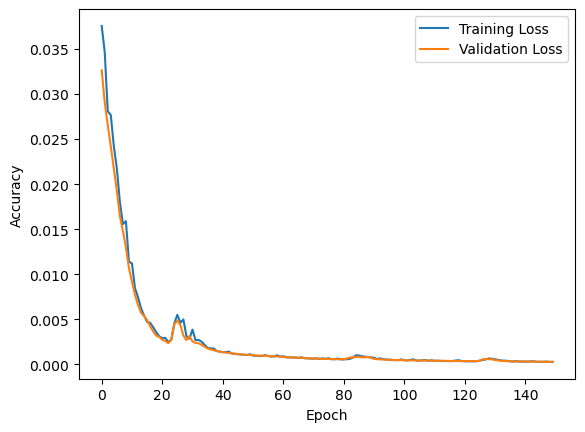

In [46]:
plt.plot(training_loss, label='Training Loss')
plt.plot(validation_loss, label='Validation Loss')
plt.xlabel('Epoch')
plt.ylabel('Accuracy')
plt.legend()

### make prediction

In [47]:
model.load_state_dict(torch.load(model_save))
validation_loss, hist_mix_with_phase, hist_spk1_label, hist_spk1_spec, hist_spk2_label, hist_spk2_spec, start_end = validate(model, 1)

    | end of validation epoch   1 | time:  4.12s | MSE 0.0003 |
-------------------------------------------------------------------------------


### example 1

In [48]:
sample_index = 2
mix = hist_mix_with_phase[sample_index]
phase = np.angle(mix)
spec1 = hist_spk1_spec[sample_index]
spec2 = hist_spk2_spec[sample_index]
spk1_label = hist_spk1_label[sample_index]
spk2_label = hist_spk2_label[sample_index]

In [49]:
signal = librosa.istft(np.asarray(mix), win_length=512, hop_length=128)
print('Mixed')
Audio(signal, rate=sr)

Mixed


In [50]:
speech1 = spec1 * np.exp(1j*phase)
signal1 = librosa.istft(np.asarray(speech1), win_length=512, hop_length=128)
print(spk1_label)
Audio(signal1, rate=sr)

Speaker 3


In [51]:
speech2 = spec2 * np.exp(1j*phase)
signal2 = librosa.istft(np.asarray(speech2), win_length=512, hop_length=128)
print(spk2_label)
Audio(signal2, rate=sr)

None


Text(0.5, 1.0, 'Mixed magnitude spectrogram')

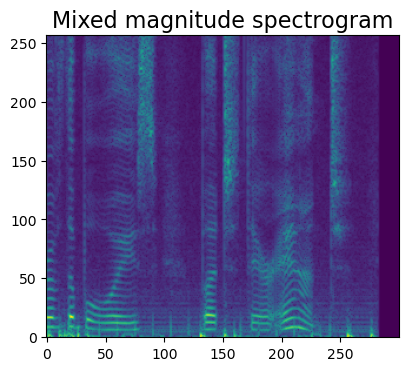

In [52]:
plt.figure(figsize=(10, 5))
plt.subplot(1,2,1)
plt.imshow(np.abs(mix[:,:300])**.33, origin='lower')
plt.title('Mixed magnitude spectrogram', fontsize=16)

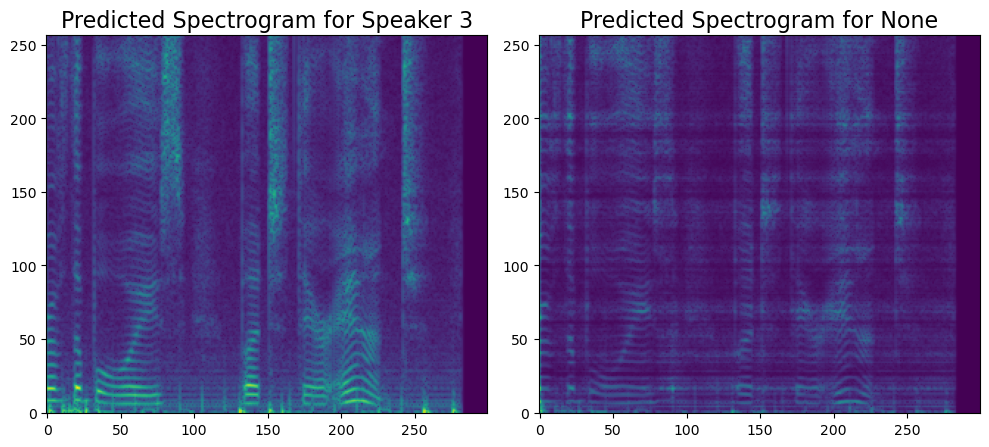

In [53]:
plt.figure(figsize=(10, 5))
plt.subplot(1,2,1)
plt.imshow(np.abs(spec1[:,:300])**.33, origin='lower')
plt.title(f'Predicted Spectrogram for {spk1_label}', fontsize=16)
plt.subplot(1,2,2)
plt.imshow(np.abs(spec2[:,:300])**.33, origin='lower')
plt.title(f'Predicted Spectrogram for {spk2_label}', fontsize=16)
plt.tight_layout()

### example 2

In [54]:
sample_index = 12
mix = hist_mix_with_phase[sample_index]
phase = np.angle(mix)
spec1 = hist_spk1_spec[sample_index]
spec2 = hist_spk2_spec[sample_index]
spk1_label = hist_spk1_label[sample_index]
spk2_label = hist_spk2_label[sample_index]

In [55]:
signal = librosa.istft(np.asarray(mix), win_length=512, hop_length=128)
print('Mixed')
Audio(signal, rate=sr)

Mixed


In [56]:
speech1 = spec1 * np.exp(1j*phase)
signal1 = librosa.istft(np.asarray(speech1), win_length=512, hop_length=128)
print(spk1_label)
Audio(signal1, rate=sr)

Speaker 3


In [57]:
speech2 = spec2 * np.exp(1j*phase)
signal2 = librosa.istft(np.asarray(speech2), win_length=512, hop_length=128)
print(spk2_label)
Audio(signal2, rate=sr)

Speaker 1


Text(0.5, 1.0, 'Mixed magnitude spectrogram')

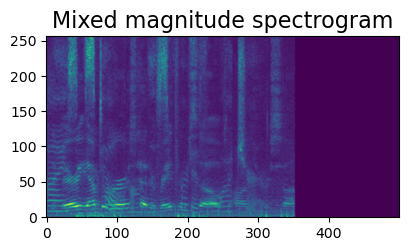

In [58]:
plt.figure(figsize=(10, 5))
plt.subplot(1,2,1)
plt.imshow(np.abs(mix[:,:500])**.33, origin='lower')
plt.title('Mixed magnitude spectrogram', fontsize=16)

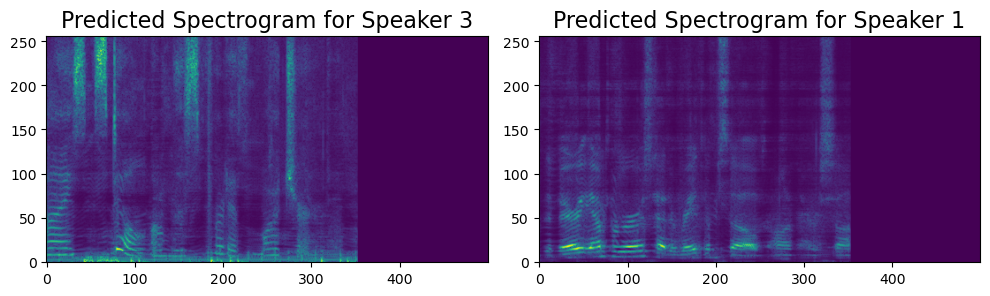

In [59]:
plt.figure(figsize=(10, 5))
plt.subplot(1,2,1)
plt.imshow(np.abs(spec1[:,:500])**.33, origin='lower')
plt.title(f'Predicted Spectrogram for {spk1_label}', fontsize=16)
plt.subplot(1,2,2)
plt.imshow(np.abs(spec2[:,:500])**.33, origin='lower')
plt.title(f'Predicted Spectrogram for {spk2_label}', fontsize=16)
plt.tight_layout()

# speaker identification module

In [60]:
# output from the previous model
# validation_loss, hist_mix_with_phase, 
# hist_spk1_label, hist_spk1_spec, 
# hist_spk2_label, hist_spk2_spec, start_end
output_prev = (validation_loss, hist_mix_with_phase,
              hist_spk1_label, hist_spk1_spec,
              hist_spk2_label, hist_spk2_spec, start_end)

#### reuse the pipeline from posted solution

In [61]:
class AlexNet(nn.Module):
    def __init__(self, num_classes=5):
        super(AlexNet, self).__init__()
        self.features = nn.Sequential(
            nn.Conv2d(1, 16, kernel_size=11, stride=4, padding=2),  # number of input channel is 1 (for image it is 3) 
            nn.ReLU(inplace=True),
            nn.MaxPool2d(kernel_size=3, stride=2),
            nn.Conv2d(16, 32, kernel_size=5, padding=2),  # we make the number of hidden channels smaller in these layers
            nn.ReLU(inplace=True),
            nn.MaxPool2d(kernel_size=3, stride=2),
            nn.Conv2d(32, 32, kernel_size=3, padding=1),
            nn.ReLU(inplace=True),
            nn.Conv2d(32, 64, kernel_size=3, padding=1),
            nn.ReLU(inplace=True),
            nn.Conv2d(64, 64, kernel_size=3, padding=1),
            nn.ReLU(inplace=True),
            nn.MaxPool2d(kernel_size=3, stride=2),
        )
        self.avgpool = nn.AdaptiveAvgPool2d((3, 3))  # perform adaptive mean pooling on any size of the input to match the provided size
        self.classifier = nn.Sequential(
            # nn.Dropout()  no Droupout layers here
            nn.Linear(64 * 3 * 3, 256),
            nn.ReLU(inplace=True),
            # nn.Dropout()  no Droupout layers here
            nn.Linear(256, 256),
            nn.Tanh() # use Tanh instead of ReLU since the output here will be used for the speaker embeddings
        )
        self.output = nn.Linear(256, num_classes)

    def forward(self, x):
        x = self.features(x)
        x = self.avgpool(x)  # the dimension after adaptive average pooling is (batch, 64, 3, 3)
        x = torch.flatten(x, 1)  # average
        x = self.classifier(x)  
        # normalize before the last layer
        embedding = x / (x.pow(2).sum(1) + 1e-6).sqrt().unsqueeze(1)
        # output layer
        x = self.output(embedding)
        return x, embedding
    
# test it with a sample input
model = AlexNet()
sample_input = torch.randn(2, 1, 257, 626)  # (batch_size, num_channel, width, height)
sample_output, sample_embedding = model(sample_input)
print(sample_output.shape, sample_embedding.shape)  # (batch_size, num_classes), (batch_size, embedding_dimension)

torch.Size([2, 5]) torch.Size([2, 256])


In [62]:
# CE loss
def CE(output, target):
    # output shape: (batch, num_classes)
    # target shape: (batch,)
    
    loss = nn.CrossEntropyLoss()
    
    return loss(output, target)

In [63]:
batch_size = 2
class dataset_pipeline(Dataset):
    def __init__(self, spec1, label1, spec2, label2, start_end):
        super(dataset_pipeline, self).__init__() 
        self.total_start_end = torch.cat([start_end, start_end])
        spk2index = {'None': 0,
                    'Speaker 1': 1,
                    'Speaker 2': 2,
                    'Speaker 3': 3,
                    'Speaker 4': 4}
        self.spec = torch.cat([spec1, spec2])
        label1_spk2index = torch.tensor([spk2index[spk] for spk in label1])
        label2_spk2index = torch.tensor([spk2index[spk] for spk in label2])
        self.label = torch.cat([label1_spk2index, label2_spk2index])
        
        self._len = len(self.label)  # number of utterances

    def __getitem__(self, index):
        spec = self.spec[index]
        label = self.label[index]
        start_end = self.total_start_end[index]
            
        return spec, label, start_end
    
    def __len__(self):
        return self._len
    
# define data loaders
train_loader = DataLoader(dataset_pipeline(hist_spk1_spec, hist_spk1_label, hist_spk2_spec, hist_spk2_label, start_end), 
                          batch_size=batch_size, 
                          shuffle=True,
                         )

validation_loader = DataLoader(dataset_pipeline(hist_spk1_spec, hist_spk1_label, hist_spk2_spec, hist_spk2_label, start_end), 
                               batch_size=batch_size, 
                               shuffle=False,
                              )

dataset_len = len(train_loader)
log_step = dataset_len // 4

In [64]:
def train(model, epoch, versatile=True):
    start_time = time.time()
    model = model.train()  # set the model to training mode. Always do this before you start training!
    train_loss = 0.
    
    # load batch data
    for batch_idx, data in enumerate(train_loader):
        spec, label, _ = data
        
        optimizer.zero_grad()
        
        output, output_embedding = model(spec.unsqueeze(1))
        
        # CE as objective
        loss = CE(output, label)
        
        # automatically calculate the backward pass
        loss.backward()
        # perform the actual backpropagation
        optimizer.step()
        
        train_loss += loss.data.item()
        
        # OPTIONAL: you can print the training progress 
        if versatile:
            if (batch_idx+1) % log_step == 0:
                elapsed = time.time() - start_time
                print('| epoch {:3d} | {:5d}/{:5d} batches | ms/batch {:5.2f} | CE {:5.4f} |'.format(
                    epoch, batch_idx+1, len(train_loader),
                    elapsed * 1000 / (batch_idx+1), 
                    train_loss / (batch_idx+1)
                    ))
    
    train_loss /= (batch_idx+1)
    print('-' * 99)
    print('    | end of training epoch {:3d} | time: {:5.2f}s | CE {:5.4f} |'.format(
            epoch, (time.time() - start_time), train_loss))
    
    return train_loss
        
def validate(model, epoch):
    start_time = time.time()
    model = model.eval()  # set the model to evaluation mode. Always do this during validation or test phase!
    correct = 0
    total = 0
    hist_pred = torch.zeros(0)
    hist_start_end = torch.zeros(0)
    # load batch data
    for batch_idx, data in enumerate(validation_loader):
        spec, label, start_end = data
        
        # you don't need to calculate the backward pass and the gradients during validation
        # so you can call torch.no_grad() to only calculate the forward pass to save time and memory
        
        with torch.no_grad():
        
            output, output_embedding = model(spec.unsqueeze(1))

            # calculate accuracy
            _, output_label = torch.max(output, 1)
            output_label = output_label.data.numpy()
            label = label.data.numpy()
            correct += np.sum(output_label == label)
            total += len(label)
            
            hist_pred = torch.cat([hist_pred, output])
            hist_start_end = torch.cat([hist_start_end, start_end])
    accuracy = correct / total
    print('    | end of validation epoch {:3d} | time: {:5.2f}s | Accuracy {:5.4f} |'.format(
            epoch, (time.time() - start_time), accuracy))
    print('-' * 99)
    
    return accuracy, hist_pred, hist_start_end

In [65]:
total_epoch = 300  # train the model for 150 epochs
model_save = 'best_AlexNet_SV.pt'  # path to save the best validation model
optimizer = optim.Adam(model.parameters(), lr=1e-3)

# main function

training_loss = []
validation_acc = []

for epoch in range(1, total_epoch + 1):
    training_loss.append(train(model, epoch))
    validation_acc.append(validate(model, epoch)[0])
    
    if training_loss[-1] == np.min(training_loss):
        print('      Best training model found.')
    if validation_acc[-1] == np.max(validation_acc):
        # save current best model on validation set
        with open(model_save, 'wb') as f:
            torch.save(model.state_dict(), f)
            print('      Best validation model found and saved.')
    
    print('-' * 77)

| epoch   1 |    10/   42 batches | ms/batch 23.66 | CE 1.5904 |
| epoch   1 |    20/   42 batches | ms/batch 22.49 | CE 1.5771 |
| epoch   1 |    30/   42 batches | ms/batch 22.77 | CE 1.5295 |
| epoch   1 |    40/   42 batches | ms/batch 22.49 | CE 1.5203 |
---------------------------------------------------------------------------------------------------
    | end of training epoch   1 | time:  0.95s | CE 1.5092 |
    | end of validation epoch   1 | time:  0.29s | Accuracy 0.6071 |
---------------------------------------------------------------------------------------------------
      Best training model found.
      Best validation model found and saved.
-----------------------------------------------------------------------------
| epoch   2 |    10/   42 batches | ms/batch 21.13 | CE 1.3686 |
| epoch   2 |    20/   42 batches | ms/batch 21.60 | CE 1.3631 |
| epoch   2 |    30/   42 batches | ms/batch 21.54 | CE 1.3175 |
| epoch   2 |    40/   42 batches | ms/batch 21.49 | CE 1.2

    | end of validation epoch  12 | time:  0.31s | Accuracy 0.7738 |
---------------------------------------------------------------------------------------------------
      Best training model found.
-----------------------------------------------------------------------------
| epoch  13 |    10/   42 batches | ms/batch 23.26 | CE 0.4226 |
| epoch  13 |    20/   42 batches | ms/batch 23.63 | CE 0.4808 |
| epoch  13 |    30/   42 batches | ms/batch 23.87 | CE 0.4961 |
| epoch  13 |    40/   42 batches | ms/batch 24.12 | CE 0.5152 |
---------------------------------------------------------------------------------------------------
    | end of training epoch  13 | time:  1.01s | CE 0.5074 |
    | end of validation epoch  13 | time:  0.31s | Accuracy 0.7857 |
---------------------------------------------------------------------------------------------------
      Best training model found.
-----------------------------------------------------------------------------
| epoch  14 |    10

| epoch  24 |    10/   42 batches | ms/batch 23.76 | CE 0.4869 |
| epoch  24 |    20/   42 batches | ms/batch 23.93 | CE 0.3537 |
| epoch  24 |    30/   42 batches | ms/batch 23.92 | CE 0.3059 |
| epoch  24 |    40/   42 batches | ms/batch 23.86 | CE 0.3951 |
---------------------------------------------------------------------------------------------------
    | end of training epoch  24 | time:  1.00s | CE 0.3959 |
    | end of validation epoch  24 | time:  0.29s | Accuracy 0.8452 |
---------------------------------------------------------------------------------------------------
      Best training model found.
-----------------------------------------------------------------------------
| epoch  25 |    10/   42 batches | ms/batch 23.21 | CE 0.4319 |
| epoch  25 |    20/   42 batches | ms/batch 23.31 | CE 0.3894 |
| epoch  25 |    30/   42 batches | ms/batch 23.76 | CE 0.2974 |
| epoch  25 |    40/   42 batches | ms/batch 23.98 | CE 0.3686 |
---------------------------------------

| epoch  36 |    10/   42 batches | ms/batch 23.56 | CE 0.3150 |
| epoch  36 |    20/   42 batches | ms/batch 23.93 | CE 0.2593 |
| epoch  36 |    30/   42 batches | ms/batch 23.71 | CE 0.2324 |
| epoch  36 |    40/   42 batches | ms/batch 23.49 | CE 0.2687 |
---------------------------------------------------------------------------------------------------
    | end of training epoch  36 | time:  0.99s | CE 0.2614 |
    | end of validation epoch  36 | time:  0.29s | Accuracy 0.9643 |
---------------------------------------------------------------------------------------------------
      Best training model found.
      Best validation model found and saved.
-----------------------------------------------------------------------------
| epoch  37 |    10/   42 batches | ms/batch 23.86 | CE 0.1952 |
| epoch  37 |    20/   42 batches | ms/batch 24.23 | CE 0.2136 |
| epoch  37 |    30/   42 batches | ms/batch 23.58 | CE 0.2228 |
| epoch  37 |    40/   42 batches | ms/batch 23.54 | CE 0.2

| epoch  48 |    10/   42 batches | ms/batch 23.46 | CE 0.1515 |
| epoch  48 |    20/   42 batches | ms/batch 22.94 | CE 0.1077 |
| epoch  48 |    30/   42 batches | ms/batch 23.46 | CE 0.2658 |
| epoch  48 |    40/   42 batches | ms/batch 23.30 | CE 0.2431 |
---------------------------------------------------------------------------------------------------
    | end of training epoch  48 | time:  0.98s | CE 0.2341 |
    | end of validation epoch  48 | time:  0.29s | Accuracy 0.9167 |
---------------------------------------------------------------------------------------------------
      Best training model found.
-----------------------------------------------------------------------------
| epoch  49 |    10/   42 batches | ms/batch 23.51 | CE 0.2874 |
| epoch  49 |    20/   42 batches | ms/batch 23.76 | CE 0.2357 |
| epoch  49 |    30/   42 batches | ms/batch 23.58 | CE 0.2151 |
| epoch  49 |    40/   42 batches | ms/batch 23.91 | CE 0.2242 |
---------------------------------------

    | end of validation epoch  59 | time:  0.28s | Accuracy 0.9762 |
---------------------------------------------------------------------------------------------------
      Best training model found.
      Best validation model found and saved.
-----------------------------------------------------------------------------
| epoch  60 |    10/   42 batches | ms/batch 23.96 | CE 0.0672 |
| epoch  60 |    20/   42 batches | ms/batch 23.29 | CE 0.2087 |
| epoch  60 |    30/   42 batches | ms/batch 23.38 | CE 0.1741 |
| epoch  60 |    40/   42 batches | ms/batch 23.51 | CE 0.1553 |
---------------------------------------------------------------------------------------------------
    | end of training epoch  60 | time:  0.99s | CE 0.1580 |
    | end of validation epoch  60 | time:  0.29s | Accuracy 0.9762 |
---------------------------------------------------------------------------------------------------
      Best training model found.
      Best validation model found and saved.
-------

| epoch  71 |    10/   42 batches | ms/batch 24.21 | CE 0.0315 |
| epoch  71 |    20/   42 batches | ms/batch 23.78 | CE 0.1281 |
| epoch  71 |    30/   42 batches | ms/batch 23.51 | CE 0.0994 |
| epoch  71 |    40/   42 batches | ms/batch 23.44 | CE 0.0869 |
---------------------------------------------------------------------------------------------------
    | end of training epoch  71 | time:  0.99s | CE 0.0868 |
    | end of validation epoch  71 | time:  0.30s | Accuracy 0.9881 |
---------------------------------------------------------------------------------------------------
      Best training model found.
      Best validation model found and saved.
-----------------------------------------------------------------------------
| epoch  72 |    10/   42 batches | ms/batch 23.61 | CE 0.0429 |
| epoch  72 |    20/   42 batches | ms/batch 23.46 | CE 0.0404 |
| epoch  72 |    30/   42 batches | ms/batch 23.44 | CE 0.0419 |
| epoch  72 |    40/   42 batches | ms/batch 23.56 | CE 0.0

| epoch  82 |    40/   42 batches | ms/batch 23.57 | CE 0.3202 |
---------------------------------------------------------------------------------------------------
    | end of training epoch  82 | time:  0.99s | CE 0.3242 |
    | end of validation epoch  82 | time:  0.29s | Accuracy 0.9643 |
---------------------------------------------------------------------------------------------------
-----------------------------------------------------------------------------
| epoch  83 |    10/   42 batches | ms/batch 24.70 | CE 0.3960 |
| epoch  83 |    20/   42 batches | ms/batch 23.44 | CE 0.3015 |
| epoch  83 |    30/   42 batches | ms/batch 23.43 | CE 0.2856 |
| epoch  83 |    40/   42 batches | ms/batch 23.54 | CE 0.2529 |
---------------------------------------------------------------------------------------------------
    | end of training epoch  83 | time:  0.98s | CE 0.2419 |
    | end of validation epoch  83 | time:  0.28s | Accuracy 0.9286 |
-------------------------------------

| epoch  94 |    20/   42 batches | ms/batch 24.48 | CE 0.0219 |
| epoch  94 |    30/   42 batches | ms/batch 24.35 | CE 0.0242 |
| epoch  94 |    40/   42 batches | ms/batch 24.14 | CE 0.0247 |
---------------------------------------------------------------------------------------------------
    | end of training epoch  94 | time:  1.01s | CE 0.0247 |
    | end of validation epoch  94 | time:  0.30s | Accuracy 1.0000 |
---------------------------------------------------------------------------------------------------
      Best training model found.
      Best validation model found and saved.
-----------------------------------------------------------------------------
| epoch  95 |    10/   42 batches | ms/batch 23.36 | CE 0.0204 |
| epoch  95 |    20/   42 batches | ms/batch 23.46 | CE 0.0219 |
| epoch  95 |    30/   42 batches | ms/batch 23.51 | CE 0.0242 |
| epoch  95 |    40/   42 batches | ms/batch 23.63 | CE 0.0233 |
-----------------------------------------------------------

    | end of validation epoch 105 | time:  0.29s | Accuracy 1.0000 |
---------------------------------------------------------------------------------------------------
      Best training model found.
      Best validation model found and saved.
-----------------------------------------------------------------------------
| epoch 106 |    10/   42 batches | ms/batch 24.41 | CE 0.0137 |
| epoch 106 |    20/   42 batches | ms/batch 24.55 | CE 0.0141 |
| epoch 106 |    30/   42 batches | ms/batch 24.29 | CE 0.0144 |
| epoch 106 |    40/   42 batches | ms/batch 24.47 | CE 0.0143 |
---------------------------------------------------------------------------------------------------
    | end of training epoch 106 | time:  1.03s | CE 0.0140 |
    | end of validation epoch 106 | time:  0.29s | Accuracy 1.0000 |
---------------------------------------------------------------------------------------------------
      Best training model found.
      Best validation model found and saved.
-------

    | end of validation epoch 116 | time:  0.30s | Accuracy 1.0000 |
---------------------------------------------------------------------------------------------------
      Best training model found.
      Best validation model found and saved.
-----------------------------------------------------------------------------
| epoch 117 |    10/   42 batches | ms/batch 24.55 | CE 0.0064 |
| epoch 117 |    20/   42 batches | ms/batch 23.61 | CE 0.0072 |
| epoch 117 |    30/   42 batches | ms/batch 23.74 | CE 0.0078 |
| epoch 117 |    40/   42 batches | ms/batch 23.88 | CE 0.0086 |
---------------------------------------------------------------------------------------------------
    | end of training epoch 117 | time:  1.00s | CE 0.0090 |
    | end of validation epoch 117 | time:  0.29s | Accuracy 1.0000 |
---------------------------------------------------------------------------------------------------
      Best training model found.
      Best validation model found and saved.
-------

    | end of validation epoch 127 | time:  0.29s | Accuracy 1.0000 |
---------------------------------------------------------------------------------------------------
      Best training model found.
      Best validation model found and saved.
-----------------------------------------------------------------------------
| epoch 128 |    10/   42 batches | ms/batch 24.06 | CE 0.0074 |
| epoch 128 |    20/   42 batches | ms/batch 23.93 | CE 0.0060 |
| epoch 128 |    30/   42 batches | ms/batch 23.94 | CE 0.0064 |
| epoch 128 |    40/   42 batches | ms/batch 23.51 | CE 0.0065 |
---------------------------------------------------------------------------------------------------
    | end of training epoch 128 | time:  0.99s | CE 0.0065 |
    | end of validation epoch 128 | time:  0.29s | Accuracy 1.0000 |
---------------------------------------------------------------------------------------------------
      Best training model found.
      Best validation model found and saved.
-------

    | end of validation epoch 138 | time:  0.29s | Accuracy 1.0000 |
---------------------------------------------------------------------------------------------------
      Best training model found.
      Best validation model found and saved.
-----------------------------------------------------------------------------
| epoch 139 |    10/   42 batches | ms/batch 24.80 | CE 0.0052 |
| epoch 139 |    20/   42 batches | ms/batch 24.18 | CE 0.0050 |
| epoch 139 |    30/   42 batches | ms/batch 24.44 | CE 0.0050 |
| epoch 139 |    40/   42 batches | ms/batch 24.54 | CE 0.0049 |
---------------------------------------------------------------------------------------------------
    | end of training epoch 139 | time:  1.03s | CE 0.0048 |
    | end of validation epoch 139 | time:  0.30s | Accuracy 1.0000 |
---------------------------------------------------------------------------------------------------
      Best training model found.
      Best validation model found and saved.
-------

    | end of validation epoch 149 | time:  0.29s | Accuracy 1.0000 |
---------------------------------------------------------------------------------------------------
      Best training model found.
      Best validation model found and saved.
-----------------------------------------------------------------------------
| epoch 150 |    10/   42 batches | ms/batch 24.75 | CE 0.0036 |
| epoch 150 |    20/   42 batches | ms/batch 24.43 | CE 0.0039 |
| epoch 150 |    30/   42 batches | ms/batch 24.77 | CE 0.0039 |
| epoch 150 |    40/   42 batches | ms/batch 24.69 | CE 0.0038 |
---------------------------------------------------------------------------------------------------
    | end of training epoch 150 | time:  1.04s | CE 0.0037 |
    | end of validation epoch 150 | time:  0.29s | Accuracy 1.0000 |
---------------------------------------------------------------------------------------------------
      Best training model found.
      Best validation model found and saved.
-------

    | end of validation epoch 160 | time:  0.33s | Accuracy 1.0000 |
---------------------------------------------------------------------------------------------------
      Best training model found.
      Best validation model found and saved.
-----------------------------------------------------------------------------
| epoch 161 |    10/   42 batches | ms/batch 24.11 | CE 0.0026 |
| epoch 161 |    20/   42 batches | ms/batch 23.98 | CE 0.0028 |
| epoch 161 |    30/   42 batches | ms/batch 24.29 | CE 0.0028 |
| epoch 161 |    40/   42 batches | ms/batch 24.18 | CE 0.0027 |
---------------------------------------------------------------------------------------------------
    | end of training epoch 161 | time:  1.02s | CE 0.0028 |
    | end of validation epoch 161 | time:  0.28s | Accuracy 1.0000 |
---------------------------------------------------------------------------------------------------
      Best training model found.
      Best validation model found and saved.
-------

    | end of validation epoch 171 | time:  0.30s | Accuracy 1.0000 |
---------------------------------------------------------------------------------------------------
      Best training model found.
      Best validation model found and saved.
-----------------------------------------------------------------------------
| epoch 172 |    10/   42 batches | ms/batch 25.64 | CE 0.0026 |
| epoch 172 |    20/   42 batches | ms/batch 25.84 | CE 0.0021 |
| epoch 172 |    30/   42 batches | ms/batch 26.06 | CE 0.0023 |
| epoch 172 |    40/   42 batches | ms/batch 26.36 | CE 0.0022 |
---------------------------------------------------------------------------------------------------
    | end of training epoch 172 | time:  1.11s | CE 0.0022 |
    | end of validation epoch 172 | time:  0.32s | Accuracy 1.0000 |
---------------------------------------------------------------------------------------------------
      Best training model found.
      Best validation model found and saved.
-------

    | end of validation epoch 182 | time:  0.29s | Accuracy 1.0000 |
---------------------------------------------------------------------------------------------------
      Best training model found.
      Best validation model found and saved.
-----------------------------------------------------------------------------
| epoch 183 |    10/   42 batches | ms/batch 24.11 | CE 0.0018 |
| epoch 183 |    20/   42 batches | ms/batch 24.58 | CE 0.0016 |
| epoch 183 |    30/   42 batches | ms/batch 24.82 | CE 0.0016 |
| epoch 183 |    40/   42 batches | ms/batch 24.79 | CE 0.0016 |
---------------------------------------------------------------------------------------------------
    | end of training epoch 183 | time:  1.04s | CE 0.0017 |
    | end of validation epoch 183 | time:  0.29s | Accuracy 1.0000 |
---------------------------------------------------------------------------------------------------
      Best training model found.
      Best validation model found and saved.
-------

    | end of validation epoch 193 | time:  0.30s | Accuracy 1.0000 |
---------------------------------------------------------------------------------------------------
      Best training model found.
      Best validation model found and saved.
-----------------------------------------------------------------------------
| epoch 194 |    10/   42 batches | ms/batch 23.95 | CE 0.0013 |
| epoch 194 |    20/   42 batches | ms/batch 23.91 | CE 0.0013 |
| epoch 194 |    30/   42 batches | ms/batch 24.47 | CE 0.0013 |
| epoch 194 |    40/   42 batches | ms/batch 24.19 | CE 0.0013 |
---------------------------------------------------------------------------------------------------
    | end of training epoch 194 | time:  1.02s | CE 0.0013 |
    | end of validation epoch 194 | time:  0.29s | Accuracy 1.0000 |
---------------------------------------------------------------------------------------------------
      Best training model found.
      Best validation model found and saved.
-------

    | end of validation epoch 204 | time:  0.28s | Accuracy 1.0000 |
---------------------------------------------------------------------------------------------------
      Best training model found.
      Best validation model found and saved.
-----------------------------------------------------------------------------
| epoch 205 |    10/   42 batches | ms/batch 23.76 | CE 0.0008 |
| epoch 205 |    20/   42 batches | ms/batch 24.11 | CE 0.0010 |
| epoch 205 |    30/   42 batches | ms/batch 24.47 | CE 0.0011 |
| epoch 205 |    40/   42 batches | ms/batch 24.24 | CE 0.0010 |
---------------------------------------------------------------------------------------------------
    | end of training epoch 205 | time:  1.02s | CE 0.0010 |
    | end of validation epoch 205 | time:  0.29s | Accuracy 1.0000 |
---------------------------------------------------------------------------------------------------
      Best training model found.
      Best validation model found and saved.
-------

    | end of validation epoch 215 | time:  0.30s | Accuracy 1.0000 |
---------------------------------------------------------------------------------------------------
      Best training model found.
      Best validation model found and saved.
-----------------------------------------------------------------------------
| epoch 216 |    10/   42 batches | ms/batch 24.30 | CE 0.0010 |
| epoch 216 |    20/   42 batches | ms/batch 23.71 | CE 0.0008 |
| epoch 216 |    30/   42 batches | ms/batch 24.12 | CE 0.0008 |
| epoch 216 |    40/   42 batches | ms/batch 24.30 | CE 0.0008 |
---------------------------------------------------------------------------------------------------
    | end of training epoch 216 | time:  1.02s | CE 0.0008 |
    | end of validation epoch 216 | time:  0.29s | Accuracy 1.0000 |
---------------------------------------------------------------------------------------------------
      Best training model found.
      Best validation model found and saved.
-------

    | end of validation epoch 226 | time:  0.28s | Accuracy 1.0000 |
---------------------------------------------------------------------------------------------------
      Best training model found.
      Best validation model found and saved.
-----------------------------------------------------------------------------
| epoch 227 |    10/   42 batches | ms/batch 22.57 | CE 0.0006 |
| epoch 227 |    20/   42 batches | ms/batch 23.59 | CE 0.0006 |
| epoch 227 |    30/   42 batches | ms/batch 23.91 | CE 0.0006 |
| epoch 227 |    40/   42 batches | ms/batch 23.92 | CE 0.0006 |
---------------------------------------------------------------------------------------------------
    | end of training epoch 227 | time:  1.00s | CE 0.0006 |
    | end of validation epoch 227 | time:  0.29s | Accuracy 1.0000 |
---------------------------------------------------------------------------------------------------
      Best training model found.
      Best validation model found and saved.
-------

    | end of validation epoch 237 | time:  0.28s | Accuracy 1.0000 |
---------------------------------------------------------------------------------------------------
      Best training model found.
      Best validation model found and saved.
-----------------------------------------------------------------------------
| epoch 238 |    10/   42 batches | ms/batch 25.35 | CE 0.0005 |
| epoch 238 |    20/   42 batches | ms/batch 24.60 | CE 0.0005 |
| epoch 238 |    30/   42 batches | ms/batch 24.93 | CE 0.0005 |
| epoch 238 |    40/   42 batches | ms/batch 24.74 | CE 0.0005 |
---------------------------------------------------------------------------------------------------
    | end of training epoch 238 | time:  1.04s | CE 0.0005 |
    | end of validation epoch 238 | time:  0.29s | Accuracy 1.0000 |
---------------------------------------------------------------------------------------------------
      Best training model found.
      Best validation model found and saved.
-------

    | end of validation epoch 248 | time:  0.28s | Accuracy 1.0000 |
---------------------------------------------------------------------------------------------------
      Best training model found.
      Best validation model found and saved.
-----------------------------------------------------------------------------
| epoch 249 |    10/   42 batches | ms/batch 23.96 | CE 0.0004 |
| epoch 249 |    20/   42 batches | ms/batch 23.78 | CE 0.0004 |
| epoch 249 |    30/   42 batches | ms/batch 23.97 | CE 0.0004 |
| epoch 249 |    40/   42 batches | ms/batch 24.16 | CE 0.0004 |
---------------------------------------------------------------------------------------------------
    | end of training epoch 249 | time:  1.01s | CE 0.0004 |
    | end of validation epoch 249 | time:  0.27s | Accuracy 1.0000 |
---------------------------------------------------------------------------------------------------
      Best training model found.
      Best validation model found and saved.
-------

    | end of validation epoch 259 | time:  0.30s | Accuracy 1.0000 |
---------------------------------------------------------------------------------------------------
      Best training model found.
      Best validation model found and saved.
-----------------------------------------------------------------------------
| epoch 260 |    10/   42 batches | ms/batch 24.95 | CE 0.0004 |
| epoch 260 |    20/   42 batches | ms/batch 24.25 | CE 0.0003 |
| epoch 260 |    30/   42 batches | ms/batch 24.25 | CE 0.0003 |
| epoch 260 |    40/   42 batches | ms/batch 24.30 | CE 0.0003 |
---------------------------------------------------------------------------------------------------
    | end of training epoch 260 | time:  1.02s | CE 0.0003 |
    | end of validation epoch 260 | time:  0.29s | Accuracy 1.0000 |
---------------------------------------------------------------------------------------------------
      Best training model found.
      Best validation model found and saved.
-------

    | end of validation epoch 270 | time:  0.29s | Accuracy 1.0000 |
---------------------------------------------------------------------------------------------------
      Best training model found.
      Best validation model found and saved.
-----------------------------------------------------------------------------
| epoch 271 |    10/   42 batches | ms/batch 24.75 | CE 0.0003 |
| epoch 271 |    20/   42 batches | ms/batch 24.40 | CE 0.0003 |
| epoch 271 |    30/   42 batches | ms/batch 24.06 | CE 0.0002 |
| epoch 271 |    40/   42 batches | ms/batch 23.93 | CE 0.0002 |
---------------------------------------------------------------------------------------------------
    | end of training epoch 271 | time:  1.00s | CE 0.0003 |
    | end of validation epoch 271 | time:  0.31s | Accuracy 1.0000 |
---------------------------------------------------------------------------------------------------
      Best training model found.
      Best validation model found and saved.
-------

    | end of validation epoch 281 | time:  0.30s | Accuracy 1.0000 |
---------------------------------------------------------------------------------------------------
      Best training model found.
      Best validation model found and saved.
-----------------------------------------------------------------------------
| epoch 282 |    10/   42 batches | ms/batch 23.96 | CE 0.0002 |
| epoch 282 |    20/   42 batches | ms/batch 24.58 | CE 0.0002 |
| epoch 282 |    30/   42 batches | ms/batch 23.84 | CE 0.0002 |
| epoch 282 |    40/   42 batches | ms/batch 23.94 | CE 0.0002 |
---------------------------------------------------------------------------------------------------
    | end of training epoch 282 | time:  1.00s | CE 0.0002 |
    | end of validation epoch 282 | time:  0.29s | Accuracy 1.0000 |
---------------------------------------------------------------------------------------------------
      Best training model found.
      Best validation model found and saved.
-------

    | end of validation epoch 292 | time:  0.32s | Accuracy 1.0000 |
---------------------------------------------------------------------------------------------------
      Best training model found.
      Best validation model found and saved.
-----------------------------------------------------------------------------
| epoch 293 |    10/   42 batches | ms/batch 26.34 | CE 0.0002 |
| epoch 293 |    20/   42 batches | ms/batch 26.29 | CE 0.0002 |
| epoch 293 |    30/   42 batches | ms/batch 26.27 | CE 0.0002 |
| epoch 293 |    40/   42 batches | ms/batch 26.11 | CE 0.0002 |
---------------------------------------------------------------------------------------------------
    | end of training epoch 293 | time:  1.10s | CE 0.0002 |
    | end of validation epoch 293 | time:  0.30s | Accuracy 1.0000 |
---------------------------------------------------------------------------------------------------
      Best training model found.
      Best validation model found and saved.
-------

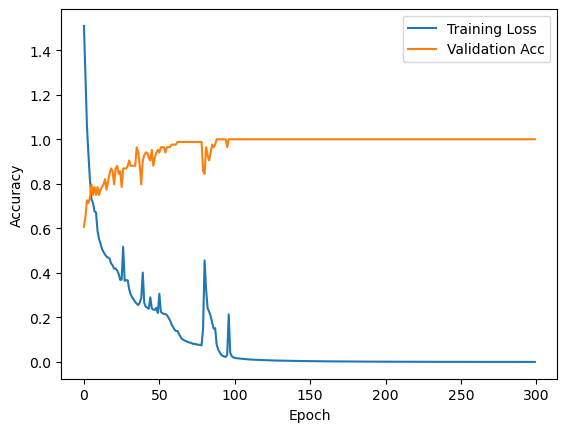

In [66]:
plt.plot(training_loss, label='Training Loss')
plt.plot(validation_acc, label='Validation Acc')
plt.xlabel('Epoch')
plt.ylabel('Accuracy')
plt.legend()

In [67]:
# output from the previous model
# validation_loss, hist_mix_with_phase, 
# hist_spk1_label, hist_spk1_spec, 
# hist_spk2_label, hist_spk2_spec, start_end
index2spk = {0: 'None',
            1: 'Speaker 1',
            2: 'Speaker 2',
            3: 'Speaker 3',
            4: 'Speaker 4'}
# make prediction
model.load_state_dict(torch.load(model_save))
pred_labels = torch.argmax(validate(model, 1)[1], 1)
label_spk1, label_spk2 = torch.split(pred_labels, split_size_or_sections=pred_labels.shape[0] // 2, dim=0)
label_spk1 = np.array([index2spk[index.item()] for index in label_spk1])
label_spk2 = np.array([index2spk[index.item()] for index in label_spk2])

    | end of validation epoch   1 | time:  0.30s | Accuracy 1.0000 |
---------------------------------------------------------------------------------------------------


In [68]:
# for first speaker
print(f'True Label:\n {hist_spk1_label}')
print(f'\nPredicted Label:\n {label_spk1}')

True Label:
 ['Speaker 2' 'Speaker 2' 'Speaker 3' 'Speaker 4' 'Speaker 4' 'Speaker 1'
 'Speaker 2' 'Speaker 3' 'Speaker 2' 'Speaker 2' 'Speaker 2' 'Speaker 3'
 'Speaker 3' 'Speaker 3' 'Speaker 1' 'Speaker 3' 'Speaker 2' 'Speaker 3'
 'Speaker 3' 'Speaker 3' 'Speaker 1' 'Speaker 4' 'None' 'Speaker 4'
 'Speaker 4' 'Speaker 3' 'Speaker 4' 'Speaker 1' 'Speaker 2' 'Speaker 2'
 'Speaker 3' 'Speaker 3' 'Speaker 3' 'Speaker 3' 'Speaker 3' 'Speaker 3'
 'Speaker 3' 'Speaker 3' 'Speaker 3' 'Speaker 4' 'Speaker 4' 'Speaker 4']

Predicted Label:
 ['Speaker 2' 'Speaker 2' 'Speaker 3' 'Speaker 4' 'Speaker 4' 'Speaker 1'
 'Speaker 2' 'Speaker 3' 'Speaker 2' 'Speaker 2' 'Speaker 2' 'Speaker 3'
 'Speaker 3' 'Speaker 3' 'Speaker 1' 'Speaker 3' 'Speaker 2' 'Speaker 3'
 'Speaker 3' 'Speaker 3' 'Speaker 1' 'Speaker 4' 'None' 'Speaker 4'
 'Speaker 4' 'Speaker 3' 'Speaker 4' 'Speaker 1' 'Speaker 2' 'Speaker 2'
 'Speaker 3' 'Speaker 3' 'Speaker 3' 'Speaker 3' 'Speaker 3' 'Speaker 3'
 'Speaker 3' 'Speaker 3' 'Sp

In [69]:
# for second speaker
print(f'True Label:\n {hist_spk2_label}')
print(f'\nPredicted Label:\n {label_spk2}')

True Label:
 ['Speaker 3' 'None' 'None' 'Speaker 1' 'None' 'None' 'Speaker 3' 'None'
 'None' 'Speaker 3' 'Speaker 3' 'None' 'Speaker 1' 'None' 'None'
 'Speaker 2' 'None' 'None' 'Speaker 1' 'None' 'None' 'Speaker 1'
 'Speaker 1' 'None' 'Speaker 3' 'None' 'None' 'None' 'None' 'None' 'None'
 'None' 'None' 'None' 'None' 'None' 'None' 'None' 'None' 'None' 'None'
 'None']

Predicted Label:
 ['Speaker 3' 'None' 'None' 'Speaker 1' 'None' 'None' 'Speaker 3' 'None'
 'None' 'Speaker 3' 'Speaker 3' 'None' 'Speaker 1' 'None' 'None'
 'Speaker 2' 'None' 'None' 'Speaker 1' 'None' 'None' 'Speaker 1'
 'Speaker 1' 'None' 'Speaker 3' 'None' 'None' 'None' 'None' 'None' 'None'
 'None' 'None' 'None' 'None' 'None' 'None' 'None' 'None' 'None' 'None'
 'None']


In [70]:
# replace the true label with the predicted label from sim(speaker identification module)
output_prev_sim = (validation_loss, hist_mix_with_phase,
              label_spk1, hist_spk1_spec,
              label_spk2, hist_spk2_spec, start_end)

In [71]:
# sample:   spk1, spk2, [start_frame, end_frame], spk1_spec, spk2_spec
label_spk1[1], label_spk2[1], start_end[1], hist_spk1_spec[1], hist_spk2_spec[1]

('Speaker 2',
 'None',
 tensor([137728., 156259.], dtype=torch.float64),
 tensor([[6.9517e-04, 2.1074e-03, 3.3641e-03,  ..., 0.0000e+00, 0.0000e+00,
          0.0000e+00],
         [1.8218e-03, 3.9735e-03, 3.1484e-03,  ..., 0.0000e+00, 0.0000e+00,
          0.0000e+00],
         [2.2043e-03, 6.7411e-03, 4.8075e-03,  ..., 0.0000e+00, 0.0000e+00,
          0.0000e+00],
         ...,
         [2.5491e-04, 2.5730e-04, 2.7331e-04,  ..., 0.0000e+00, 0.0000e+00,
          0.0000e+00],
         [1.2494e-04, 9.0006e-05, 1.8555e-04,  ..., 0.0000e+00, 0.0000e+00,
          0.0000e+00],
         [1.4858e-04, 2.4267e-05, 1.5227e-04,  ..., 0.0000e+00, 0.0000e+00,
          0.0000e+00]]),
 tensor([[6.6877e-04, 1.8476e-03, 2.6465e-03,  ..., 0.0000e+00, 0.0000e+00,
          0.0000e+00],
         [1.5049e-03, 2.9211e-03, 2.0161e-03,  ..., 0.0000e+00, 0.0000e+00,
          0.0000e+00],
         [1.7152e-03, 4.3818e-03, 2.4807e-03,  ..., 0.0000e+00, 0.0000e+00,
          0.0000e+00],
         ...,
      

### Visualization

### collect the segments from the previous output

In [72]:
# collect the predicted output from the previous model into the dictionary
# return [[start_frame, end_frame], spec]
def collect_time_stamp(collect_label1, collect_label2, collect_spec1, collect_spec2, start_end):
    spk_time_dic = {'Speaker 1':[], 'Speaker 2':[], 'Speaker 3':[], 'Speaker 4':[]}
    for i in range(len(collect_label1)):
        spk1 = collect_label1[i]
        spk2 = collect_label2[i]
        spec1 = collect_spec1[i]
        spec2 = collect_spec2[i]
        
        if spk1 != 'None':
            spk_time_dic[spk1].append([start_end[i].tolist(), spec1])
        if spk2 != 'None':
            spk_time_dic[spk2].append([start_end[i].tolist(), spec2])
                
    return spk_time_dic

time_stamp = collect_time_stamp(label_spk1, label_spk2, hist_spk1_spec, hist_spk2_spec, start_end)
for spk in time_stamp:
    print(spk)
    for start_end, spec in time_stamp[spk]:
        print(start_end)

Speaker 1
[363583.0, 392453.0]
[392453.0, 429312.0]
[967020.0, 1011948.0]
[1011948.0, 1020416.0]
[1305061.0, 1327240.0]
[1327240.0, 1367296.0]
[1502359.0, 1546292.0]
[1483776.0, 1502359.0]
[1377024.0, 1436160.0]
Speaker 2
[156259.0, 185797.0]
[137728.0, 156259.0]
[472675.0, 500494.0]
[500494.0, 510720.0]
[770127.0, 781227.0]
[743936.0, 770127.0]
[1159393.0, 1180170.0]
[1146624.0, 1159393.0]
[669184.0, 702976.0]
[1738496.0, 1808384.0]
Speaker 3
[156259.0, 185797.0]
[185797.0, 222208.0]
[472675.0, 500494.0]
[442112.0, 472675.0]
[770127.0, 781227.0]
[743936.0, 770127.0]
[781227.0, 825856.0]
[967020.0, 1011948.0]
[931072.0, 967020.0]
[1159393.0, 1180170.0]
[1180170.0, 1202176.0]
[1305061.0, 1327240.0]
[1265664.0, 1305061.0]
[1587592.0, 1598276.0]
[1574656.0, 1587592.0]
[0.0, 43264.0]
[239360.0, 296704.0]
[303360.0, 334336.0]
[563200.0, 646912.0]
[711680.0, 739328.0]
[832512.0, 911360.0]
[1032192.0, 1087744.0]
[1662976.0, 1722880.0]
[1820928.0, 1901568.0]
Speaker 4
[363583.0, 392453.0]
[338

In [73]:
# since predicted spec from the previous model is zero-padded, we need to delete the zero-pad for ASR
def delete_zero(x):
    res = None
    num_col = x.shape[1]
    for i in range(-1, -num_col-1, -1):
        if sum(x[:,i]) > 0.0001:
            res = x[:,:i+1]
            break
    return res

# example
x = torch.tensor([[0.0800, 0.0181, 0.0047, 0.0000, 0.0000, 0.0000],
                  [0.0879, 0.0295, 0.0094, 0.0000, 0.0000, 0.0000],
                  [0.0023, 0.0022, 0.0010, 0.0000, 0.0000, 0.0000],
                  [0.0021, 0.0014, 0.0010, 0.0000, 0.0000, 0.0000],
                  [0.0018, 0.0011, 0.0006, 0.0000, 0.0000, 0.0000]])
# example
delete_zero(x)

tensor([[0.0800, 0.0181, 0.0047],
        [0.0879, 0.0295, 0.0094],
        [0.0023, 0.0022, 0.0010],
        [0.0021, 0.0014, 0.0010],
        [0.0018, 0.0011, 0.0006]])

### combine the consecutive segments

In [74]:
# combine the consecutive time_stamp and spec
def simlify_time_stamp(spk_time_stamp):
    simlified_time_stamp = {'Speaker 1':[], 'Speaker 2':[], 'Speaker 3':[], 'Speaker 4':[]}
    for spk in spk_time_stamp.keys():
        sort_ = sorted(spk_time_stamp[spk], key=lambda x: x[0][0])
        found_flag = False
        for i in range(len(sort_)):
            if found_flag is True:
                found_flag = False
                continue
            found_flag = False
            start_frame = int(sort_[i][0][0])
            end_frame = int(sort_[i][0][1])
            spec = delete_zero(sort_[i][1]) 
            for j in range(i+1, len(sort_)):                     
                other_start_frame = int(sort_[j][0][0])
                other_end_frame = int(sort_[j][0][1])
                other_spec = delete_zero(sort_[j][1])              
                if int(end_frame) == int(other_start_frame):
                    combined_spec = torch.cat([spec, other_spec], dim=1)
                    simlified_time_stamp[spk].append([start_frame, other_end_frame, combined_spec])
                    found_flag = True
                    break
            if found_flag is False:
                simlified_time_stamp[spk].append([start_frame, end_frame, spec])
                    
    return simlified_time_stamp
            
simlified_time_stamp = simlify_time_stamp(time_stamp)
for spk in simlified_time_stamp.keys():
    print(spk)
    for start_frame, end_frame, spec in simlified_time_stamp[spk]:
        print([start_frame, end_frame])

Speaker 1
[363583, 429312]
[967020, 1020416]
[1305061, 1367296]
[1377024, 1436160]
[1483776, 1546292]
Speaker 2
[137728, 185797]
[472675, 510720]
[669184, 702976]
[743936, 781227]
[1146624, 1180170]
[1738496, 1808384]
Speaker 3
[0, 43264]
[156259, 222208]
[239360, 296704]
[303360, 334336]
[442112, 500494]
[563200, 646912]
[711680, 739328]
[743936, 781227]
[781227, 825856]
[832512, 911360]
[931072, 1011948]
[1032192, 1087744]
[1159393, 1202176]
[1265664, 1327240]
[1574656, 1598276]
[1662976, 1722880]
[1820928, 1901568]
Speaker 4
[55040, 120832]
[338688, 392453]
[1213696, 1255936]
[1443584, 1479424]
[1502359, 1556736]
[1587592, 1652480]


### convert the spec into audio, adding phase to it

In [75]:
audio_spec = librosa.stft(audio.astype(np.float32), n_fft=512, hop_length=128) # [257, 15001]
for spk in simlified_time_stamp.keys():
    for collect in simlified_time_stamp[spk]:
        spec_seg = collect[2]
        start_frame = collect[0]
        end_frame = collect[1]
        start_spec_num = round(start_frame/128.0)
        end_spec_num = round(end_frame/128.0)
        diff = end_spec_num - start_spec_num
        phase = np.angle(audio_spec[:,start_spec_num:start_spec_num+min(diff, spec_seg.shape[1])])
        spec_seg_ = spec_seg[:,:min(diff, spec_seg.shape[1])]

        # add phase
        speech = spec_seg_ * np.exp(1j*phase)
        speech = librosa.istft(np.asarray(speech), win_length=512, hop_length=128)
        
        # replace spec with audio
        collect.pop()
        collect.append(speech)
        
# simlified_time_stamp [start_frame, end_frame, audio]

In [76]:
# example
Audio(speech, rate=16000)

### assigning the text label

In [77]:
# assign the text to the output from the previous
# return [start_time, end_time, audio, text]
def assign_text(time_stamp, label):
    simlified_time_stamp_with_text = {'Speaker 1':[], 'Speaker 2':[], 'Speaker 3':[], 'Speaker 4':[]}
    for spk in label.keys():
        for seg in label[spk].keys():
            if seg == 'Audio':
                continue
            true_start_time = label[spk][seg]['Start']
            true_end_time = label[spk][seg]['End']
            true_text = label[spk][seg]['Text']
            for pred_start_frame, pred_end_frame, pred_audio in time_stamp[spk]:
                pred_start_time = pred_start_frame / 16000
                pred_end_time = pred_end_frame / 16000
                if abs(true_start_time-pred_start_time) < 0.5 and abs(true_end_time-pred_end_time) < 0.5:
                    simlified_time_stamp_with_text[spk].append([pred_start_time, pred_end_time, pred_audio, true_text])
                    break
                    
    return simlified_time_stamp_with_text
simlified_time_stamp_with_text = assign_text(simlified_time_stamp, label)

In [78]:
# example - Speaker 1
simlified_time_stamp_with_text['Speaker 1']

[[22.7239375,
  26.832,
  array([ 0.00310092,  0.00262293,  0.00307618, ..., -0.00163398,
         -0.00142664,  0.00039276], dtype=float32),
  'ONE WHO WRITES OF SUCH AN ERA LABOURS UNDER A TROUBLESOME DISADVANTAGE'],
 [60.43875,
  63.776,
  array([ 0.00595792,  0.00379167,  0.00233647, ..., -0.0005437 ,
         -0.00018923, -0.00014434], dtype=float32),
  'THE VERY EMPERORS HAD ARRAYED THEMSELVES ON HER SIDE'],
 [81.5663125,
  85.456,
  array([-1.3170807e-02, -1.3076387e-02, -1.0629656e-02, ...,
          1.4313527e-04,  6.4685366e-05,  1.4876650e-05], dtype=float32),
  'BUT IF THE EMPERORS HAD BECOME CHRISTIAN THE EMPIRE HAD NOT'],
 [86.064,
  89.76,
  array([-1.4561272e-05, -5.1943276e-05, -2.7828952e-05, ...,
         -9.1009838e-08, -1.0275803e-07, -8.6371557e-08], dtype=float32),
  'THE MENS SANA MUST HAVE A CORPUS SANUM TO INHABIT'],
 [92.736,
  96.64325,
  array([-1.1619215e-05, -8.5060638e-06,  9.7356997e-06, ...,
          8.6227345e-05,  9.9526267e-05,  7.5514894e-05], dty

In [79]:
# create Annotation
pred_reference_pyannote = Annotation()
for spk in simlified_time_stamp_with_text.keys():
    for start_time, end_time, _, _ in simlified_time_stamp_with_text[spk]:
        pred_reference_pyannote[Segment(start_time,end_time)] = spk

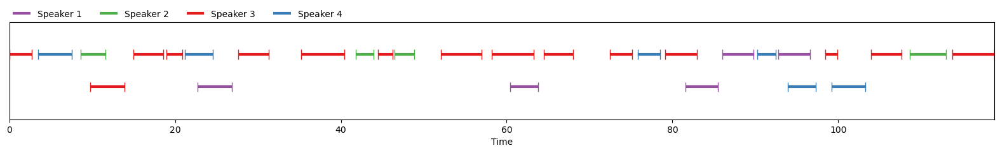

In [80]:
pred_reference_pyannote

In [81]:
print(pred_reference_pyannote)

[ 00:00:00.000 -->  00:00:02.704] _ Speaker 3
[ 00:00:03.440 -->  00:00:07.552] _ Speaker 4
[ 00:00:08.608 -->  00:00:11.612] _ Speaker 2
[ 00:00:09.766 -->  00:00:13.888] _ Speaker 3
[ 00:00:14.960 -->  00:00:18.544] _ Speaker 3
[ 00:00:18.960 -->  00:00:20.896] _ Speaker 3
[ 00:00:21.168 -->  00:00:24.528] _ Speaker 4
[ 00:00:22.723 -->  00:00:26.832] _ Speaker 1
[ 00:00:27.632 -->  00:00:31.280] _ Speaker 3
[ 00:00:35.200 -->  00:00:40.432] _ Speaker 3
[ 00:00:41.824 -->  00:00:43.936] _ Speaker 2
[ 00:00:44.480 -->  00:00:46.208] _ Speaker 3
[ 00:00:46.496 -->  00:00:48.826] _ Speaker 2
[ 00:00:52.032 -->  00:00:56.960] _ Speaker 3
[ 00:00:58.192 -->  00:01:03.246] _ Speaker 3
[ 00:01:00.438 -->  00:01:03.776] _ Speaker 1
[ 00:01:04.512 -->  00:01:07.984] _ Speaker 3
[ 00:01:12.462 -->  00:01:15.136] _ Speaker 3
[ 00:01:15.856 -->  00:01:18.496] _ Speaker 4
[ 00:01:19.104 -->  00:01:22.952] _ Speaker 3
[ 00:01:21.566 -->  00:01:25.456] _ Speaker 1
[ 00:01:26.064 -->  00:01:29.760] 

#### save the result and use the result for the ASR task

In [82]:
import soundfile as sf
pred_json_data = {}
c = 0
for spk in simlified_time_stamp_with_text.keys():
    for start, end, audio, text in simlified_time_stamp_with_text[spk]:
        #print(start, end, audio.shape)
        key = f'{c}'
        file_path = f'pred_audio_file/{spk}_{c}.flac'
        words = text
        spkID = spk
        length = audio.shape[0]
        
        # save to flac
        sf.write(file_path, audio, 16000)
        c += 1
        
        # store to json_data
        pred_json_data[key] = {'file_path': file_path,
                             'words': words,
                             'spkID': spk,
                             'length': length}
        
pred_json_data

{'0': {'file_path': 'pred_audio_file/Speaker 1_0.flac',
  'words': 'ONE WHO WRITES OF SUCH AN ERA LABOURS UNDER A TROUBLESOME DISADVANTAGE',
  'spkID': 'Speaker 1',
  'length': 65664},
 '1': {'file_path': 'pred_audio_file/Speaker 1_1.flac',
  'words': 'THE VERY EMPERORS HAD ARRAYED THEMSELVES ON HER SIDE',
  'spkID': 'Speaker 1',
  'length': 53248},
 '2': {'file_path': 'pred_audio_file/Speaker 1_2.flac',
  'words': 'BUT IF THE EMPERORS HAD BECOME CHRISTIAN THE EMPIRE HAD NOT',
  'spkID': 'Speaker 1',
  'length': 62080},
 '3': {'file_path': 'pred_audio_file/Speaker 1_3.flac',
  'words': 'THE MENS SANA MUST HAVE A CORPUS SANUM TO INHABIT',
  'spkID': 'Speaker 1',
  'length': 59008},
 '4': {'file_path': 'pred_audio_file/Speaker 1_4.flac',
  'words': 'AND THE NEW BLOOD AT THE ERA OF THIS STORY WAS AT HAND',
  'spkID': 'Speaker 1',
  'length': 62336},
 '5': {'file_path': 'pred_audio_file/Speaker 2_5.flac',
  'words': 'SHASTA RAMBLES AND MODOC MEMORIES',
  'spkID': 'Speaker 2',
  'length': 4

In [83]:
import json
with open('manifests/pred_log.json', "w") as f:
    json.dump(pred_json_data, f, indent=4)

# ASR

#### reuse the pipeline written by myself

In [84]:
import torch.nn.functional as F
import speechbrain as sb
from hyperpyyaml import load_hyperpyyaml
import os
import re
import datetime

The torchaudio backend is switched to 'soundfile'. Note that 'sox_io' is not supported on Windows.
The torchaudio backend is switched to 'soundfile'. Note that 'sox_io' is not supported on Windows.


In [85]:
HPARAM_FILE = 'hparams\las.yaml'
time_stamp = datetime.datetime.now().strftime('%Y-%m-%d+%H-%M-%S')
print(f'Experiment Time Stamp: {time_stamp}')
argv = [HPARAM_FILE, '--time_stamp', time_stamp]

hparam_file, run_opts, overrides = sb.parse_arguments(argv)

with open(HPARAM_FILE) as f:
    hparams = load_hyperpyyaml(f, overrides)

Experiment Time Stamp: 2023-05-07+15-24-22


### reuse the model pipeline written by myself

In [86]:
@sb.utils.data_pipeline.takes('words')
@sb.utils.data_pipeline.provides('words', 'tokens_list', 'tokens_eos', 'tokens')
def text_pipeline(words):
    yield words
    tokens_list = hparams['tokenizer'].encode(words, eos=False)
    yield tokens_list
    tokens_eos = torch.LongTensor(
        tokens_list 
        + [hparams['eos_idx']] 
        + [hparams['ignore_idx']] * (hparams['max_decoding_length']-1-len(tokens_list))
    )
    yield tokens_eos
    tokens = torch.LongTensor(tokens_list)
    yield tokens

In [87]:
from speechbrain.dataio.dataset import DynamicItemDataset

# Create Train Dataset
train_manifest_path = hparams['train_manifest_path']
print(f'Creating training set from {train_manifest_path}')
train_set = DynamicItemDataset.from_json(train_manifest_path)
train_set.add_dynamic_item(
    sb.dataio.dataio.read_audio, takes='file_path', provides='signal'
)
# We only sort utterances by signal length to reduce the overhead of padding
train_set = train_set.filtered_sorted(sort_key='length', select_n=hparams['n_train'])
train_set.add_dynamic_item(text_pipeline)
train_set.set_output_keys(
    ['id', 'signal', 'words', 'tokens_list', 'tokens_eos', 'tokens']
)
    
# Create Valid Dataset
valid_manifest_path = hparams['valid_manifest_path']
print(f'Creating validation set from {valid_manifest_path}')
valid_set = DynamicItemDataset.from_json(valid_manifest_path)
valid_set.add_dynamic_item(
    sb.dataio.dataio.read_audio, takes='file_path', provides='signal'
)
valid_set = valid_set.filtered_sorted(sort_key='length', select_n=hparams['n_valid'])
valid_set.add_dynamic_item(text_pipeline)
valid_set.set_output_keys(
    ['id', 'signal', 'words', 'tokens_list', 'tokens_eos', 'tokens']
)

# Create Test Dataset 
test_manifest_path = hparams['test_manifest_path'] 
print(f'Creating validation set from {test_manifest_path}')
test_set = DynamicItemDataset.from_json(test_manifest_path)
test_set.add_dynamic_item(
    sb.dataio.dataio.read_audio, takes='file_path', provides='signal'
)
test_set = test_set.filtered_sorted(sort_key='length', select_n=hparams['n_test'])
test_set.add_dynamic_item(text_pipeline)
test_set.set_output_keys(
    ['id', 'signal', 'words', 'tokens_list', 'tokens_eos', 'tokens']
)

Creating training set from manifests/pred_log.json
Creating validation set from manifests/pred_log.json
Creating validation set from manifests/pred_log.json


In [88]:
class LasASR(sb.core.Brain):
    
    ################################################################################
    def listen(self, x, x_lens):    
        # TODO: Implement listen
        # x [8, 57, 40]
        h, _ = self.modules.listener(x, x_lens) # [8, 57, 40]
        return h
    
    def attend_spell(self, h, c_prev, y_prev, lens, rnn_state_prev=None):
        # TODO: Implement attend_spell           
        # Step 0: Extract character embedding y_prev
        # c_prev [8, 40] [B, n_mfcc]
        y_embedding = self.modules.embedder(y_prev) # [8, 64] [B, hidden_dim]
        
        # Step 1: s_new, rnn_state_new = RNN(y_prev, c_prev, rnn_state_prev)
        y_c_concat = torch.cat((y_embedding, c_prev), dim=1)
        y_c_concat = y_c_concat.unsqueeze(1) # [8, 1, 104] [B, 1, hidden_dim+n_mfcc]
        s_new, rnn_state_new = self.modules.rnn(y_c_concat, lens, rnn_state_prev)
        # s_new [8, 1, 104] [B, 1, hidden_dim+n_mfcc]
        
        # Step 2: c_new = AttentionContext(h, s_new)
        # Need a linear projection 'phi' on s_new to match the dimension of h.
        phi_s_new = self.modules.phi(s_new) # [8, 1, 40] [B, 1, n_mfcc]

        # Hint: For i in the batch:
        #    (1). Calculate the similarity[i](inner product) between phi(s_new)[i] 
        #    and every valid(0:lens[i]) frames of h[i]
        similarity = torch.bmm(phi_s_new, h.transpose(1, 2)).transpose(1, 2).squeeze()
  
        #    (2). attention[i] is the normalized similarity across valid frames
        
        attention = []
        for i in range(h.shape[0]):
            score = torch.softmax(similarity[i, :lens[i]], dim=0).view(-1,1)
            attention.append(score)
            
        c_new = []
        for i in range(h.shape[0]):
            score = (h[i, :lens[i]] * attention[i]).sum(0)
            c_new.append(score.unsqueeze(0))
        c_new = torch.stack(c_new, dim=0)
        
        # Step 3: p_new = CharacterDistribution(s_new, c_new)
        concat_three = torch.cat([s_new, c_new], dim=2)
                
        p_new = self.modules.character_distribution(concat_three).squeeze(1)
        
        return p_new, rnn_state_new, c_new
    

    def listen_attend_spell(self, x, lens, labels=None, teacher_forcing=True):
        
        batch_size = x.shape[0]
        
        # Estimated label probabilties and best labels
        est_probs = []
        est_labels = []
        
        # Listen
        h = self.listen(x, lens)
        
        # Attend and Spell
        for step in range(self.hparams.max_decoding_length):
            if step == 0:
                # Use BOS as the beginning label
                label_prev = torch.ones(batch_size, device=x.device).long() * self.hparams.bos_idx
                # Initialize a zero context vector
                c_prev = torch.zeros(batch_size, self.hparams.n_mfcc, device=x.device) # 
                rnn_state_prev = None
            else:
                # TODO: Implement teacher forcing in training.
                # If teacher_forcing, use true last label,
                # Else, use estimated last label.
                rnn_state_prev = rnn_state_new
                c_prev = c_new.squeeze()
                if teacher_forcing:
                    label_prev = labels[:, step-1]
                else:
                    label_prev = y_new
                                           
            # Decode
            p_new, rnn_state_new, c_new = self.attend_spell(h, c_prev, label_prev, lens, rnn_state_prev)
            
            # Select the token index with the highest probability
            y_new = torch.argmax(p_new, dim=1)
            
            est_probs.append(p_new.unsqueeze(1))
            est_labels.append(y_new.unsqueeze(1))
            
            
        est_probs = torch.cat(est_probs, 1)  # (B, N, V-1) (no BOS)
        est_labels = torch.cat(est_labels, 1)  # (B, N)
        
        
        return est_probs, est_labels
    
    ################################################################################
    
    def on_fit_start(self):
        super().on_fit_start()
        
    def compute_forward(self, batch, stage):
        batch = batch.to(self.device)
        wavs, wav_lens = batch.signal
        tokens_eos, _ = batch.tokens_eos
        
        # Compute MFCC
        mfcc = self.modules.compute_features(wavs) # (B, n_mfcc, N)
        mfcc = mfcc.permute(0, 2, 1).contiguous() # (B, N, n_mfcc=40)
        # Compute valid MFCC lengths
        mfcc_lens = torch.ones_like(wav_lens) \
            * mfcc.shape[1] \
            * wav_lens # max_mfcc_lens * ratio
        mfcc_lens = mfcc_lens.long()
        
        # Adaptive normalization
        current_epoch = self.hparams.epoch_counter.current
        mfcc = self.modules.normalizer(mfcc, wav_lens, epoch=current_epoch)
        
        est_probs, est_labels = self.listen_attend_spell(
            mfcc, mfcc_lens, tokens_eos, 
            teacher_forcing=(stage==sb.Stage.TRAIN)
        )
        
        return est_probs, est_labels

    def compute_objectives(self, predictions, batch, stage):
        ids = batch.id
        tokens_eos, _ = batch.tokens_eos
        est_probs, est_labels = predictions
        batch_size = est_probs.shape[0]
        
        est_probs = est_probs.view(-1, self.hparams.bos_idx)
        tokens_eos = tokens_eos.view(-1)
        loss = self.hparams.loss_fn(est_probs, tokens_eos)
        
        if stage != sb.Stage.TRAIN:
            # Decode token terms to words
            predicted_words = [
                self.hparams.tokenizer.decode(est_label).split(' ') 
                for est_label in est_labels
            ]
            target_words = [wrd.split(' ') for wrd in batch.words]
            self.wer_metric.append(ids, predicted_words, target_words)
            self.cer_metric.append(ids, predicted_words, target_words)
            
        return loss

    def evaluate_batch(self, batch, stage):
        with torch.no_grad():
            predictions = self.compute_forward(batch, stage=stage)
            loss = self.compute_objectives(predictions, batch, stage=stage)
        return loss.detach()

    def on_stage_start(self, stage, epoch):
        if stage != sb.Stage.TRAIN:
            self.wer_metric = self.hparams.wer_computer()
            self.cer_metric = self.hparams.cer_computer()

    def on_stage_end(self, stage, stage_loss, epoch):
        # Compute stats
        stage_stats = {'loss': stage_loss}
        if stage == sb.Stage.TRAIN:
            self.train_stats = stage_stats
        else:
            stage_stats['WER'] = self.wer_metric.summarize('error_rate')
            stage_stats["CER"] = self.cer_metric.summarize("error_rate")

        if stage == sb.Stage.VALID:
            self.checkpointer.save_and_keep_only(
                meta={'WER': stage_stats['WER'], 'epoch': epoch},
                min_keys=['WER'],
            )

        elif stage == sb.Stage.TEST:
            with open(self.hparams.wer_file, 'w') as w:
                self.wer_metric.write_stats(w)
                
        print(f'Epoch {epoch}: ', stage, stage_stats) 

    def fit_batch(self, batch):
        outputs = self.compute_forward(batch, sb.Stage.TRAIN)
        loss = self.compute_objectives(outputs, batch, sb.Stage.TRAIN)
        loss.backward()
        if self.check_gradients(loss): # grad is clipped here
            self.optimizer.step()
        self.optimizer.zero_grad()
        
        return loss.detach().cpu()

In [89]:
brain = LasASR(
    hparams['modules'], 
    hparams=hparams, 
    opt_class=hparams['opt_class'],
    run_opts=run_opts,
    checkpointer=hparams['checkpointer']
)

In [90]:
brain.fit(
    epoch_counter=hparams['epoch_counter'],
    train_set=train_set,
    valid_set=train_set,
    train_loader_kwargs=hparams['train_dataloader_opts'],
    valid_loader_kwargs=hparams['valid_dataloader_opts'],
)

100%|██████████| 8/8 [00:04<00:00,  1.66it/s, train_loss=3.36]


Epoch 1:  Stage.TRAIN {'loss': 3.3633523285388947}


100%|██████████| 8/8 [00:02<00:00,  2.97it/s]


Epoch 1:  Stage.VALID {'loss': 3.2778177559375763, 'WER': 285.55956678700363, 'CER': 196.5099715099715}


100%|██████████| 8/8 [00:05<00:00,  1.56it/s, train_loss=3.12]


Epoch 2:  Stage.TRAIN {'loss': 3.1247919201850887}


100%|██████████| 8/8 [00:03<00:00,  2.51it/s]


Epoch 2:  Stage.VALID {'loss': 3.1429642140865326, 'WER': 473.2851985559567, 'CER': 233.04843304843305}


100%|██████████| 8/8 [00:05<00:00,  1.53it/s, train_loss=2.93]


Epoch 3:  Stage.TRAIN {'loss': 2.9269977807998657}


100%|██████████| 8/8 [00:03<00:00,  2.31it/s]


Epoch 3:  Stage.VALID {'loss': 3.034101903438568, 'WER': 694.2238267148015, 'CER': 241.45299145299145}


100%|██████████| 8/8 [00:04<00:00,  1.82it/s, train_loss=2.77]


Epoch 4:  Stage.TRAIN {'loss': 2.767353683710098}


100%|██████████| 8/8 [00:03<00:00,  2.66it/s]


Epoch 4:  Stage.VALID {'loss': 2.9758760035037994, 'WER': 714.4404332129964, 'CER': 243.3048433048433}


100%|██████████| 8/8 [00:05<00:00,  1.54it/s, train_loss=2.67]


Epoch 5:  Stage.TRAIN {'loss': 2.674810647964477}


100%|██████████| 8/8 [00:03<00:00,  2.49it/s]


Epoch 5:  Stage.VALID {'loss': 3.0031777620315556, 'WER': 560.6498194945848, 'CER': 238.6039886039886}


100%|██████████| 8/8 [00:05<00:00,  1.55it/s, train_loss=2.6] 


Epoch 6:  Stage.TRAIN {'loss': 2.5982790291309357}


100%|██████████| 8/8 [00:03<00:00,  2.50it/s]


Epoch 6:  Stage.VALID {'loss': 2.9773997962474827, 'WER': 463.1768953068592, 'CER': 234.18803418803418}


100%|██████████| 8/8 [00:05<00:00,  1.53it/s, train_loss=2.52]


Epoch 7:  Stage.TRAIN {'loss': 2.515590250492096}


100%|██████████| 8/8 [00:03<00:00,  2.50it/s]


Epoch 7:  Stage.VALID {'loss': 3.0298221707344055, 'WER': 435.37906137184115, 'CER': 230.91168091168092}


100%|██████████| 8/8 [00:05<00:00,  1.54it/s, train_loss=2.45]


Epoch 8:  Stage.TRAIN {'loss': 2.4454285502433777}


100%|██████████| 8/8 [00:03<00:00,  2.51it/s]


Epoch 8:  Stage.VALID {'loss': 3.079600632190705, 'WER': 390.97472924187724, 'CER': 228.98860398860398}


100%|██████████| 8/8 [00:05<00:00,  1.52it/s, train_loss=2.39]


Epoch 9:  Stage.TRAIN {'loss': 2.3938151597976685}


100%|██████████| 8/8 [00:03<00:00,  2.50it/s]


Epoch 9:  Stage.VALID {'loss': 3.063106685876846, 'WER': 377.6173285198556, 'CER': 231.26780626780626}


100%|██████████| 8/8 [00:05<00:00,  1.56it/s, train_loss=2.34]


Epoch 10:  Stage.TRAIN {'loss': 2.3433539569377895}


100%|██████████| 8/8 [00:03<00:00,  2.52it/s]


Epoch 10:  Stage.VALID {'loss': 3.080175906419754, 'WER': 354.87364620938627, 'CER': 233.1196581196581}


100%|██████████| 8/8 [00:05<00:00,  1.53it/s, train_loss=2.29]


Epoch 11:  Stage.TRAIN {'loss': 2.289987653493881}


100%|██████████| 8/8 [00:03<00:00,  2.53it/s]


Epoch 11:  Stage.VALID {'loss': 3.1466158628463745, 'WER': 348.014440433213, 'CER': 230.05698005698005}


100%|██████████| 8/8 [00:05<00:00,  1.55it/s, train_loss=2.23]


Epoch 12:  Stage.TRAIN {'loss': 2.225614458322525}


100%|██████████| 8/8 [00:03<00:00,  2.46it/s]


Epoch 12:  Stage.VALID {'loss': 3.1603308916091923, 'WER': 343.6823104693141, 'CER': 229.34472934472936}


100%|██████████| 8/8 [00:05<00:00,  1.53it/s, train_loss=2.17]


Epoch 13:  Stage.TRAIN {'loss': 2.1703915148973465}


100%|██████████| 8/8 [00:03<00:00,  2.52it/s]


Epoch 13:  Stage.VALID {'loss': 3.199022322893143, 'WER': 324.9097472924188, 'CER': 227.49287749287748}


100%|██████████| 8/8 [00:05<00:00,  1.53it/s, train_loss=2.1] 


Epoch 14:  Stage.TRAIN {'loss': 2.103695124387741}


100%|██████████| 8/8 [00:03<00:00,  2.46it/s]


Epoch 14:  Stage.VALID {'loss': 3.2515578269958496, 'WER': 349.81949458483757, 'CER': 228.56125356125355}


100%|██████████| 8/8 [00:05<00:00,  1.53it/s, train_loss=2.04]


Epoch 15:  Stage.TRAIN {'loss': 2.041328102350235}


100%|██████████| 8/8 [00:03<00:00,  2.45it/s]


Epoch 15:  Stage.VALID {'loss': 3.3247376084327693, 'WER': 347.6534296028881, 'CER': 226.56695156695156}


100%|██████████| 8/8 [00:05<00:00,  1.54it/s, train_loss=1.98]


Epoch 16:  Stage.TRAIN {'loss': 1.981545150279999}


100%|██████████| 8/8 [00:03<00:00,  2.49it/s]


Epoch 16:  Stage.VALID {'loss': 3.3885920345783234, 'WER': 324.9097472924188, 'CER': 226.85185185185185}


100%|██████████| 8/8 [00:05<00:00,  1.55it/s, train_loss=1.93]


Epoch 17:  Stage.TRAIN {'loss': 1.9339715838432312}


100%|██████████| 8/8 [00:03<00:00,  2.49it/s]


Epoch 17:  Stage.VALID {'loss': 3.3369073569774628, 'WER': 385.1985559566787, 'CER': 227.77777777777777}


100%|██████████| 8/8 [00:05<00:00,  1.53it/s, train_loss=1.9] 


Epoch 18:  Stage.TRAIN {'loss': 1.8977962285280228}


100%|██████████| 8/8 [00:03<00:00,  2.53it/s]


Epoch 18:  Stage.VALID {'loss': 3.3721727132797237, 'WER': 349.09747292418774, 'CER': 218.87464387464388}


100%|██████████| 8/8 [00:05<00:00,  1.54it/s, train_loss=1.85]


Epoch 19:  Stage.TRAIN {'loss': 1.851301684975624}


100%|██████████| 8/8 [00:03<00:00,  2.56it/s]


Epoch 19:  Stage.VALID {'loss': 3.4736084043979645, 'WER': 279.42238267148014, 'CER': 214.31623931623932}


100%|██████████| 8/8 [00:05<00:00,  1.53it/s, train_loss=1.82]


Epoch 20:  Stage.TRAIN {'loss': 1.8244152814149857}


100%|██████████| 8/8 [00:03<00:00,  2.51it/s]


Epoch 20:  Stage.VALID {'loss': 3.421836704015732, 'WER': 368.23104693140795, 'CER': 215.52706552706553}


100%|██████████| 8/8 [00:05<00:00,  1.55it/s, train_loss=1.78]


Epoch 21:  Stage.TRAIN {'loss': 1.7787935584783554}


100%|██████████| 8/8 [00:03<00:00,  2.49it/s]


Epoch 21:  Stage.VALID {'loss': 3.5748507380485535, 'WER': 316.9675090252708, 'CER': 224.002849002849}


100%|██████████| 8/8 [00:05<00:00,  1.54it/s, train_loss=1.72]


Epoch 22:  Stage.TRAIN {'loss': 1.7239948511123657}


100%|██████████| 8/8 [00:03<00:00,  2.54it/s]


Epoch 22:  Stage.VALID {'loss': 3.6116733253002167, 'WER': 337.1841155234657, 'CER': 212.39316239316238}


100%|██████████| 8/8 [00:05<00:00,  1.55it/s, train_loss=1.68]


Epoch 23:  Stage.TRAIN {'loss': 1.6767859011888502}


100%|██████████| 8/8 [00:03<00:00,  2.62it/s]


Epoch 23:  Stage.VALID {'loss': 3.487104833126068, 'WER': 299.27797833935017, 'CER': 190.95441595441596}


100%|██████████| 8/8 [00:04<00:00,  1.76it/s, train_loss=1.61]


Epoch 24:  Stage.TRAIN {'loss': 1.6099632680416107}


100%|██████████| 8/8 [00:03<00:00,  2.59it/s]


Epoch 24:  Stage.VALID {'loss': 3.49301615357399, 'WER': 264.25992779783394, 'CER': 179.34472934472936}


100%|██████████| 8/8 [00:04<00:00,  1.70it/s, train_loss=1.55]


Epoch 25:  Stage.TRAIN {'loss': 1.551421657204628}


100%|██████████| 8/8 [00:03<00:00,  2.59it/s]


Epoch 25:  Stage.VALID {'loss': 3.5582292377948765, 'WER': 314.07942238267145, 'CER': 191.8091168091168}


100%|██████████| 8/8 [00:04<00:00,  1.67it/s, train_loss=1.5]  


Epoch 26:  Stage.TRAIN {'loss': 1.4975743293762207}


100%|██████████| 8/8 [00:02<00:00,  2.75it/s]


Epoch 26:  Stage.VALID {'loss': 3.524251192808151, 'WER': 229.24187725631768, 'CER': 168.8034188034188}


100%|██████████| 8/8 [00:04<00:00,  1.87it/s, train_loss=1.47]


Epoch 27:  Stage.TRAIN {'loss': 1.4668826833367348}


100%|██████████| 8/8 [00:02<00:00,  2.79it/s]


Epoch 27:  Stage.VALID {'loss': 3.587803304195404, 'WER': 271.4801444043321, 'CER': 176.56695156695156}


100%|██████████| 8/8 [00:05<00:00,  1.50it/s, train_loss=1.42] 


Epoch 28:  Stage.TRAIN {'loss': 1.419906072318554}


100%|██████████| 8/8 [00:03<00:00,  2.61it/s]


Epoch 28:  Stage.VALID {'loss': 3.628565311431885, 'WER': 226.71480144404333, 'CER': 157.40740740740742}


100%|██████████| 8/8 [00:04<00:00,  1.72it/s, train_loss=1.38] 


Epoch 29:  Stage.TRAIN {'loss': 1.3796738535165787}


100%|██████████| 8/8 [00:02<00:00,  2.89it/s]


Epoch 29:  Stage.VALID {'loss': 3.555492550134659, 'WER': 224.90974729241879, 'CER': 164.95726495726495}


100%|██████████| 8/8 [00:05<00:00,  1.54it/s, train_loss=1.33] 


Epoch 30:  Stage.TRAIN {'loss': 1.3259508907794952}


100%|██████████| 8/8 [00:03<00:00,  2.64it/s]


Epoch 30:  Stage.VALID {'loss': 3.5712355226278305, 'WER': 261.01083032490976, 'CER': 167.30769230769232}


100%|██████████| 8/8 [00:05<00:00,  1.54it/s, train_loss=1.26] 


Epoch 31:  Stage.TRAIN {'loss': 1.2649710029363632}


100%|██████████| 8/8 [00:02<00:00,  2.73it/s]


Epoch 31:  Stage.VALID {'loss': 3.5855497717857356, 'WER': 207.5812274368231, 'CER': 150.92592592592592}


100%|██████████| 8/8 [00:05<00:00,  1.53it/s, train_loss=1.21] 


Epoch 32:  Stage.TRAIN {'loss': 1.2148178219795227}


100%|██████████| 8/8 [00:03<00:00,  2.63it/s]


Epoch 32:  Stage.VALID {'loss': 3.683043032884598, 'WER': 256.3176895306859, 'CER': 165.81196581196582}


100%|██████████| 8/8 [00:04<00:00,  1.71it/s, train_loss=1.14] 


Epoch 33:  Stage.TRAIN {'loss': 1.1413775756955147}


100%|██████████| 8/8 [00:02<00:00,  2.83it/s]


Epoch 33:  Stage.VALID {'loss': 3.574325293302536, 'WER': 213.35740072202165, 'CER': 146.5811965811966}


100%|██████████| 8/8 [00:04<00:00,  1.81it/s, train_loss=1.08] 


Epoch 34:  Stage.TRAIN {'loss': 1.0823636874556541}


100%|██████████| 8/8 [00:02<00:00,  3.09it/s]


Epoch 34:  Stage.VALID {'loss': 3.594832882285118, 'WER': 167.87003610108303, 'CER': 127.77777777777777}


100%|██████████| 8/8 [00:05<00:00,  1.53it/s, train_loss=1.06] 


Epoch 35:  Stage.TRAIN {'loss': 1.06098635494709}


100%|██████████| 8/8 [00:03<00:00,  2.58it/s]


Epoch 35:  Stage.VALID {'loss': 3.802148476243019, 'WER': 202.8880866425993, 'CER': 147.36467236467237}


100%|██████████| 8/8 [00:04<00:00,  1.74it/s, train_loss=1.05] 


Epoch 36:  Stage.TRAIN {'loss': 1.0467686653137207}


100%|██████████| 8/8 [00:02<00:00,  2.83it/s]


Epoch 36:  Stage.VALID {'loss': 3.613328114151954, 'WER': 210.10830324909747, 'CER': 147.7920227920228}


100%|██████████| 8/8 [00:04<00:00,  1.62it/s, train_loss=1.09] 


Epoch 37:  Stage.TRAIN {'loss': 1.0895361080765724}


100%|██████████| 8/8 [00:02<00:00,  2.95it/s]


Epoch 37:  Stage.VALID {'loss': 3.81975519657135, 'WER': 180.8664259927798, 'CER': 132.54985754985756}


100%|██████████| 8/8 [00:05<00:00,  1.54it/s, train_loss=1.02] 


Epoch 38:  Stage.TRAIN {'loss': 1.0154484026134014}


100%|██████████| 8/8 [00:02<00:00,  2.75it/s]


Epoch 38:  Stage.VALID {'loss': 3.839139223098755, 'WER': 204.33212996389892, 'CER': 141.8803418803419}


100%|██████████| 8/8 [00:05<00:00,  1.57it/s, train_loss=0.945]


Epoch 39:  Stage.TRAIN {'loss': 0.9448839128017426}


100%|██████████| 8/8 [00:02<00:00,  2.68it/s]


Epoch 39:  Stage.VALID {'loss': 3.6943209916353226, 'WER': 219.1335740072202, 'CER': 156.4102564102564}


100%|██████████| 8/8 [00:05<00:00,  1.55it/s, train_loss=0.898]


Epoch 40:  Stage.TRAIN {'loss': 0.8982771039009094}


100%|██████████| 8/8 [00:02<00:00,  2.85it/s]


Epoch 40:  Stage.VALID {'loss': 3.8719059079885483, 'WER': 187.00361010830323, 'CER': 131.12535612535612}


100%|██████████| 8/8 [00:05<00:00,  1.55it/s, train_loss=0.84] 


Epoch 41:  Stage.TRAIN {'loss': 0.8396855890750885}


100%|██████████| 8/8 [00:02<00:00,  2.82it/s]


Epoch 41:  Stage.VALID {'loss': 3.850631788372994, 'WER': 181.5884476534296, 'CER': 125.07122507122507}


100%|██████████| 8/8 [00:05<00:00,  1.59it/s, train_loss=0.782]


Epoch 42:  Stage.TRAIN {'loss': 0.78202760592103}


100%|██████████| 8/8 [00:02<00:00,  2.91it/s]


Epoch 42:  Stage.VALID {'loss': 3.750684965401888, 'WER': 175.45126353790613, 'CER': 133.04843304843305}


100%|██████████| 8/8 [00:04<00:00,  1.80it/s, train_loss=0.743]


Epoch 43:  Stage.TRAIN {'loss': 0.7432494759559632}


100%|██████████| 8/8 [00:02<00:00,  2.91it/s]


Epoch 43:  Stage.VALID {'loss': 3.6105756536126137, 'WER': 168.59205776173286, 'CER': 122.5071225071225}


100%|██████████| 8/8 [00:04<00:00,  1.81it/s, train_loss=0.719]


Epoch 44:  Stage.TRAIN {'loss': 0.7185515537858008}


100%|██████████| 8/8 [00:02<00:00,  3.05it/s]


Epoch 44:  Stage.VALID {'loss': 3.5765207149088383, 'WER': 161.37184115523465, 'CER': 114.95726495726495}


100%|██████████| 8/8 [00:04<00:00,  1.61it/s, train_loss=0.705]


Epoch 45:  Stage.TRAIN {'loss': 0.7048140875995159}


100%|██████████| 8/8 [00:02<00:00,  3.01it/s]


Epoch 45:  Stage.VALID {'loss': 3.4796425364911556, 'WER': 131.04693140794222, 'CER': 108.68945868945869}


100%|██████████| 8/8 [00:05<00:00,  1.55it/s, train_loss=0.718]


Epoch 46:  Stage.TRAIN {'loss': 0.7181283570826054}


100%|██████████| 8/8 [00:02<00:00,  2.76it/s]


Epoch 46:  Stage.VALID {'loss': 3.6214767061173916, 'WER': 190.25270758122744, 'CER': 132.83475783475782}


100%|██████████| 8/8 [00:05<00:00,  1.54it/s, train_loss=0.709]


Epoch 47:  Stage.TRAIN {'loss': 0.7091398648917676}


100%|██████████| 8/8 [00:02<00:00,  2.80it/s]


Epoch 47:  Stage.VALID {'loss': 3.359297599643469, 'WER': 168.23104693140795, 'CER': 123.86039886039886}


100%|██████████| 8/8 [00:05<00:00,  1.54it/s, train_loss=0.669]


Epoch 48:  Stage.TRAIN {'loss': 0.6686901971697807}


100%|██████████| 8/8 [00:02<00:00,  2.76it/s]


Epoch 48:  Stage.VALID {'loss': 3.030996210873127, 'WER': 166.4259927797834, 'CER': 125.56980056980056}


100%|██████████| 8/8 [00:05<00:00,  1.56it/s, train_loss=0.692]


Epoch 49:  Stage.TRAIN {'loss': 0.6921668667346239}


100%|██████████| 8/8 [00:02<00:00,  2.77it/s]


Epoch 49:  Stage.VALID {'loss': 3.2986775003373627, 'WER': 158.4837545126354, 'CER': 111.6096866096866}


100%|██████████| 8/8 [00:05<00:00,  1.54it/s, train_loss=0.608]


Epoch 50:  Stage.TRAIN {'loss': 0.608338002115488}


100%|██████████| 8/8 [00:02<00:00,  2.80it/s]


Epoch 50:  Stage.VALID {'loss': 3.295144610106945, 'WER': 150.18050541516246, 'CER': 111.32478632478633}


100%|██████████| 8/8 [00:05<00:00,  1.56it/s, train_loss=0.558]


Epoch 51:  Stage.TRAIN {'loss': 0.5582380369305611}


100%|██████████| 8/8 [00:02<00:00,  2.84it/s]


Epoch 51:  Stage.VALID {'loss': 3.143068417906761, 'WER': 135.74007220216606, 'CER': 105.76923076923077}


100%|██████████| 8/8 [00:05<00:00,  1.54it/s, train_loss=0.517]


Epoch 52:  Stage.TRAIN {'loss': 0.5171372331678867}


100%|██████████| 8/8 [00:02<00:00,  2.84it/s]


Epoch 52:  Stage.VALID {'loss': 3.0042334236204624, 'WER': 120.93862815884476, 'CER': 92.5925925925926}


100%|██████████| 8/8 [00:05<00:00,  1.55it/s, train_loss=0.477]


Epoch 53:  Stage.TRAIN {'loss': 0.4768575932830572}


100%|██████████| 8/8 [00:02<00:00,  2.91it/s]


Epoch 53:  Stage.VALID {'loss': 2.8334840927273035, 'WER': 104.33212996389892, 'CER': 82.97720797720798}


100%|██████████| 8/8 [00:05<00:00,  1.55it/s, train_loss=0.445]


Epoch 54:  Stage.TRAIN {'loss': 0.44538650661706924}


100%|██████████| 8/8 [00:02<00:00,  2.79it/s]


Epoch 54:  Stage.VALID {'loss': 2.847000066190958, 'WER': 101.08303249097473, 'CER': 82.19373219373219}


100%|██████████| 8/8 [00:05<00:00,  1.52it/s, train_loss=0.44] 


Epoch 55:  Stage.TRAIN {'loss': 0.43959155306220055}


100%|██████████| 8/8 [00:02<00:00,  2.83it/s]


Epoch 55:  Stage.VALID {'loss': 2.899300320073962, 'WER': 102.52707581227436, 'CER': 80.6980056980057}


100%|██████████| 8/8 [00:05<00:00,  1.52it/s, train_loss=0.421]


Epoch 56:  Stage.TRAIN {'loss': 0.4207251723855734}


100%|██████████| 8/8 [00:02<00:00,  2.87it/s]


Epoch 56:  Stage.VALID {'loss': 2.9036708548665047, 'WER': 90.97472924187726, 'CER': 72.57834757834758}


100%|██████████| 8/8 [00:05<00:00,  1.54it/s, train_loss=0.403]


Epoch 57:  Stage.TRAIN {'loss': 0.4025723915547133}


100%|██████████| 8/8 [00:02<00:00,  2.89it/s]


Epoch 57:  Stage.VALID {'loss': 2.7891659168526535, 'WER': 109.74729241877256, 'CER': 81.12535612535612}


100%|██████████| 8/8 [00:05<00:00,  1.52it/s, train_loss=0.356]


Epoch 58:  Stage.TRAIN {'loss': 0.3562486888840795}


100%|██████████| 8/8 [00:02<00:00,  2.87it/s]


Epoch 58:  Stage.VALID {'loss': 2.8479828210547566, 'WER': 83.39350180505416, 'CER': 65.74074074074075}


100%|██████████| 8/8 [00:05<00:00,  1.55it/s, train_loss=0.336]


Epoch 59:  Stage.TRAIN {'loss': 0.3359005311504007}


100%|██████████| 8/8 [00:02<00:00,  2.97it/s]


Epoch 59:  Stage.VALID {'loss': 2.8617142885923386, 'WER': 84.11552346570397, 'CER': 66.16809116809117}


100%|██████████| 8/8 [00:05<00:00,  1.54it/s, train_loss=0.318] 


Epoch 60:  Stage.TRAIN {'loss': 0.3181488458067179}


100%|██████████| 8/8 [00:02<00:00,  2.96it/s]


Epoch 60:  Stage.VALID {'loss': 2.5127888778224587, 'WER': 74.0072202166065, 'CER': 58.26210826210826}


100%|██████████| 8/8 [00:05<00:00,  1.55it/s, train_loss=0.3]   


Epoch 61:  Stage.TRAIN {'loss': 0.30037522036582226}


100%|██████████| 8/8 [00:02<00:00,  2.92it/s]


Epoch 61:  Stage.VALID {'loss': 2.615741131827235, 'WER': 78.70036101083032, 'CER': 61.396011396011396}


100%|██████████| 8/8 [00:05<00:00,  1.54it/s, train_loss=0.274] 


Epoch 62:  Stage.TRAIN {'loss': 0.2736950945109129}


100%|██████████| 8/8 [00:02<00:00,  2.92it/s]


Epoch 62:  Stage.VALID {'loss': 2.7116540018469095, 'WER': 78.33935018050542, 'CER': 60.47008547008547}


100%|██████████| 8/8 [00:05<00:00,  1.54it/s, train_loss=0.258] 


Epoch 63:  Stage.TRAIN {'loss': 0.2584378644824028}


100%|██████████| 8/8 [00:02<00:00,  2.99it/s]


Epoch 63:  Stage.VALID {'loss': 2.734118848107755, 'WER': 64.62093862815884, 'CER': 52.56410256410256}


100%|██████████| 8/8 [00:05<00:00,  1.55it/s, train_loss=0.242] 


Epoch 64:  Stage.TRAIN {'loss': 0.24192868825048208}


100%|██████████| 8/8 [00:02<00:00,  2.97it/s]


Epoch 64:  Stage.VALID {'loss': 2.7172887958586216, 'WER': 72.20216606498195, 'CER': 56.267806267806264}


100%|██████████| 8/8 [00:05<00:00,  1.56it/s, train_loss=0.225] 


Epoch 65:  Stage.TRAIN {'loss': 0.22468338441103694}


100%|██████████| 8/8 [00:02<00:00,  3.00it/s]


Epoch 65:  Stage.VALID {'loss': 2.4009405598044395, 'WER': 59.56678700361011, 'CER': 46.86609686609687}


100%|██████████| 8/8 [00:05<00:00,  1.55it/s, train_loss=0.212] 


Epoch 66:  Stage.TRAIN {'loss': 0.21202711202204227}


100%|██████████| 8/8 [00:02<00:00,  2.96it/s]


Epoch 66:  Stage.VALID {'loss': 2.4819641476497054, 'WER': 64.98194945848375, 'CER': 50.64102564102564}


100%|██████████| 8/8 [00:05<00:00,  1.56it/s, train_loss=0.195] 


Epoch 67:  Stage.TRAIN {'loss': 0.19515438564121723}


100%|██████████| 8/8 [00:02<00:00,  2.98it/s]


Epoch 67:  Stage.VALID {'loss': 2.246938347350806, 'WER': 53.068592057761734, 'CER': 42.66381766381766}


100%|██████████| 8/8 [00:05<00:00,  1.54it/s, train_loss=0.181] 


Epoch 68:  Stage.TRAIN {'loss': 0.18077207496389747}


100%|██████████| 8/8 [00:02<00:00,  2.98it/s]


Epoch 68:  Stage.VALID {'loss': 2.4151207986287773, 'WER': 54.51263537906137, 'CER': 43.23361823361823}


100%|██████████| 8/8 [00:05<00:00,  1.54it/s, train_loss=0.166] 


Epoch 69:  Stage.TRAIN {'loss': 0.1659376178868115}


100%|██████████| 8/8 [00:02<00:00,  2.98it/s]


Epoch 69:  Stage.VALID {'loss': 2.0404703905805945, 'WER': 50.90252707581227, 'CER': 41.38176638176638}


100%|██████████| 8/8 [00:05<00:00,  1.56it/s, train_loss=0.154] 


Epoch 70:  Stage.TRAIN {'loss': 0.15439679846167564}


100%|██████████| 8/8 [00:02<00:00,  2.99it/s]


Epoch 70:  Stage.VALID {'loss': 2.0585299571976066, 'WER': 48.375451263537904, 'CER': 38.46153846153846}


100%|██████████| 8/8 [00:05<00:00,  1.58it/s, train_loss=0.145] 


Epoch 71:  Stage.TRAIN {'loss': 0.1446808930486441}


100%|██████████| 8/8 [00:02<00:00,  3.23it/s]


Epoch 71:  Stage.VALID {'loss': 1.3443710571154952, 'WER': 46.931407942238266, 'CER': 36.25356125356125}


100%|██████████| 8/8 [00:05<00:00,  1.53it/s, train_loss=0.137] 


Epoch 72:  Stage.TRAIN {'loss': 0.13660539779812098}


100%|██████████| 8/8 [00:02<00:00,  2.93it/s]


Epoch 72:  Stage.VALID {'loss': 1.3648845115676522, 'WER': 42.59927797833935, 'CER': 33.11965811965812}


100%|██████████| 8/8 [00:05<00:00,  1.55it/s, train_loss=0.128] 


Epoch 73:  Stage.TRAIN {'loss': 0.12833434902131557}


100%|██████████| 8/8 [00:02<00:00,  2.86it/s]


Epoch 73:  Stage.VALID {'loss': 1.2207626015879214, 'WER': 46.20938628158845, 'CER': 35.11396011396011}


100%|██████████| 8/8 [00:05<00:00,  1.56it/s, train_loss=0.121] 


Epoch 74:  Stage.TRAIN {'loss': 0.12085147434845565}


100%|██████████| 8/8 [00:02<00:00,  2.96it/s]


Epoch 74:  Stage.VALID {'loss': 1.2273361519910395, 'WER': 33.2129963898917, 'CER': 25.925925925925927}


100%|██████████| 8/8 [00:05<00:00,  1.55it/s, train_loss=0.114] 


Epoch 75:  Stage.TRAIN {'loss': 0.11400628043338656}


100%|██████████| 8/8 [00:02<00:00,  2.97it/s]


Epoch 75:  Stage.VALID {'loss': 1.0772289163433015, 'WER': 35.37906137184115, 'CER': 26.994301994301996}


100%|██████████| 8/8 [00:05<00:00,  1.55it/s, train_loss=0.108] 


Epoch 76:  Stage.TRAIN {'loss': 0.10794710228219628}


100%|██████████| 8/8 [00:02<00:00,  3.01it/s]


Epoch 76:  Stage.VALID {'loss': 0.8221498844213784, 'WER': 13.71841155234657, 'CER': 11.11111111111111}


100%|██████████| 8/8 [00:05<00:00,  1.56it/s, train_loss=0.103] 


Epoch 77:  Stage.TRAIN {'loss': 0.10270389402285218}


100%|██████████| 8/8 [00:02<00:00,  2.99it/s]


Epoch 77:  Stage.VALID {'loss': 0.7628915845416486, 'WER': 17.689530685920577, 'CER': 12.678062678062679}


100%|██████████| 8/8 [00:05<00:00,  1.56it/s, train_loss=0.0991]


Epoch 78:  Stage.TRAIN {'loss': 0.09909087466076016}


100%|██████████| 8/8 [00:02<00:00,  3.01it/s]


Epoch 78:  Stage.VALID {'loss': 0.6307969260960817, 'WER': 16.967509025270758, 'CER': 12.179487179487179}


100%|██████████| 8/8 [00:05<00:00,  1.55it/s, train_loss=0.099] 


Epoch 79:  Stage.TRAIN {'loss': 0.0989554300904274}


100%|██████████| 8/8 [00:02<00:00,  2.90it/s]


Epoch 79:  Stage.VALID {'loss': 0.6543760616332293, 'WER': 16.24548736462094, 'CER': 12.250712250712251}


100%|██████████| 8/8 [00:05<00:00,  1.56it/s, train_loss=0.103] 


Epoch 80:  Stage.TRAIN {'loss': 0.103038574103266}


100%|██████████| 8/8 [00:02<00:00,  2.99it/s]


Epoch 80:  Stage.VALID {'loss': 0.5939676053822041, 'WER': 11.191335740072201, 'CER': 11.396011396011396}


100%|██████████| 8/8 [00:05<00:00,  1.56it/s, train_loss=0.119] 


Epoch 81:  Stage.TRAIN {'loss': 0.11851191334426402}


100%|██████████| 8/8 [00:02<00:00,  3.02it/s]


Epoch 81:  Stage.VALID {'loss': 0.6125780858565122, 'WER': 7.9422382671480145, 'CER': 6.481481481481482}


100%|██████████| 8/8 [00:05<00:00,  1.55it/s, train_loss=0.13]  


Epoch 82:  Stage.TRAIN {'loss': 0.12986840098164976}


100%|██████████| 8/8 [00:02<00:00,  3.06it/s]


Epoch 82:  Stage.VALID {'loss': 0.7583173154853284, 'WER': 13.71841155234657, 'CER': 11.253561253561253}


100%|██████████| 8/8 [00:05<00:00,  1.56it/s, train_loss=0.141] 


Epoch 83:  Stage.TRAIN {'loss': 0.14102457836270332}


100%|██████████| 8/8 [00:02<00:00,  2.98it/s]


Epoch 83:  Stage.VALID {'loss': 0.704695621272549, 'WER': 16.60649819494585, 'CER': 13.603988603988604}


100%|██████████| 8/8 [00:05<00:00,  1.53it/s, train_loss=0.162] 


Epoch 84:  Stage.TRAIN {'loss': 0.16157596581615508}


100%|██████████| 8/8 [00:02<00:00,  3.01it/s]


Epoch 84:  Stage.VALID {'loss': 0.8537360383197664, 'WER': 18.411552346570396, 'CER': 16.025641025641026}


100%|██████████| 8/8 [00:05<00:00,  1.55it/s, train_loss=0.157] 


Epoch 85:  Stage.TRAIN {'loss': 0.15712231677025557}


100%|██████████| 8/8 [00:02<00:00,  2.96it/s]


Epoch 85:  Stage.VALID {'loss': 1.3804500624537468, 'WER': 29.96389891696751, 'CER': 25.641025641025642}


100%|██████████| 8/8 [00:04<00:00,  1.76it/s, train_loss=0.171] 


Epoch 86:  Stage.TRAIN {'loss': 0.17064554477110505}


100%|██████████| 8/8 [00:02<00:00,  3.08it/s]


Epoch 86:  Stage.VALID {'loss': 1.2932943748310208, 'WER': 26.71480144404332, 'CER': 23.789173789173788}


100%|██████████| 8/8 [00:05<00:00,  1.56it/s, train_loss=0.176] 


Epoch 87:  Stage.TRAIN {'loss': 0.1763027091510594}


100%|██████████| 8/8 [00:02<00:00,  2.96it/s]


Epoch 87:  Stage.VALID {'loss': 1.2138627506792545, 'WER': 31.407942238267147, 'CER': 24.216524216524217}


100%|██████████| 8/8 [00:05<00:00,  1.55it/s, train_loss=0.214] 


Epoch 88:  Stage.TRAIN {'loss': 0.2135397111997008}


100%|██████████| 8/8 [00:02<00:00,  2.99it/s]


Epoch 88:  Stage.VALID {'loss': 1.0942008909769356, 'WER': 34.29602888086642, 'CER': 28.276353276353277}


100%|██████████| 8/8 [00:05<00:00,  1.54it/s, train_loss=0.213] 


Epoch 89:  Stage.TRAIN {'loss': 0.21292148297652605}


100%|██████████| 8/8 [00:02<00:00,  3.03it/s]


Epoch 89:  Stage.VALID {'loss': 2.266023558098823, 'WER': 34.29602888086642, 'CER': 26.78062678062678}


100%|██████████| 8/8 [00:05<00:00,  1.57it/s, train_loss=0.176] 


Epoch 90:  Stage.TRAIN {'loss': 0.1757300836034119}


100%|██████████| 8/8 [00:02<00:00,  3.00it/s]


Epoch 90:  Stage.VALID {'loss': 1.5745559341739863, 'WER': 27.075812274368232, 'CER': 19.23076923076923}


100%|██████████| 8/8 [00:05<00:00,  1.54it/s, train_loss=0.158] 


Epoch 91:  Stage.TRAIN {'loss': 0.158390341559425}


100%|██████████| 8/8 [00:02<00:00,  2.94it/s]


Epoch 91:  Stage.VALID {'loss': 1.257506255991757, 'WER': 39.711191335740075, 'CER': 29.273504273504273}


100%|██████████| 8/8 [00:05<00:00,  1.53it/s, train_loss=0.164] 


Epoch 92:  Stage.TRAIN {'loss': 0.16395012475550175}


100%|██████████| 8/8 [00:02<00:00,  2.89it/s]


Epoch 92:  Stage.VALID {'loss': 1.18183817807585, 'WER': 40.43321299638989, 'CER': 33.26210826210826}


100%|██████████| 8/8 [00:05<00:00,  1.54it/s, train_loss=0.167] 


Epoch 93:  Stage.TRAIN {'loss': 0.16721155866980553}


100%|██████████| 8/8 [00:02<00:00,  3.00it/s]


Epoch 93:  Stage.VALID {'loss': 1.6383190434426071, 'WER': 35.74007220216607, 'CER': 29.985754985754987}


100%|██████████| 8/8 [00:05<00:00,  1.56it/s, train_loss=0.126] 


Epoch 94:  Stage.TRAIN {'loss': 0.12595685245469213}


100%|██████████| 8/8 [00:02<00:00,  3.04it/s]


Epoch 94:  Stage.VALID {'loss': 0.9300343464128673, 'WER': 19.855595667870038, 'CER': 16.737891737891736}


100%|██████████| 8/8 [00:05<00:00,  1.54it/s, train_loss=0.104] 


Epoch 95:  Stage.TRAIN {'loss': 0.1041882340796292}


100%|██████████| 8/8 [00:02<00:00,  3.07it/s]


Epoch 95:  Stage.VALID {'loss': 0.7544497987255454, 'WER': 16.967509025270758, 'CER': 14.957264957264957}


100%|██████████| 8/8 [00:05<00:00,  1.55it/s, train_loss=0.0898]


Epoch 96:  Stage.TRAIN {'loss': 0.08984060166403653}


100%|██████████| 8/8 [00:02<00:00,  3.05it/s]


Epoch 96:  Stage.VALID {'loss': 0.5680729430168868, 'WER': 6.137184115523466, 'CER': 5.982905982905983}


100%|██████████| 8/8 [00:05<00:00,  1.52it/s, train_loss=0.101] 


Epoch 97:  Stage.TRAIN {'loss': 0.1005332674831152}


100%|██████████| 8/8 [00:02<00:00,  3.03it/s]


Epoch 97:  Stage.VALID {'loss': 0.5593469934538006, 'WER': 9.025270758122744, 'CER': 7.977207977207978}


100%|██████████| 8/8 [00:05<00:00,  1.54it/s, train_loss=0.0846]


Epoch 98:  Stage.TRAIN {'loss': 0.08464873395860195}


100%|██████████| 8/8 [00:02<00:00,  3.06it/s]


Epoch 98:  Stage.VALID {'loss': 0.6359767518006265, 'WER': 9.025270758122744, 'CER': 7.54985754985755}


100%|██████████| 8/8 [00:05<00:00,  1.53it/s, train_loss=0.0727]


Epoch 99:  Stage.TRAIN {'loss': 0.07266431860625744}


100%|██████████| 8/8 [00:02<00:00,  3.04it/s]


Epoch 99:  Stage.VALID {'loss': 0.42108964710496366, 'WER': 6.859205776173285, 'CER': 6.267806267806268}


100%|██████████| 8/8 [00:05<00:00,  1.54it/s, train_loss=0.0611]


Epoch 100:  Stage.TRAIN {'loss': 0.06108266697265209}


100%|██████████| 8/8 [00:02<00:00,  2.97it/s]


Epoch 100:  Stage.VALID {'loss': 0.4244373564142734, 'WER': 6.859205776173285, 'CER': 6.267806267806268}


100%|██████████| 8/8 [00:05<00:00,  1.55it/s, train_loss=0.055] 


Epoch 101:  Stage.TRAIN {'loss': 0.05501095694489777}


100%|██████████| 8/8 [00:02<00:00,  3.02it/s]


Epoch 101:  Stage.VALID {'loss': 0.3139292751438916, 'WER': 3.6101083032490973, 'CER': 3.3475783475783474}


100%|██████████| 8/8 [00:05<00:00,  1.55it/s, train_loss=0.0504]


Epoch 102:  Stage.TRAIN {'loss': 0.050431893207132816}


100%|██████████| 8/8 [00:02<00:00,  3.03it/s]


Epoch 102:  Stage.VALID {'loss': 0.048258508555591106, 'WER': 0.0, 'CER': 0.0}


100%|██████████| 8/8 [00:05<00:00,  1.54it/s, train_loss=0.0474]


Epoch 103:  Stage.TRAIN {'loss': 0.04742006096057594}


100%|██████████| 8/8 [00:02<00:00,  3.06it/s]


Epoch 103:  Stage.VALID {'loss': 0.04502134257927537, 'WER': 0.0, 'CER': 0.0}


100%|██████████| 8/8 [00:05<00:00,  1.56it/s, train_loss=0.0439]


Epoch 104:  Stage.TRAIN {'loss': 0.0439011100679636}


100%|██████████| 8/8 [00:02<00:00,  3.00it/s]


Epoch 104:  Stage.VALID {'loss': 0.04248636774718761, 'WER': 0.0, 'CER': 0.0}


100%|██████████| 8/8 [00:05<00:00,  1.52it/s, train_loss=0.0415]


Epoch 105:  Stage.TRAIN {'loss': 0.04149062326177954}


100%|██████████| 8/8 [00:02<00:00,  3.04it/s]


Epoch 105:  Stage.VALID {'loss': 0.04024555208161473, 'WER': 0.0, 'CER': 0.0}


100%|██████████| 8/8 [00:05<00:00,  1.54it/s, train_loss=0.0394]


Epoch 106:  Stage.TRAIN {'loss': 0.039369587786495686}


100%|██████████| 8/8 [00:02<00:00,  3.02it/s]


Epoch 106:  Stage.VALID {'loss': 0.03827454103156924, 'WER': 0.0, 'CER': 0.0}


100%|██████████| 8/8 [00:05<00:00,  1.55it/s, train_loss=0.0375]


Epoch 107:  Stage.TRAIN {'loss': 0.037519537610933185}


100%|██████████| 8/8 [00:02<00:00,  3.00it/s]


Epoch 107:  Stage.VALID {'loss': 0.036545379320159554, 'WER': 0.0, 'CER': 0.0}


100%|██████████| 8/8 [00:05<00:00,  1.55it/s, train_loss=0.0359]


Epoch 108:  Stage.TRAIN {'loss': 0.03587583405897021}


100%|██████████| 8/8 [00:02<00:00,  2.97it/s]


Epoch 108:  Stage.VALID {'loss': 0.034994633053429425, 'WER': 0.0, 'CER': 0.0}


100%|██████████| 8/8 [00:05<00:00,  1.55it/s, train_loss=0.0344]


Epoch 109:  Stage.TRAIN {'loss': 0.034439760143868625}


100%|██████████| 8/8 [00:02<00:00,  3.05it/s]


Epoch 109:  Stage.VALID {'loss': 0.03453846962656826, 'WER': 0.0, 'CER': 0.0}


100%|██████████| 8/8 [00:05<00:00,  1.55it/s, train_loss=0.0493]


Epoch 110:  Stage.TRAIN {'loss': 0.049273114069364965}


100%|██████████| 8/8 [00:02<00:00,  2.96it/s]


Epoch 110:  Stage.VALID {'loss': 0.212434540851973, 'WER': 2.888086642599278, 'CER': 2.3504273504273505}


100%|██████████| 8/8 [00:05<00:00,  1.54it/s, train_loss=0.0493]


Epoch 111:  Stage.TRAIN {'loss': 0.049283538362942636}


100%|██████████| 8/8 [00:02<00:00,  3.03it/s]


Epoch 111:  Stage.VALID {'loss': 0.40464444644749165, 'WER': 6.859205776173285, 'CER': 6.1253561253561255}


100%|██████████| 8/8 [00:05<00:00,  1.53it/s, train_loss=0.0615]


Epoch 112:  Stage.TRAIN {'loss': 0.061527407728135586}


100%|██████████| 8/8 [00:02<00:00,  2.94it/s]


Epoch 112:  Stage.VALID {'loss': 0.6276069169398397, 'WER': 11.552346570397113, 'CER': 9.188034188034187}


100%|██████████| 8/8 [00:05<00:00,  1.54it/s, train_loss=0.111] 


Epoch 113:  Stage.TRAIN {'loss': 0.11083542625419796}


100%|██████████| 8/8 [00:02<00:00,  3.00it/s]


Epoch 113:  Stage.VALID {'loss': 0.6427486937027426, 'WER': 7.9422382671480145, 'CER': 5.27065527065527}


100%|██████████| 8/8 [00:05<00:00,  1.51it/s, train_loss=0.107] 


Epoch 114:  Stage.TRAIN {'loss': 0.10730871465057136}


100%|██████████| 8/8 [00:02<00:00,  2.95it/s]


Epoch 114:  Stage.VALID {'loss': 0.5625505645293742, 'WER': 5.415162454873646, 'CER': 4.5584045584045585}


100%|██████████| 8/8 [00:05<00:00,  1.59it/s, train_loss=0.0793]


Epoch 115:  Stage.TRAIN {'loss': 0.07928500557318331}


100%|██████████| 8/8 [00:02<00:00,  3.17it/s]


Epoch 115:  Stage.VALID {'loss': 0.4490912798792123, 'WER': 9.386281588447654, 'CER': 9.544159544159545}


100%|██████████| 8/8 [00:05<00:00,  1.52it/s, train_loss=0.071] 


Epoch 116:  Stage.TRAIN {'loss': 0.07099003437906504}


100%|██████████| 8/8 [00:02<00:00,  2.98it/s]


Epoch 116:  Stage.VALID {'loss': 0.16963400319218636, 'WER': 5.415162454873646, 'CER': 6.410256410256411}


100%|██████████| 8/8 [00:05<00:00,  1.55it/s, train_loss=0.0579]


Epoch 117:  Stage.TRAIN {'loss': 0.057867388240993016}


100%|██████████| 8/8 [00:02<00:00,  2.99it/s]


Epoch 117:  Stage.VALID {'loss': 0.2890235472004861, 'WER': 1.8050541516245486, 'CER': 0.9971509971509972}


100%|██████████| 8/8 [00:05<00:00,  1.53it/s, train_loss=0.0573]


Epoch 118:  Stage.TRAIN {'loss': 0.05731014837510884}


100%|██████████| 8/8 [00:02<00:00,  3.00it/s]


Epoch 118:  Stage.VALID {'loss': 0.17741262260824442, 'WER': 1.8050541516245486, 'CER': 1.210826210826211}


100%|██████████| 8/8 [00:05<00:00,  1.57it/s, train_loss=0.041] 


Epoch 119:  Stage.TRAIN {'loss': 0.04103034920990467}


100%|██████████| 8/8 [00:02<00:00,  3.02it/s]


Epoch 119:  Stage.VALID {'loss': 0.32581169065088034, 'WER': 2.1660649819494586, 'CER': 1.8518518518518519}


100%|██████████| 8/8 [00:05<00:00,  1.53it/s, train_loss=0.0396]


Epoch 120:  Stage.TRAIN {'loss': 0.03964702715165913}


100%|██████████| 8/8 [00:02<00:00,  3.02it/s]


Epoch 120:  Stage.VALID {'loss': 0.27801412902772427, 'WER': 1.444043321299639, 'CER': 1.7094017094017093}


100%|██████████| 8/8 [00:05<00:00,  1.54it/s, train_loss=0.0438]


Epoch 121:  Stage.TRAIN {'loss': 0.04384944564662873}


100%|██████████| 8/8 [00:02<00:00,  3.05it/s]


Epoch 121:  Stage.VALID {'loss': 0.3627915671095252, 'WER': 0.36101083032490977, 'CER': 0.07122507122507123}


100%|██████████| 8/8 [00:05<00:00,  1.54it/s, train_loss=0.0396]


Epoch 122:  Stage.TRAIN {'loss': 0.03963648690842092}


100%|██████████| 8/8 [00:02<00:00,  2.98it/s]


Epoch 122:  Stage.VALID {'loss': 0.2205212382832542, 'WER': 6.859205776173285, 'CER': 7.051282051282051}


100%|██████████| 8/8 [00:05<00:00,  1.54it/s, train_loss=0.0554]


Epoch 123:  Stage.TRAIN {'loss': 0.05544282787013799}


100%|██████████| 8/8 [00:02<00:00,  2.98it/s]


Epoch 123:  Stage.VALID {'loss': 0.17006269772537053, 'WER': 3.6101083032490973, 'CER': 3.2763532763532766}


100%|██████████| 8/8 [00:05<00:00,  1.52it/s, train_loss=0.0413]


Epoch 124:  Stage.TRAIN {'loss': 0.04132905206643045}


100%|██████████| 8/8 [00:02<00:00,  3.02it/s]


Epoch 124:  Stage.VALID {'loss': 0.10056177899241447, 'WER': 1.0830324909747293, 'CER': 0.5698005698005698}


100%|██████████| 8/8 [00:05<00:00,  1.55it/s, train_loss=0.0321]


Epoch 125:  Stage.TRAIN {'loss': 0.03205250180326402}


100%|██████████| 8/8 [00:02<00:00,  3.03it/s]


Epoch 125:  Stage.VALID {'loss': 0.11518339987378567, 'WER': 5.776173285198556, 'CER': 5.3418803418803416}


100%|██████████| 8/8 [00:05<00:00,  1.53it/s, train_loss=0.0296]


Epoch 126:  Stage.TRAIN {'loss': 0.029564696247689426}


100%|██████████| 8/8 [00:02<00:00,  3.04it/s]


Epoch 126:  Stage.VALID {'loss': 0.027311054640449584, 'WER': 0.0, 'CER': 0.0}


100%|██████████| 8/8 [00:05<00:00,  1.55it/s, train_loss=0.0275]


Epoch 127:  Stage.TRAIN {'loss': 0.027465409482829273}


100%|██████████| 8/8 [00:02<00:00,  3.00it/s]


Epoch 127:  Stage.VALID {'loss': 0.025988982990384102, 'WER': 0.0, 'CER': 0.0}


100%|██████████| 8/8 [00:05<00:00,  1.55it/s, train_loss=0.0248]


Epoch 128:  Stage.TRAIN {'loss': 0.024849844514392316}


100%|██████████| 8/8 [00:02<00:00,  3.04it/s]


Epoch 128:  Stage.VALID {'loss': 0.023938314523547888, 'WER': 0.0, 'CER': 0.0}


100%|██████████| 8/8 [00:05<00:00,  1.56it/s, train_loss=0.0233]


Epoch 129:  Stage.TRAIN {'loss': 0.023346946109086275}


100%|██████████| 8/8 [00:02<00:00,  3.25it/s]


Epoch 129:  Stage.VALID {'loss': 0.02259407506790012, 'WER': 0.0, 'CER': 0.0}


100%|██████████| 8/8 [00:05<00:00,  1.57it/s, train_loss=0.0221]


Epoch 130:  Stage.TRAIN {'loss': 0.02205598726868629}


100%|██████████| 8/8 [00:02<00:00,  3.03it/s]


Epoch 130:  Stage.VALID {'loss': 0.0214575290447101, 'WER': 0.0, 'CER': 0.0}


100%|██████████| 8/8 [00:05<00:00,  1.54it/s, train_loss=0.0211]


Epoch 131:  Stage.TRAIN {'loss': 0.021051700343377888}


100%|██████████| 8/8 [00:02<00:00,  2.97it/s]


Epoch 131:  Stage.VALID {'loss': 0.02056051709223539, 'WER': 0.0, 'CER': 0.0}


100%|██████████| 8/8 [00:05<00:00,  1.54it/s, train_loss=0.0202]


Epoch 132:  Stage.TRAIN {'loss': 0.02022314653731883}


100%|██████████| 8/8 [00:02<00:00,  3.00it/s]


Epoch 132:  Stage.VALID {'loss': 0.019778601941652596, 'WER': 0.0, 'CER': 0.0}


100%|██████████| 8/8 [00:05<00:00,  1.53it/s, train_loss=0.0195]


Epoch 133:  Stage.TRAIN {'loss': 0.019487284938804805}


100%|██████████| 8/8 [00:02<00:00,  2.95it/s]


Epoch 133:  Stage.VALID {'loss': 0.0190911766840145, 'WER': 0.0, 'CER': 0.0}


100%|██████████| 8/8 [00:05<00:00,  1.56it/s, train_loss=0.0188]


Epoch 134:  Stage.TRAIN {'loss': 0.018832676229067147}


100%|██████████| 8/8 [00:02<00:00,  3.02it/s]


Epoch 134:  Stage.VALID {'loss': 0.018468414782546457, 'WER': 0.0, 'CER': 0.0}


100%|██████████| 8/8 [00:05<00:00,  1.54it/s, train_loss=0.0182] 


Epoch 135:  Stage.TRAIN {'loss': 0.018234069459140304}


100%|██████████| 8/8 [00:02<00:00,  2.95it/s]


Epoch 135:  Stage.VALID {'loss': 0.01789967971853912, 'WER': 0.0, 'CER': 0.0}


100%|██████████| 8/8 [00:05<00:00,  1.55it/s, train_loss=0.0177] 


Epoch 136:  Stage.TRAIN {'loss': 0.0176838495535776}


100%|██████████| 8/8 [00:02<00:00,  3.01it/s]


Epoch 136:  Stage.VALID {'loss': 0.01737333450000733, 'WER': 0.0, 'CER': 0.0}


100%|██████████| 8/8 [00:05<00:00,  1.54it/s, train_loss=0.0172] 


Epoch 137:  Stage.TRAIN {'loss': 0.01717337837908417}


100%|██████████| 8/8 [00:02<00:00,  2.98it/s]


Epoch 137:  Stage.VALID {'loss': 0.01688003062736243, 'WER': 0.0, 'CER': 0.0}


100%|██████████| 8/8 [00:05<00:00,  1.55it/s, train_loss=0.0167] 


Epoch 138:  Stage.TRAIN {'loss': 0.01669367542490363}


100%|██████████| 8/8 [00:02<00:00,  2.99it/s]


Epoch 138:  Stage.VALID {'loss': 0.01642291690222919, 'WER': 0.0, 'CER': 0.0}


100%|██████████| 8/8 [00:05<00:00,  1.52it/s, train_loss=0.0163] 


Epoch 139:  Stage.TRAIN {'loss': 0.016251678112894297}


100%|██████████| 8/8 [00:02<00:00,  3.00it/s]


Epoch 139:  Stage.VALID {'loss': 0.01599309523589909, 'WER': 0.0, 'CER': 0.0}


100%|██████████| 8/8 [00:05<00:00,  1.54it/s, train_loss=0.0158] 


Epoch 140:  Stage.TRAIN {'loss': 0.015832307981327176}


100%|██████████| 8/8 [00:02<00:00,  3.04it/s]


Epoch 140:  Stage.VALID {'loss': 0.01558883464895189, 'WER': 0.0, 'CER': 0.0}


100%|██████████| 8/8 [00:05<00:00,  1.53it/s, train_loss=0.0154] 


Epoch 141:  Stage.TRAIN {'loss': 0.01543385162949562}


100%|██████████| 8/8 [00:02<00:00,  3.00it/s]


Epoch 141:  Stage.VALID {'loss': 0.015199042391031979, 'WER': 0.0, 'CER': 0.0}


100%|██████████| 8/8 [00:05<00:00,  1.55it/s, train_loss=0.0151] 


Epoch 142:  Stage.TRAIN {'loss': 0.01505092263687402}


100%|██████████| 8/8 [00:02<00:00,  3.05it/s]


Epoch 142:  Stage.VALID {'loss': 0.014826037164311858, 'WER': 0.0, 'CER': 0.0}


100%|██████████| 8/8 [00:05<00:00,  1.52it/s, train_loss=0.0147] 


Epoch 143:  Stage.TRAIN {'loss': 0.014684873109217731}


100%|██████████| 8/8 [00:02<00:00,  3.03it/s]


Epoch 143:  Stage.VALID {'loss': 0.014474720810540022, 'WER': 0.0, 'CER': 0.0}


100%|██████████| 8/8 [00:05<00:00,  1.53it/s, train_loss=0.0143] 


Epoch 144:  Stage.TRAIN {'loss': 0.014344393857754765}


100%|██████████| 8/8 [00:02<00:00,  3.02it/s]


Epoch 144:  Stage.VALID {'loss': 0.01413921837229282, 'WER': 0.0, 'CER': 0.0}


100%|██████████| 8/8 [00:05<00:00,  1.53it/s, train_loss=0.014]  


Epoch 145:  Stage.TRAIN {'loss': 0.014014388667419553}


100%|██████████| 8/8 [00:02<00:00,  2.99it/s]


Epoch 145:  Stage.VALID {'loss': 0.01382056169677526, 'WER': 0.0, 'CER': 0.0}


100%|██████████| 8/8 [00:05<00:00,  1.56it/s, train_loss=0.0137] 


Epoch 146:  Stage.TRAIN {'loss': 0.013698720489628613}


100%|██████████| 8/8 [00:02<00:00,  3.04it/s]


Epoch 146:  Stage.VALID {'loss': 0.013510079123079777, 'WER': 0.0, 'CER': 0.0}


100%|██████████| 8/8 [00:05<00:00,  1.53it/s, train_loss=0.0134] 


Epoch 147:  Stage.TRAIN {'loss': 0.013392393128015101}


100%|██████████| 8/8 [00:02<00:00,  2.94it/s]


Epoch 147:  Stage.VALID {'loss': 0.013212350371759387, 'WER': 0.0, 'CER': 0.0}


100%|██████████| 8/8 [00:05<00:00,  1.54it/s, train_loss=0.0131] 


Epoch 148:  Stage.TRAIN {'loss': 0.013101816351991147}


100%|██████████| 8/8 [00:02<00:00,  2.98it/s]


Epoch 148:  Stage.VALID {'loss': 0.012928631622344255, 'WER': 0.0, 'CER': 0.0}


100%|██████████| 8/8 [00:05<00:00,  1.52it/s, train_loss=0.0128] 


Epoch 149:  Stage.TRAIN {'loss': 0.01282198668923229}


100%|██████████| 8/8 [00:02<00:00,  3.04it/s]


Epoch 149:  Stage.VALID {'loss': 0.012655869300942868, 'WER': 0.0, 'CER': 0.0}


100%|██████████| 8/8 [00:05<00:00,  1.55it/s, train_loss=0.0126] 


Epoch 150:  Stage.TRAIN {'loss': 0.012552099011372775}


100%|██████████| 8/8 [00:02<00:00,  2.92it/s]


Epoch 150:  Stage.VALID {'loss': 0.012392454489599912, 'WER': 0.0, 'CER': 0.0}


In [91]:
brain.hparams.wer_file = brain.hparams.valid_wer_file
brain.evaluate(
    train_set,
    test_loader_kwargs=hparams['test_dataloader_opts'],
    min_key='WER'
) 

100%|██████████| 8/8 [00:02<00:00,  2.88it/s]

Epoch None:  Stage.TEST {'loss': 0.012392454489599912, 'WER': 0.0, 'CER': 0.0}


0.012392454489599912

#### upload the predicted sentence

In [92]:
predicted_sentence_path = os.path.join(os.getcwd(), 'save', 'las', time_stamp, 'pred_log_wer.txt')
with open(predicted_sentence_path, 'r') as file:
    read_next = False
    pred_text = []
    for line in file:
        if read_next is True:
            sentence = line
            pred_text.append(sentence.replace('; ', '').replace('\n', ''))
            read_next = False
        if line[0].isdigit():
            read_next = True

#### save the true text from 'label'

In [93]:
pred_log = []
for spk in label.keys():
    for seg in label[spk]:
        if seg == 'Audio':
            continue
        pred_log.append([spk, label[spk][seg]['Start'], label[spk][seg]['End'], 
                        label[spk][seg]['Text']])

### embed time stamp and spkID to predicted sentence

In [94]:
pred_spk_time_text = []
for pred_sentence in pred_text:
    for true_sentence in pred_log:      
        if pred_sentence == true_sentence[3]:
            pred_spk_time_text.append([true_sentence[0], true_sentence[1], true_sentence[2], pred_sentence])
pred_spk_time_text[:4]            

[['Speaker 3', 98.42025900367739, 99.89225900367738, 'WHAT DOES HE WANT'],
 ['Speaker 3', 44.49118009104179, 46.18718009104179, 'GEORGE'],
 ['Speaker 3', 18.958493553627832, 20.878493553627834, 'GEORGE NODDED'],
 ['Speaker 2',
  41.471866716935175,
  43.93586671693517,
  'BUT IT IS FAR BETTER TO GO AFOOT']]

In [95]:
# sort based on the starting time
sorted_pred_spk_time_text = sorted(pred_spk_time_text, key=lambda x: x[1])
sorted_pred_spk_time_text[:4]   

[['Speaker 3', 0, 2.688, 'YES AND A VERY RESPECTABLE ONE'],
 ['Speaker 4',
  3.4360869201656032,
  7.532086920165604,
  'OUR SCANDALOUS PROCEEDINGS OFTEN EXPOSED US TO THE GREATEST DANGER'],
 ['Speaker 2',
  8.508374731142482,
  11.61237473114248,
  'SHASTA RAMBLES AND MODOC MEMORIES'],
 ['Speaker 3',
  9.766205921685748,
  13.862205921685748,
  'THE LADY IS NOT THE MOTHER OF THE BOYS BUT THEIR AUNT']]

# Final Results

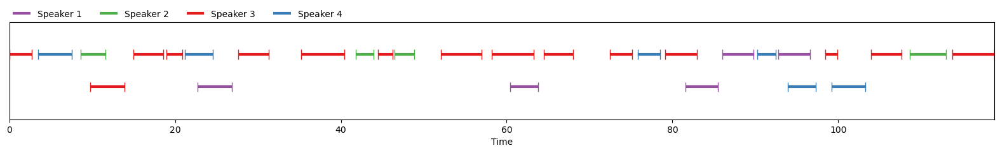

In [96]:
# recall the predicted pyannote
pred_reference_pyannote

In [97]:
# recall the predicted pyannote
print(pred_reference_pyannote)

[ 00:00:00.000 -->  00:00:02.704] _ Speaker 3
[ 00:00:03.440 -->  00:00:07.552] _ Speaker 4
[ 00:00:08.608 -->  00:00:11.612] _ Speaker 2
[ 00:00:09.766 -->  00:00:13.888] _ Speaker 3
[ 00:00:14.960 -->  00:00:18.544] _ Speaker 3
[ 00:00:18.960 -->  00:00:20.896] _ Speaker 3
[ 00:00:21.168 -->  00:00:24.528] _ Speaker 4
[ 00:00:22.723 -->  00:00:26.832] _ Speaker 1
[ 00:00:27.632 -->  00:00:31.280] _ Speaker 3
[ 00:00:35.200 -->  00:00:40.432] _ Speaker 3
[ 00:00:41.824 -->  00:00:43.936] _ Speaker 2
[ 00:00:44.480 -->  00:00:46.208] _ Speaker 3
[ 00:00:46.496 -->  00:00:48.826] _ Speaker 2
[ 00:00:52.032 -->  00:00:56.960] _ Speaker 3
[ 00:00:58.192 -->  00:01:03.246] _ Speaker 3
[ 00:01:00.438 -->  00:01:03.776] _ Speaker 1
[ 00:01:04.512 -->  00:01:07.984] _ Speaker 3
[ 00:01:12.462 -->  00:01:15.136] _ Speaker 3
[ 00:01:15.856 -->  00:01:18.496] _ Speaker 4
[ 00:01:19.104 -->  00:01:22.952] _ Speaker 3
[ 00:01:21.566 -->  00:01:25.456] _ Speaker 1
[ 00:01:26.064 -->  00:01:29.760] 

In [98]:
for spk, start_time, end_time, text in sorted_pred_spk_time_text:
    print(f'{round(start_time, 2)} -> {round(end_time, 2)} {spk}: {text}')

0 -> 2.69 Speaker 3: YES AND A VERY RESPECTABLE ONE
3.44 -> 7.53 Speaker 4: OUR SCANDALOUS PROCEEDINGS OFTEN EXPOSED US TO THE GREATEST DANGER
8.51 -> 11.61 Speaker 2: SHASTA RAMBLES AND MODOC MEMORIES
9.77 -> 13.86 Speaker 3: THE LADY IS NOT THE MOTHER OF THE BOYS BUT THEIR AUNT
14.97 -> 18.52 Speaker 3: THE BOYS BELONG TO THE GENTLEMAN WHO IS A WIDOWER
18.96 -> 20.88 Speaker 3: GEORGE NODDED
21.17 -> 24.53 Speaker 4: THIS IS THE AMUSING ADVENTURE WHICH CLOSED OUR EXPLOITS
22.72 -> 26.82 Speaker 1: ONE WHO WRITES OF SUCH AN ERA LABOURS UNDER A TROUBLESOME DISADVANTAGE
27.63 -> 31.28 Speaker 3: THE BOYS LOOK WIDE AWAKE ENOUGH IF THE FATHER DOES NOT
35.2 -> 40.42 Speaker 3: DO THEY STILL INSIST THAT MISS CHALLONER WAS THE ONLY PERSON IN THE ROOM WITH THEM AT THIS TIME
41.47 -> 43.94 Speaker 2: BUT IT IS FAR BETTER TO GO AFOOT
44.49 -> 46.19 Speaker 3: GEORGE
46.49 -> 48.83 Speaker 2: ONLY A LITTLE FOOD WILL BE REQUIRED
52.04 -> 56.94 Speaker 3: I KNOW IT SOUNDS FOOLISH BUT THE ALTERNATI